## **ABCDEats Company - Customer Segmentation**

# **The Project:** 


**Types of Customer Segmentation:**
* Demographic Segmentation

* Geographic Segmentation

* Psychographic Segmentation

* Behavioral Segmentation

`Sources`:
* Forbes Advisor: https://www.forbes.com/advisor/business/customer-segmentation/ 
* VWO : https://vwo.com/blog/visitor-segmentation/ 



## **Group Members:**

* **Guilherme Goudinho**- 20211552
* **Maria Inês Assunção**- 20211605
* **Osmáiny Raimundo**- e20191506
* **Vinincius Lallo**- 20211682

## **METADATA**
 * **customer_id** :  Unique identifier for each customer.

 * **customer_region**:  Geographic region where the customer is located.

 * **customer_age**:  Age of the customer.

 * **vendor_count**:  Number of unique vendors the customer has ordered from.

 * **product_count**:  Total number of products the customer has ordered.

 * **is_chain**:  Indicates whether the customer’s order was from a chain restaurant. From the product_count, which ones are from a chain restaurant

 * **first_order** :  Number of days from the start of the dataset when the customer first placed an order.


 * **last_order** Number of days from the start of the dataset when the customer most  recently placed an order.


 * **last_promo** :  The category of the promotion or discount most recently used by the
 customer.

 * **payment_method** :  Method most recently used by the customer to pay for their orders.

 * **CUI_American, CUI_Asian, CUI_Chinese, CUI_Italian, etc**. : The amount in monetary units spent by the customer from the indicated type of cuisine.

 * **DOW_0 to DOW_6**:   Number of orders placed on each day of the week
 (0 =Sunday, 6 =Saturday).

 * **HR_0 to HR_23** :  Number of orders placed during each hour of the day
 (0 =midnight, 23 = 11 PM).
 




## **TABLE OF CONTENTS**

1. [Imports](#Imports)
    
2. [Exploratory Data Analysis](#Exploratory-Data-Analysis)
    1. [Data Exploration](#Data-Exploration)
        1. [Importing the Data](#Importing-the-Data)
        2. [Initial Analysis](#Initial-Analysis)
        3. [Checking Duplicated Values](#Checking-Duplicated-Values)
        4. [Checking Missing Values](#Checking-Missing-Values)
        5. [Coherence Check](#Coherence-Check)

    2. [Data Statistics](#Data-Statistics)
        1. [Numerical Variables](#Numerical-Variables)
        2. [Categorical Variables](#Categorical-Variables)

    3. [Visual Exploration](#Visual-Exploration)
        1. [Numerical Variables](#Visual-Numerical-Variables)
        2. [Categorical Variables](#Visual-Categorical-Variables)

 
    

# **1.Imports**

In [266]:
#Importing the necessary libraries for our analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from math import ceil
from PIL import Image
from IPython.display import display
from matplotlib.animation import Animation #For the sequential HR graphs
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation #For the sequential HR graphs
from scipy.stats import chi2_contingency



from itertools import product

# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")


from ydata_profiling import ProfileReport

# for better resolution plots
%config InlineBackend.figure_format = 'retina' # optionally, you can change 'svg' to 'retina'

# Setting seaborn style
sns.set()

# to see all the columns
pd.set_option('display.max_columns', None)

# **2. Exploratory Data Analysis**

## **2.1. Data Exploration**

## **2.1.1 Importing the data**

In [267]:
#Importing our dataset into a variable "food_df"
food_df=pd.read_csv("DM2425_ABCDEats_DATASET.csv")

## **2.1.2 Initial Analysis**

In [268]:
#Checking the first 6 rows of our dataset
food_df.head(6)
#Comments:
#We will have to turn the customer id as our index column
#The first order was the day that the purchase was done, from 0 to 90 days, if we have day 0, it is because the purchase was made the day the datset started
#There are purchases that din´t happen? How is it possible?

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
0,1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
1,5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
4,4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,6aef2b6726,8670,40.0,2,2,0,0.0,2,FREEBIE,DIGI,0.00,24.92,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [269]:
food_df.tail(5) #Checking if there are any aggregation rows that may affect our dataset, which in this case, there aren´t any

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
31883,f4e366c281,8670,30.0,1,1,1,NaN,0,FREEBIE,DIGI,0.00,0.00,18.04,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
31884,f6b6709018,8670,NaN,1,1,0,NaN,0,DELIVERY,DIGI,18.04,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
31885,f74ad8ce3f,8670,24.0,1,1,1,NaN,0,-,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,17.79,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
31886,f7b19c0241,8670,34.0,1,1,0,NaN,0,DISCOUNT,DIGI,0.00,12.03,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
31887,fd40d3b0e0,4660,30.0,1,1,0,NaN,0,-,CASH,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,7.91,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [270]:
# checking the number of columns and rows of our dataset
print(f"Our dataset has \033[1;35m{food_df.shape[0]}\033[0m rows and \033[1;35m{food_df.shape[1]}\033[0m columns.")


Our dataset has 31888 rows and 56 columns.


In [271]:
#Getting the information about our dataset: column, column length, and datatype, in order to identify possible wrong dataypes
food_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31888 entries, 0 to 31887
Data columns (total 56 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_id               31888 non-null  object 
 1   customer_region           31888 non-null  object 
 2   customer_age              31161 non-null  float64
 3   vendor_count              31888 non-null  int64  
 4   product_count             31888 non-null  int64  
 5   is_chain                  31888 non-null  int64  
 6   first_order               31782 non-null  float64
 7   last_order                31888 non-null  int64  
 8   last_promo                31888 non-null  object 
 9   payment_method            31888 non-null  object 
 10  CUI_American              31888 non-null  float64
 11  CUI_Asian                 31888 non-null  float64
 12  CUI_Beverages             31888 non-null  float64
 13  CUI_Cafe                  31888 non-null  float64
 14  CUI_Ch

In [272]:
food_df['is_chain'].value_counts() #Getting the value counts to better understand this column. 

is_chain
1     8547
0     6104
2     5893
3     3698
4     2165
5     1380
6      946
7      679
8      500
9      374
10     291
11     248
12     169
13     152
14     138
15      89
16      68
18      65
17      55
19      35
20      34
21      29
22      26
24      23
23      20
26      20
27      16
25      14
28      13
29      10
31       9
30       9
32       8
33       6
34       6
36       5
43       5
40       5
37       4
35       4
45       4
39       2
42       2
48       2
75       1
63       1
54       1
83       1
49       1
46       1
61       1
44       1
67       1
56       1
81       1
73       1
47       1
38       1
65       1
80       1
Name: count, dtype: int64

In [273]:
food_df['first_order'] 

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
31883    NaN
31884    NaN
31885    NaN
31886    NaN
31887    NaN
Name: first_order, Length: 31888, dtype: float64

There NaN values don't make sense because if the customer is registered in the dataset, that means an order placed and this should represent the first_order

In [274]:
food_df['HR_0'].value_counts()

HR_0
0.0    30723
Name: count, dtype: int64

We realized that no purchase is done at HR_O. We need to explore that better, later on.


## **2.1.3.Checking Duplicate Values**


Checking the duplicated rows of our dataset, and then in the customer id column, because it is going to be our index column

In [275]:
#Checking the duplicate values
duplicates=food_df.duplicated().sum()
print(f"Our dataset has \033[1;35m{duplicates}\033[0m duplicated rows")

Our dataset has 13 duplicated rows


Understanding these duplicated rows

In [276]:
food_df[food_df.duplicated(keep=False)]


,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
3355,b55012ee1c,8550,23.0,4,11,1,2.0,89,FREEBIE,CARD,0.00,93.43,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,3,2,3,1,1,0,0,0.0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3379,b55012ee1c,8550,23.0,4,11,1,2.0,89,FREEBIE,CARD,0.00,93.43,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,3,2,3,1,1,0,0,0.0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7867,24251eb7da,8550,28.0,4,8,3,7.0,85,-,CARD,30.44,18.54,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,32.27,0.0,1,0,3,0,0,0,1,0.0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
7887,24251eb7da,8550,28.0,4,8,3,7.0,85,-,CARD,30.44,18.54,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,32.27,0.0,1,0,3,0,0,0,1,0.0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
16227,671bf0c738,8550,25.0,4,7,3,23.0,66,FREEBIE,CARD,56.18,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,30.53,0.0,0,1,1,1,0,1,0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0
16230,671bf0c738,8550,25.0,4,7,3,23.0,66,FREEBIE,CARD,56.18,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,30.53,0.0,0,1,1,1,0,1,0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0
20855,742ca068fc,8550,20.0,1,2,0,35.0,35,-,CARD,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,31.57,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
20907,742ca068fc,8550,20.0,1,2,0,35.0,35,-,CARD,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,31.57,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
24328,df91183978,8550,23.0,2,3,1,47.0,52,DELIVERY,CARD,0.00,18.78,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,17.34,0.0,0,0,1,0,1,0,0,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
24329,df91183978,8550,23.0,2,3,1,47.0,52,DELIVERY,CARD,0.00,18.78,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,17.34,0.0,0,0,1,0,1,0,0,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


- We have observed that all the duplicated values come from Customer Region `8550`
- All the last_promo classes are represented for these duplicated rows

Now, we should drop these duplicated values

In [277]:
#Dropping the duplicated rows
food_df.drop_duplicates(inplace=True)
new_duplicates=food_df.duplicated().sum()

In [278]:
#Checking again, if we still have duplicated rows
print(f"Our dataset has now \033[1;35m{new_duplicates}\033[0m duplicated rows")

Our dataset has now 0 duplicated rows


In [279]:
#Checking if our customer_id column has duplicates 
customer_duplicate=food_df['customer_id'].duplicated().sum()
print(f"Our The customer_id column has \033[1;35m{customer_duplicate}\033[0m duplicated entries")

Our The customer_id column has 0 duplicated entries


Now that customer_id has no duplicated values, in the coherence check section, we can set it as our index column

## **2.1.4.Checking the Missing Values**

In this section, we will check the columns that have missing values, these will reduce the number of data available to be analysed, thus they should be propely analyzed and dealt with.

In [280]:
#Checking how many missing values we have for each column

# Checking and printing columns with missing values
for column in food_df.columns:
    missing_values = food_df[column].isna().sum()
    if missing_values > 0:
        print(f"\033[1;35m{column} \033[0m has \033[1;35m{missing_values}\033[0m missing values")

customer_age  has 727 missing values
first_order  has 106 missing values
HR_0  has 1164 missing values


Replacing "-" 

While looking at data, We noticed that some missing data in categorical varibales that were labeled as - we should replace them by NaN, but to do our analysis, it would be interesting too see the behaviour of those entries, since these are categorical variables, so we will replace them by "nopromo" in the case of last promo, and "noregion" in the case of customer region.


Last_promo

In [281]:
#Replacing the - by NOPROMO
food_df['last_promo'].replace("-", "NOPROMO", inplace=True)  

In [282]:
#Getting the unique values of last_promo, after changes
food_df['last_promo'].unique()

array(['DELIVERY', 'DISCOUNT', 'NOPROMO', 'FREEBIE'], dtype=object)

Customer region

In [283]:
#Replacing the - by No Region
food_df['customer_region'].replace("-", "NoRegion", inplace=True) 

In [284]:
#Checking the unique values after changes
food_df['customer_region'].unique()

array(['2360', '8670', '4660', '2440', 'NoRegion', '4140', '2490', '8370',
       '8550'], dtype=object)

In [285]:
#In case there are other missing values in different forms, we will replace them by NaN
food_df.replace(["","?"," ","null", "NK", "na"], np.nan, inplace = True)
food_df.isna().sum()

customer_id                    0
customer_region                0
customer_age                 727
vendor_count                   0
product_count                  0
is_chain                       0
first_order                  106
last_order                     0
last_promo                     0
payment_method                 0
CUI_American                   0
CUI_Asian                      0
CUI_Beverages                  0
CUI_Cafe                       0
CUI_Chicken Dishes             0
CUI_Chinese                    0
CUI_Desserts                   0
CUI_Healthy                    0
CUI_Indian                     0
CUI_Italian                    0
CUI_Japanese                   0
CUI_Noodle Dishes              0
CUI_OTHER                      0
CUI_Street Food / Snacks       0
CUI_Thai                       0
DOW_0                          0
DOW_1                          0
DOW_2                          0
DOW_3                          0
DOW_4                          0
DOW_5     

In [286]:

# Checking and printing columns with missing values afetr the replacedment
for column in food_df.columns:
    missing_values = food_df[column].isna().sum()
    if missing_values > 0:
        print(f"\033[1;35m{column} \033[0m has \033[1;35m{missing_values}\033[0m missing values")

customer_age  has 727 missing values
first_order  has 106 missing values
HR_0  has 1164 missing values


Getting the unique values of the columns with missing value

In [287]:
#Getting the unique values of first_order
food_df['first_order'].unique()

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
       26., 27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38.,
       39., 40., 41., 42., 43., 44., 45., 46., 47., 48., 49., 50., 51.,
       52., 53., 54., 55., 56., 57., 58., 59., 60., 61., 62., 63., 64.,
       65., 66., 67., 68., 69., 70., 71., 72., 73., 74., 75., 76., 77.,
       78., 79., 80., 81., 82., 83., 84., 85., 86., 87., 88., 89., 90.,
       nan])

In [288]:
#Getting the unique values of customer_region
food_df['customer_region'].unique()

array(['2360', '8670', '4660', '2440', 'NoRegion', '4140', '2490', '8370',
       '8550'], dtype=object)

In [289]:
#Getting the unique values of customer_age
food_df['customer_age'].unique()

array([18., 17., 38., nan, 20., 40., 24., 27., 33., 26., 21., 51., 35.,
       22., 31., 15., 47., 19., 28., 32., 25., 37., 42., 48., 16., 34.,
       29., 23., 30., 39., 46., 41., 49., 53., 36., 43., 44., 45., 57.,
       58., 68., 56., 61., 60., 54., 59., 50., 55., 52., 65., 75., 66.,
       79., 80., 63., 77., 62., 69., 72., 64., 76., 74., 67., 70., 78.,
       71., 73.])

In [290]:
#Getting the unique values of last_promo
food_df['last_promo'].unique()

array(['DELIVERY', 'DISCOUNT', 'NOPROMO', 'FREEBIE'], dtype=object)

In [291]:
#Getting the unique values of HR_0
food_df['HR_0'].unique()

array([ 0., nan])

Now we have 5 columns with missing values, later on, we will have to discuss how to deal with each of them

`Key Takeaways:` 
* We identified 13 duplicated values, which were removed.
* We identified 3 columns with missing values, plus 2 categorical varibales with "-" as missing values, wich we replaced it by "NOPROMO" and "NOREGION"
* We analyzed the is_chain column, but this one still needs deeper analysis.
* We identified some incoherences in the is_chain, vendor_count, product_count, first and last order, which will be further analyzed in the next sections.

## **2.1.5.Coherence Check**

In this section we will check the columns with wrong datatypes and discuss ways to correct them. We will also engineer the creation of new columns that will help us with our statistical analysis.



### Changing the Data Types

In [292]:
#Checking again our datatypes
food_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31875 entries, 0 to 31887
Data columns (total 56 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_id               31875 non-null  object 
 1   customer_region           31875 non-null  object 
 2   customer_age              31148 non-null  float64
 3   vendor_count              31875 non-null  int64  
 4   product_count             31875 non-null  int64  
 5   is_chain                  31875 non-null  int64  
 6   first_order               31769 non-null  float64
 7   last_order                31875 non-null  int64  
 8   last_promo                31875 non-null  object 
 9   payment_method            31875 non-null  object 
 10  CUI_American              31875 non-null  float64
 11  CUI_Asian                 31875 non-null  float64
 12  CUI_Beverages             31875 non-null  float64
 13  CUI_Cafe                  31875 non-null  float64
 14  CUI_Chicken

From this result, we observed the following columns with possible wrong datatypes:
* `customer_age`
* `first_order`
* `HR_0`

This is based on the the following: Ages are whole numbers; first_order should be an int because it is a day; HR_0 should be int

In [293]:
# Setting the customer_id column as our index column. Because it has unique values that represent each row of row of our dataset.
food_df = food_df.set_index('customer_id')

We weren´t able to change the datatypes yet, because of the missing values.

In [294]:
# customer_age mudar para int
#food_df['customer_age'] = food_df['customer_age'].astype(int)

In [295]:
# first_order mudar para int
#food_df['first_order'] = food_df['first_order'].astype(int)

In [296]:
food_df[(food_df['vendor_count'] == 0) &
        (food_df['product_count'] == 0)]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4903041977,8670,22.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
c94b288475,8670,26.0,0,0,0,1.0,1,DELIVERY,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
f687717dc1,8670,21.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
c6cf0b76fb,8670,38.0,0,0,0,2.0,2,DELIVERY,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1b7c34738e,8670,24.0,0,0,0,3.0,3,NOPROMO,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177ede2420,8670,30.0,0,0,1,86.0,86,NOPROMO,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0039059c9c,8670,22.0,0,0,1,88.0,88,DISCOUNT,CARD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0e60632fe2,8670,23.0,0,0,0,89.0,89,DISCOUNT,CARD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [297]:
food_df = food_df[~((food_df['vendor_count'] == 0) &
                    (food_df['product_count'] == 0))]

In [298]:
food_df[food_df['product_count'] == 0]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
aed85972bb,4660,27.0,1,0,0,6.0,6,DISCOUNT,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,2.56,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
b2ebe2e6e0,4660,43.0,1,0,0,6.0,6,NOPROMO,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,6.74,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
6f723d9894,4660,36.0,1,0,0,13.0,13,DELIVERY,CASH,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,7.77,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
9d74f2ac81,4660,27.0,1,0,0,19.0,19,DELIVERY,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,19.03,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,1,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
27b7eed8fa,4660,35.0,1,0,0,20.0,20,DISCOUNT,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,4.94,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
6c9e68b2e7,4660,22.0,1,0,0,20.0,20,DISCOUNT,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,22.24,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
c0b330c4df,4660,27.0,1,0,0,23.0,23,DELIVERY,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,14.42,0.0,0.0,0.00,0.0,0.0,0,1,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
68c4faeecb,4660,25.0,1,0,0,26.0,26,FREEBIE,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,12.75,0.0,0.0,0.00,0.0,0.0,0,0,0,0,1,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
48e8abd5bf,4660,34.0,1,0,0,33.0,33,DELIVERY,CASH,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,6.52,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,1,0,0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


In [299]:
food_df.loc[food_df['product_count'] == 0, 'product_count'] = food_df[['DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6']].sum(axis=1)

In [300]:
# Checking again the datatypes after the changes
food_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31737 entries, 1b8f824d5e to fd40d3b0e0
Data columns (total 55 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_region           31737 non-null  object 
 1   customer_age              31010 non-null  float64
 2   vendor_count              31737 non-null  int64  
 3   product_count             31737 non-null  int64  
 4   is_chain                  31737 non-null  int64  
 5   first_order               31631 non-null  float64
 6   last_order                31737 non-null  int64  
 7   last_promo                31737 non-null  object 
 8   payment_method            31737 non-null  object 
 9   CUI_American              31737 non-null  float64
 10  CUI_Asian                 31737 non-null  float64
 11  CUI_Beverages             31737 non-null  float64
 12  CUI_Cafe                  31737 non-null  float64
 13  CUI_Chicken Dishes        31737 non-null  float64
 1

In [301]:
food_df.head(10) # Visualizing the values in the columns

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,12.82,6.39,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,9.20,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,0.00,13.70,0.00,0.0,0.0,0.0,0.0,0.00,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
4eb37a6705,4660,20.0,2,5,0,0.0,2,NOPROMO,DIGI,14.57,40.87,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6aef2b6726,8670,40.0,2,2,0,0.0,2,FREEBIE,DIGI,0.00,24.92,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8475ee66ef,2440,24.0,2,2,2,0.0,2,NOPROMO,CARD,5.88,0.00,1.53,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0
f2f53bcc67,8670,27.0,2,3,2,0.0,2,DISCOUNT,DIGI,11.71,0.00,24.40,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
5b650c89cc,2360,20.0,3,4,2,0.0,3,DISCOUNT,DIGI,2.75,0.00,0.00,0.0,0.0,0.0,0.0,4.39,0.00,0.0,0.0,0.0,7.3,0.0,0.0,0,0,1,0,0,0,2,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1


## Feature Engineering for Vizualizations/Statistics

We added this section because we created new features that will be used for the Data statistics section and visualization section, later on, we will have a Feature Engineering section on the Notebook, where we will better organize/describe our findings.

`Hours of the day columns`

In [302]:
#Dividing the HR columns into midday, evening, and late_night.
#This division was done based on the visualization section, where we observed the 3 peaks of orders.
food_df['midday_orders'] = food_df[['HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13', 'HR_14']].sum(axis=1)
food_df['evening_orders'] = food_df[['HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21']].sum(axis=1)
food_df['late_night_orders'] = food_df[['HR_22', 'HR_23', 'HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6']].sum(axis=1)


`Days of the Week columns`

Assuming the folowwing:
* DOW_0= Monday
* DOW_1= Tuesday
* DOW_2= Wednesday
* DOW_3= Thursday
* DOW_4= Friday
* DOW_5= Saturday
* DOW_6= Sunday

In [303]:
#Agregating, monday, tuesday, wednesday and thursday into a weekday column
food_df['Weekend']= food_df['DOW_4']+food_df['DOW_5']+ food_df['DOW_6']

In [304]:
#Agregating, friday, saturday, and sunday into a weekend column
food_df['Weekday']= food_df[[f'DOW_{i}' for i in range(0,4)]].sum(axis=1).astype(int)

`CUIsines Columns`

The following division based on assumption and observations from the visual analysis, where we saw that some cuisines could be aggregated together.

In [305]:
food_df['Western_Cuisine'] = food_df[['CUI_American', 'CUI_Italian', 'CUI_Chicken Dishes']].sum(axis=1)

food_df['Asian_Cuisine'] = food_df[['CUI_Asian', 'CUI_Chinese', 'CUI_Indian', 'CUI_Japanese', 'CUI_Thai', 'CUI_Noodle Dishes']].sum(axis=1)

food_df['Desserts_Beverages'] = food_df[['CUI_Desserts', 'CUI_Beverages', 'CUI_Cafe']].sum(axis=1)


In the next 2 sections, data statistics and data visualization, we will deepen our analysis on these new variables.

## **2.2.Data Statistics**

In this section we are going to analyse the statistics regarding our features, this will help understand better our variables and their possible implications

## 2.2.1 Numerical Variables

#### **Data Incoherences**

In [306]:
#Defining the numerical varibales
num_food_df=food_df.select_dtypes(exclude='object')

First, we are going to make an aggregation to get the total number of orders per customer, both by day of the week and hour of the day. We are doing this because while analysing our dataset in excel, we observed a difference in the total of hour of the day and the total in day of the week, as seen in the image bellow:

In [307]:
discrp = Image.open('discrepancy.png')


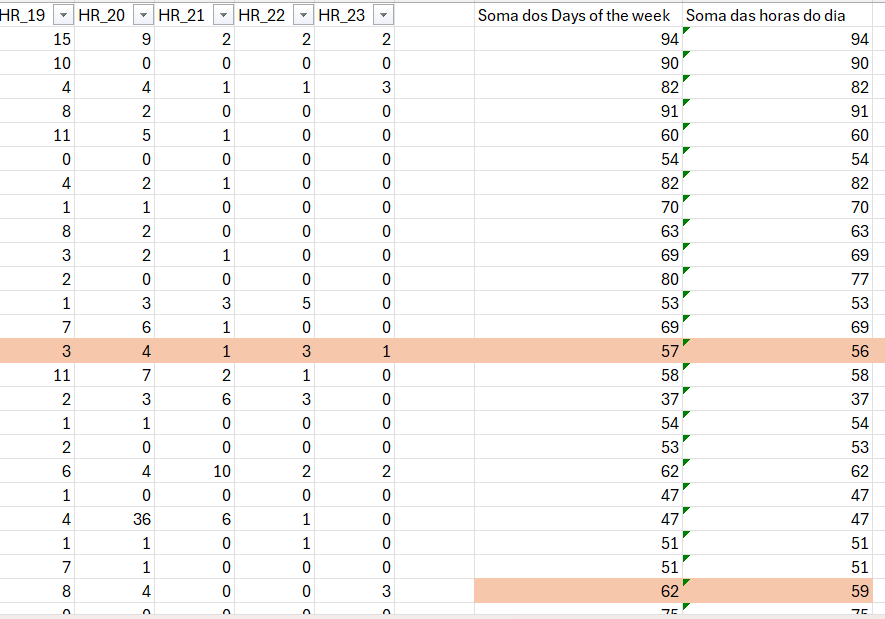

In [308]:
display(discrp)


And now we try to observe this using python

In [309]:
#Getting the total orders by the hour of the day and assigning it to a column
food_df['Total orders'] = food_df[['DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6']].sum(axis=1)

In [310]:
#Getting the total orders by the days of the week into a new column
food_df['Total orders_HR'] = food_df[[f'HR_{i}' for i in range(24)]].sum(axis=1).astype(int)


The code bellow, will filter out the rows of HR_0 where there are missing values and showcase the results only in regards to the total orders and total orders_HR columns. That way, we can check any inconsistencies.

In [311]:
# Filtering the rows where HR_0 is NaN
na_hr0 = food_df[food_df['HR_0'].isna()]

#Getting the results with Total orders and Total orders_HR columns
print("Rows where HR_0 is NaN:")
print(na_hr0[['Total orders', 'Total orders_HR']])


Rows where HR_0 is NaN:
             Total orders  Total orders_HR
customer_id                               
ae38da6386              2                1
a21a839c77              4                3
9237d23413              4                3
8c6ffd7357              3                2
67c6c9f9c4              3                2
...                   ...              ...
37b72b449d              1                0
ac382ddfd1              2                1
96f1fc25e3              2                1
d7c7face7e              1                0
6624e03cdd              1                0

[1164 rows x 2 columns]


This difference betweeen the total order and the total order by hour give us an insight on the HR_O column, which has missing values (as observed in the mssing values section). As we can observe, this difference only occurs when there are nan in the HR_0 column, we will use this to fill in the missing values of the HR_0 Column in the Data .

In [312]:
#Creating a discrepancy variable to check the difference between Total order and Total_orders_HR 
discrepancy = food_df['Total orders']- food_df['Total orders_HR']

In [313]:
discrepancy.unique() #Chekcing the unique values just for observation

array([ 0,  1,  2,  3,  5,  4, 12,  9,  8,  7,  6, 11, 15], dtype=int64)

**We can now assure that there is a difference in the total orders by DOW and HR, thus, the values of the discrepancy, will be used to fill in the missing values in the `HR_0 column`.**

    Analysing the Is_Chain variable

In [314]:
#Filtering the rows where is_chain is bigger than product_count
food_df[food_df['is_chain'] > food_df['product_count']]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,Total orders,Total orders_HR
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


We can observe the following anomaly: There are 75 entries, where is_chain is bigger than product_count, but these entries have no purchases in any of the HR, CUISINES and DOW variables, which indicates that they are possibly outliers.

#### **Checking Outliers**

In [315]:
#Getting an overral statistics of our dataset columns
num_food_df.describe().round() 


,customer_age,vendor_count,product_count,is_chain,first_order,last_order,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages
count,31010.0,31737.0,31737.0,31737.0,31631.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,30573.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0,31737.0
mean,28.0,3.0,6.0,3.0,28.0,64.0,5.0,10.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,3.0,3.0,1.0,3.0,4.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,1.0,2.0,2.0,9.0,18.0,4.0
std,7.0,3.0,7.0,4.0,24.0,23.0,12.0,24.0,8.0,6.0,4.0,8.0,5.0,6.0,7.0,11.0,10.0,5.0,10.0,16.0,4.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,3.0,3.0,1.0,3.0,3.0,17.0,30.0,12.0
min,15.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,23.0,1.0,2.0,1.0,7.0,49.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
50%,26.0,2.0,3.0,2.0,22.0,70.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,2.0,8.0,0.0
75%,31.0,4.0,7.0,3.0,44.0,83.0,6.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,1.0,3.0,3.0,12.0,23.0,1.0
max,80.0,41.0,269.0,83.0,90.0,90.0,280.0,897.0,229.0,326.0,220.0,740.0,230.0,256.0,309.0,468.0,706.0,275.0,366.0,454.0,136.0,16.0,17.0,15.0,17.0,16.0,20.0,20.0,0.0,14.0,12.0,11.0,14.0,7.0,8.0,15.0,52.0,23.0,25.0,36.0,26.0,14.0,13.0,23.0,22.0,20.0,24.0,35.0,36.0,11.0,15.0,13.0,71.0,61.0,29.0,45.0,60.0,468.0,1201.0,326.0


* `customer_age`: The standard deviation of 7 indicates that the ages are around the mean, with most ages likely within 21 to 35 (within one standard deviation of the mean). However, the maximum age of 80 shows there's a significant age outlier or a small group of much older customers.

* `CUI_`: as we can see, the Cuisines columns have outliers. For example, for the CUI_Asian, the mean is 10 and the std is 24 and the max value is 897.  Since all values below the 75th percentile are zero, this means that at least 75% of the data is clustered at zero. The remaining 25% includes all non-zero values, likely including the extreme outliers.

We can observe possible outliers in the other columns too. Thus, we will deepen this analysis through visualization tools. But let as try and check the percentage of outliers for each column

#### **Calculating the Percentage of outliers per each column**

Inter-Quartile Range formula:

<br>

$IQR = Q_3 – Q_1$

<br>

---

<br>

**Outliers** are the observations that fall
- below $Q_1 − 1.5 \times IQR$

or

- above $Q_3 + 1.5 \times IQR$

<br>
<br>

In [316]:
outlier_percentages = {}

# We know that low outliers are below Q 1 − 1.5 ⋅ IQR ‍ and high outliers are above Q 3 + 1.5 ⋅ IQR 
for column in food_df.columns:
    if pd.api.types.is_numeric_dtype(food_df[column]):
        #Defining Q1 and Q3 to then find IQR 
        Q1 = food_df[column].quantile(0.25)
        Q3 = food_df[column].quantile(0.75)
        IQR = Q3 - Q1
        #Getting the outliers below the first quantile and above the second quantile
        outliers = food_df[(food_df[column] < (Q1 - 1.5 * IQR)) | (food_df[column] > (Q3 + 1.5 * IQR))]
        #Getting the percentage of the outliers
        percentage_outliers = (len(outliers) / len(food_df)) * 100
        outlier_percentages[column] = percentage_outliers

#Printing the results and counting the number of columns per the percentage higher or lower than 5.
nr_col_lower_5=0
nr_col_higher_5=0
print("Percentage of outliers per column using IQR:")
for column, percentage in outlier_percentages.items():
    print(f"{column}: \033[1;35m{percentage:.2f}%\033[0m")
    if percentage <5:
        nr_col_lower_5+=1
    if percentage >5:
        nr_col_higher_5+=1

#Printing the number of columns who have a percentage lower than 5% and then higher than 5%. 
# We chose 5% becasue it was the percentage advised during classes
print(f"From the columns, \033[1;33m{nr_col_lower_5}\033[0m have a percentage lower than 5%")
print(f"From the columns, \033[1;33m{nr_col_higher_5}\033[0m have a percentage higher than 5%")

Percentage of outliers per column using IQR:
customer_age: 3.40%
vendor_count: 4.80%
product_count: 7.47%
is_chain: 9.94%
first_order: 0.00%
last_order: 0.00%
CUI_American: 10.97%
CUI_Asian: 10.91%
CUI_Beverages: 17.11%
CUI_Cafe: 4.30%
CUI_Chicken Dishes: 10.23%
CUI_Chinese: 11.10%
CUI_Desserts: 6.35%
CUI_Healthy: 6.83%
CUI_Indian: 10.86%
CUI_Italian: 20.32%
CUI_Japanese: 19.85%
CUI_Noodle Dishes: 7.01%
CUI_OTHER: 22.19%
CUI_Street Food / Snacks: 13.37%
CUI_Thai: 7.49%
DOW_0: 4.43%
DOW_1: 4.71%
DOW_2: 5.00%
DOW_3: 5.21%
DOW_4: 5.62%
DOW_5: 5.38%
DOW_6: 6.23%
HR_0: 0.00%
HR_1: 4.04%
HR_2: 4.69%
HR_3: 7.94%
HR_4: 7.46%
HR_5: 6.38%
HR_6: 5.51%
HR_7: 5.96%
HR_8: 9.30%
HR_9: 15.51%
HR_10: 20.79%
HR_11: 23.73%
HR_12: 20.47%
HR_13: 17.18%
HR_14: 16.08%
HR_15: 19.03%
HR_16: 22.51%
HR_17: 23.99%
HR_18: 21.08%
HR_19: 15.41%
HR_20: 9.67%
HR_21: 5.55%
HR_22: 3.72%
HR_23: 3.54%
midday_orders: 7.51%
evening_orders: 7.70%
late_night_orders: 6.77%
Weekend: 4.88%
Weekday: 7.26%
Western_Cuisine: 7.85%
A

As observed, there are plenty of columns with outliers, but before removing them, we have to firstly analyse if it makes sense to remove them or not. For example, the `CUI columns` which have highest percentages of outliers, we should analise first what it means and how they affect our objective.  The quantile function skips missing values by default, however, they do reduce the number of data points, which could slightly affect the precision of the outlier threshold.

`Key Takeaways - Trends and anomalies`:
* We have found the values of the HR_0 column, which we initially thought as beeing empty because no one buys at that time.

* There are 75 entries in the dataset, when is_chain is bigger than product count, those rows shouldn´t exist because there is no purchase entry.

* We have observed that there a considerate ammount of ouliers in our dataset, and how they behave in each column

## 2.2.2 Categorical Variables

In [317]:
#Assigning the categorical features into a varibale called cat_food_df
cat_food_df=food_df.select_dtypes(include='object')

In [318]:
cat_food_df.describe() #Getting the statistics of the categorical variables

,customer_region,last_promo,payment_method
count,31737,31737,31737
unique,9,4,3
top,8670,NOPROMO,CARD
freq,9623,16693,20099


**Through Academic knowledge, we know that there 4 types of customer segmentation:**
* Demographic Segmentation
* Geographic Segmentation
* Psychographic Segmentation
* Behavioral Segmentation

**Hence, will take a closer look into our Region feature which is a geographic feature**

In [319]:
food_df.customer_region.unique()

array(['2360', '8670', '4660', '2440', 'NoRegion', '4140', '2490', '8370',
       '8550'], dtype=object)

There are 9 unique values for this feature that describe 8 customer regions in our dataset. (no_region indicates an empty entry)

In [320]:
#Getting the frequency of orders per each region
food_df.customer_region.value_counts()

customer_region
8670        9623
4660        9550
2360        8829
2440        1483
4140         857
8370         495
2490         445
NoRegion     442
8550          13
Name: count, dtype: int64

Let us see that as a percentage

In [321]:
#Getting the perceante of entries for each custmer region
percentage_region=food_df.customer_region.value_counts(normalize=True) *100
percentage_region.round(2)

customer_region
8670        30.32
4660        30.09
2360        27.82
2440         4.67
4140         2.70
8370         1.56
2490         1.40
NoRegion     1.39
8550         0.04
Name: proportion, dtype: float64

As described in the project’s description, we were looking at data from 3 different cities, but we had 8 unique regions and some entries with no region specified/identified in the dataset so we decided to aggregate these regions according to the following pattern (3 regions use codes in the 8000’s range, 2 regions use codes in the 4000’s range, 3 regions use codes in the 2000’s range) so we assumed that the entries that used the region codes within these intervals belonged to the same city. Therefore, our final possible unique values could be ‘8000’, ‘4000’, ‘2000’, ‘no_region’ representing our 3 cities (we intend on exploring this solution on the second part of the project as we want to further explore the implications of these aggregations).

We can observe that the following regions have a percentage of entries higher than 10%

In [322]:
#Getting the regions with the entries higher than 10%
for region, percent in percentage_region[percentage_region > 10].items():
    print(f"Region \033[1;35m{region}\033[0m: {percent:.2f}%")

Region 8670: 30.32%
Region 4660: 30.09%
Region 2360: 27.82%


It would be interesting to know why these are the regions with the most entries, and why are the other 5 regions with such low percentage. An interesting take is that, the region with the lowest entries, 8550, was also the region that had the 13 duplicated values identified in the `Duplicated rows`section.

<div class="alert alert-block alert-info">
<b>Observation: </b> We realized that, the dataset, as described in the project guidelines, is from 3 cities, yet we see 9 entries in the customer region. We also observed that The first value of regions with the highest entries appear 3 times each. e.g: 8670, 8370, and 8550; 2360, 2440 and 2490; 4660 and 4140.
</div>

Getting the statistics of the other columns for each type of customer region

    Region: 2360

In [323]:
food_df[food_df['customer_region'] == "2360"].describe().round(2)

,customer_age,vendor_count,product_count,is_chain,first_order,last_order,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,Total orders,Total orders_HR
count,8609.00,8829.00,8829.00,8829.00,8806.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8487.0,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00,8829.00
mean,27.47,3.70,6.68,4.44,25.02,63.10,2.02,1.90,2.22,0.26,2.05,2.66,0.41,0.47,1.95,0.76,1.76,2.13,4.03,0.35,0.76,0.66,0.68,0.71,0.73,0.78,0.77,0.85,0.0,0.04,0.03,0.01,0.01,0.01,0.01,0.04,0.12,0.15,0.23,0.56,0.55,0.37,0.26,0.23,0.27,0.46,0.59,0.54,0.35,0.16,0.09,0.07,2.28,2.60,0.26,2.41,2.78,4.83,11.17,2.89,5.19,5.14
std,7.22,3.45,8.86,5.47,22.84,23.05,5.27,6.38,7.30,2.46,5.07,12.94,2.24,3.32,8.27,3.13,6.01,7.73,9.21,2.19,3.48,1.20,1.23,1.24,1.22,1.23,1.28,1.37,0.0,0.26,0.23,0.14,0.11,0.09,0.11,0.36,0.88,0.66,0.73,1.32,1.23,0.83,0.67,0.63,0.73,1.03,1.20,1.14,0.94,0.53,0.38,0.33,3.69,3.46,0.85,3.06,3.90,8.55,23.13,8.42,6.32,6.29
min,15.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
25%,22.00,2.00,2.00,2.00,6.00,48.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,1.00,0.00,0.00,0.00,2.00,2.00
50%,26.00,3.00,4.00,3.00,18.00,69.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,2.00,0.00,2.00,2.00,1.70,5.52,0.00,3.00,3.00
75%,31.00,5.00,8.00,5.00,38.00,83.00,2.09,0.00,1.18,0.00,1.88,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.02,0.00,0.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,3.00,3.00,0.00,3.00,3.00,6.64,13.39,2.67,6.00,6.00
max,79.00,41.00,269.00,83.00,89.00,90.00,174.41,196.00,229.22,111.42,107.73,739.73,50.25,209.81,309.07,143.64,211.78,275.11,202.54,96.80,109.64,16.00,17.00,15.00,17.00,16.00,20.00,20.00,0.0,7.00,10.00,3.00,5.00,3.00,3.00,14.00,52.00,23.00,20.00,36.00,26.00,14.00,10.00,16.00,22.00,20.00,20.00,20.00,36.00,11.00,7.00,8.00,71.00,61.00,23.00,45.00,60.00,183.02,1201.27,242.42,94.00,94.00


- The the Average number of orders for the customer region `2360` is 5.19
- The min number of orders is 1 and the max is 94
- The Asian cuisine has the highest average spent, with 11.17
- The averages of the Weekend and Weekday orders seem pretty close to each other and don't differenciate much
- In the time of the orders, the late_night_orders have the lowest average of orders, with 0.26
- The average age for this region is 27

    Region: 8670

In [324]:
food_df[food_df['customer_region'] == "8670"].describe().round(2)

,customer_age,vendor_count,product_count,is_chain,first_order,last_order,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,Total orders,Total orders_HR
count,9407.00,9623.00,9623.00,9623.00,9576.00,9623.00,9623.00,9623.00,9623.00,9623.0,9623.0,9623.00,9623.00,9623.00,9623.0,9623.0,9623.00,9623.0,9623.00,9623.00,9623.0,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9046.0,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.00,9623.0,9623.00,9623.00,9623.00,9623.00,9623.00
mean,27.52,2.95,4.95,1.85,30.75,62.86,5.69,23.14,4.75,0.0,0.0,1.18,2.23,1.14,0.0,0.0,3.64,0.0,0.10,10.89,0.0,0.50,0.49,0.51,0.51,0.50,0.53,0.56,0.0,0.12,0.16,0.34,0.30,0.24,0.18,0.15,0.18,0.30,0.38,0.32,0.21,0.16,0.13,0.10,0.07,0.04,0.02,0.01,0.01,0.01,0.03,0.05,1.84,0.25,1.42,1.59,2.0,5.69,27.96,6.98,3.59,3.51
std,7.13,2.41,5.08,2.12,24.38,23.48,12.43,34.06,12.60,0.0,0.0,5.51,8.72,6.49,0.0,0.0,10.39,0.0,2.08,25.23,0.0,0.84,0.85,0.84,0.86,0.83,0.84,0.91,0.0,0.48,0.55,0.81,0.73,0.59,0.51,0.45,0.57,0.74,0.84,0.72,0.53,0.47,0.45,0.38,0.31,0.22,0.15,0.11,0.11,0.09,0.26,0.32,2.22,0.72,1.99,1.78,2.3,12.43,37.39,15.59,3.49,3.39
min,15.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,1.00,0.00
25%,23.00,1.00,2.00,1.00,9.00,49.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.0,0.00,0.00,0.00,2.00,2.00
50%,26.00,2.00,3.00,1.00,26.00,70.00,0.00,12.61,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,1.00,1.0,0.00,18.35,0.00,3.00,2.00
75%,31.00,4.00,6.00,2.00,49.00,83.00,6.18,30.82,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.00,12.06,0.0,1.00,1.00,1.00,1.00,1.00,1.00,1.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,2.00,2.00,3.0,6.18,36.78,6.57,4.00,4.00
max,80.00,30.00,64.00,32.00,89.00,89.00,231.75,537.49,192.43,0.0,0.0,106.82,230.07,238.02,0.0,0.0,205.21,0.0,111.52,454.45,0.0,9.00,11.00,8.00,10.00,9.00,10.00,14.00,0.0,14.00,12.00,11.00,14.00,7.00,8.00,8.00,20.00,11.00,16.00,14.00,6.00,5.00,9.00,6.00,6.00,4.00,3.00,2.00,3.00,3.00,15.00,13.00,23.00,11.00,29.00,22.00,30.0,231.75,604.18,238.92,52.00,41.00


- The the Average number of orders for the customer region `8670` is 3.59
- The following cuisines have no purchases: CUI_Indian, CUI_Italian, CUI_Cafe, CUI_Noodle Dishes, and CUI_Thai
- The min number of orders is 1 and the max is 52
- The Asian cuisine has the highest average spent, with 27.96
- The average of the weekday orders is higher than the average of the weekend
- In the time of the orders, the midday_orders have the highest average number of orders, with evening_orders having the lowest average
- The average age for this region is 27

    Region: 4660

In [325]:
food_df[food_df['customer_region'] == "4660"].describe().round(2)

,customer_age,vendor_count,product_count,is_chain,first_order,last_order,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,Total orders,Total orders_HR
count,9334.00,9550.00,9550.00,9550.00,9524.00,9550.00,9550.00,9550.00,9550.0,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.0,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9458.0,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.0,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00,9550.00
mean,27.53,2.83,5.73,2.37,28.70,65.56,7.39,5.58,0.0,2.34,0.24,0.56,0.00,1.42,3.21,8.73,4.10,0.0,5.14,0.48,1.91,0.54,0.56,0.60,0.67,0.80,0.69,0.74,0.0,0.01,0.00,0.00,0.00,0.01,0.02,0.05,0.11,0.27,0.41,0.29,0.2,0.19,0.26,0.52,0.77,0.71,0.43,0.19,0.07,0.04,0.02,0.02,1.79,2.72,0.08,2.23,2.37,16.36,15.36,2.35,4.60,4.59
std,7.18,2.32,6.89,3.41,24.41,22.92,14.96,16.54,0.0,11.29,3.46,4.88,0.12,7.41,10.35,17.04,13.67,0.0,14.23,3.68,7.07,1.02,1.07,1.08,1.14,1.19,1.08,1.21,0.0,0.10,0.06,0.04,0.04,0.09,0.21,0.33,0.49,0.83,1.11,0.79,0.6,0.58,0.67,1.03,1.23,1.20,0.92,0.59,0.34,0.23,0.20,0.14,3.15,3.17,0.43,2.61,3.35,24.00,27.44,11.29,5.29,5.28
min,15.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
25%,22.00,1.00,2.00,0.00,7.00,53.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,2.00,2.00
50%,26.00,2.00,3.00,1.00,22.00,74.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,2.00,0.00,2.00,1.00,9.72,7.06,0.00,3.00,3.00
75%,31.00,3.00,7.00,3.00,45.00,84.00,9.86,5.27,0.0,0.00,0.00,0.00,0.00,0.00,0.00,12.01,0.00,0.0,3.33,0.00,0.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,1.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,2.00,3.00,0.00,3.00,3.00,21.44,20.58,0.00,5.00,5.00
max,80.00,29.00,117.00,48.00,89.00,89.00,280.21,896.71,0.0,326.10,219.66,195.30,8.78,255.81,162.38,345.61,706.14,0.0,366.08,112.59,136.38,11.00,13.00,14.00,17.00,14.00,13.00,17.00,0.0,2.00,2.00,2.00,2.00,3.00,7.00,15.00,13.00,14.00,25.00,21.00,13.0,11.00,13.00,23.00,13.00,18.00,24.00,12.00,12.00,5.00,7.00,4.00,49.00,50.00,10.00,35.00,55.00,345.61,896.71,326.10,90.00,90.00


- The the Average number of orders for the customer region `4660` is 4.6
- The min number of orders is 1 and the max is 16.36
- There are no orders in the CUI_Noodle_Dishes, CUI_Beverages Cuisines
- The Western cuisine has the highest average spent, with 27.96
- The averages of the Weekend and Weekday orders seem pretty close to each other and don't differenciate much
- In the time of the orders, the evening_orders have the highest average number of orders, with evening_orders having the lowest average
- The average age for this region is 27

    Region: NoRegion

In [326]:
food_df[food_df['customer_region'] == "NoRegion"].describe().round(2)

,customer_age,vendor_count,product_count,is_chain,first_order,last_order,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,Total orders,Total orders_HR
count,440.00,442.00,442.00,442.00,439.00,442.00,442.00,442.00,442.00,442.0,442.0,442.00,442.00,442.00,442.0,442.0,442.00,442.0,442.00,442.00,442.0,442.00,442.00,442.00,442.00,442.00,442.00,442.00,407.0,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00,442.00
mean,27.10,2.82,4.65,1.86,31.14,60.29,5.87,21.62,4.84,0.0,0.0,0.85,2.23,0.88,0.0,0.0,3.54,0.0,0.03,10.42,0.0,0.49,0.45,0.45,0.50,0.46,0.51,0.53,0.0,0.12,0.16,0.33,0.27,0.22,0.19,0.13,0.19,0.25,0.33,0.26,0.21,0.13,0.13,0.11,0.08,0.04,0.02,0.02,0.00,0.01,0.02,0.09,1.62,0.28,1.39,1.50,1.89,5.87,26.01,7.07,3.39,3.28
std,6.68,2.48,4.63,2.17,25.41,25.01,13.61,29.73,11.41,0.0,0.0,4.48,7.46,6.30,0.0,0.0,9.42,0.0,0.57,22.74,0.0,0.80,0.83,0.86,0.82,0.78,0.83,0.84,0.0,0.43,0.61,0.75,0.62,0.53,0.45,0.40,0.51,0.59,0.77,0.60,0.72,0.40,0.42,0.39,0.37,0.20,0.17,0.12,0.05,0.13,0.16,0.42,2.05,0.82,1.75,1.65,2.22,13.61,31.66,13.76,3.28,3.15
min,17.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
25%,22.00,1.00,2.00,1.00,8.00,43.25,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00
50%,26.00,2.00,3.00,1.00,26.00,68.00,0.00,12.20,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,1.00,1.00,0.00,18.27,0.00,2.00,2.00
75%,30.00,4.00,6.00,2.00,50.00,81.00,5.98,31.06,2.90,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.00,11.87,0.0,1.00,1.00,1.00,1.00,1.00,1.00,1.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,2.00,2.00,2.00,5.98,36.36,11.68,4.00,4.00
max,55.00,23.00,35.00,17.00,89.00,89.00,106.27,286.72,81.07,0.0,0.0,44.23,64.93,96.21,0.0,0.0,79.10,0.0,12.00,176.18,0.0,5.00,6.00,5.00,5.00,5.00,5.00,6.00,0.0,3.00,7.00,7.00,4.00,4.00,3.00,3.00,4.00,5.00,7.00,5.00,9.00,4.00,4.00,4.00,4.00,2.00,2.00,1.00,1.00,2.00,2.00,6.00,21.00,7.00,12.00,12.00,17.00,106.27,286.72,81.99,27.00,27.00


- The the Average number of orders for the customer region `NoRegion` is 3.39
- The min number of orders is 1 and the max is 27
- The following cuisnes have no orders: CUI_Cafe, CUI_Noodle Dishes, CUI_Indian; CUI_Italian, CUI_Thai
- The Asian cuisine has the highest average spent, with 27.96
- The averages of the Weekend and Weekday orders seem pretty close to each other and don't differenciate much
- In the time of the orders, the late_night orders has the highest average number of orders, followed by the midday_orders
- The average age for this region is 27

    Region: 8550

In [327]:
food_df[food_df["customer_region"]=="8550"].describe().round(2)

,customer_age,vendor_count,product_count,is_chain,first_order,last_order,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,Total orders,Total orders_HR
count,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.00,13.0,13.0,13.00,13.0,13.00,13.00,13.00,13.00,13.00,13.00,13.00,12.0,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.0,13.00,13.0,13.00,13.0,13.0,13.0,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00
mean,25.00,2.85,5.23,1.62,49.69,71.38,12.81,22.58,8.21,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.40,0.0,0.0,10.93,0.0,0.54,0.38,0.77,0.77,0.38,0.69,0.31,0.0,0.08,0.15,1.23,0.08,0.15,0.23,0.38,0.23,0.15,0.08,0.15,0.08,0.31,0.08,0.08,0.0,0.15,0.0,0.08,0.0,0.0,0.0,0.08,1.46,0.31,2.00,1.38,2.46,12.81,23.97,8.21,3.85,3.77
std,3.76,2.41,5.33,2.47,26.67,17.01,22.60,28.05,14.64,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.04,0.0,0.0,14.84,0.0,0.97,0.77,1.09,1.36,0.51,1.44,0.63,0.0,0.28,0.38,2.98,0.28,0.38,0.60,0.87,0.60,0.38,0.28,0.38,0.28,0.63,0.28,0.28,0.0,0.38,0.0,0.28,0.0,0.0,0.0,0.28,1.81,0.75,3.44,1.80,3.15,22.60,30.64,14.64,4.39,4.44
min,18.00,1.00,1.00,0.00,2.00,35.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00
25%,23.00,2.00,2.00,0.00,35.00,62.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,2.00,1.00
50%,25.00,2.00,3.00,1.00,53.00,75.00,0.00,18.54,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.00,1.00,0.00,1.00,1.00,1.00,0.00,18.54,0.00,2.00,2.00
75%,28.00,4.00,7.00,2.00,67.00,88.00,17.71,25.41,12.49,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,30.40,0.0,1.00,0.00,1.00,1.00,1.00,1.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.00,2.00,0.00,1.00,1.00,3.00,17.71,25.41,12.49,4.00,4.00
max,31.00,10.00,20.00,9.00,88.00,89.00,62.17,93.43,44.87,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.18,0.0,0.0,32.27,0.0,3.00,2.00,3.00,5.00,1.00,5.00,2.00,0.0,1.00,1.00,10.00,1.00,1.00,2.00,3.00,2.00,1.00,1.00,1.00,1.00,2.00,1.00,1.00,0.0,1.00,0.0,1.00,0.0,0.0,0.0,1.00,7.00,2.00,10.00,7.00,9.00,62.17,93.43,44.87,16.00,16.00


- The the Average number of orders for the customer region `8550` is 3.85
- The min number of orders is 1 and the max is 16
- The Asian cuisine has the highest average spent, with 23.97
- The averge number of orders on weekends is higher than weekdays, but they don't differenciate much
- In the time of the orders, the late_night_orders has the highest average number of orders
- The average age for this region is 25

    Region: 2490

In [328]:
food_df[food_df["customer_region"]=="2490"].describe().round(2)

,customer_age,vendor_count,product_count,is_chain,first_order,last_order,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,Total orders,Total orders_HR
count,438.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,423.0,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00,445.00
mean,27.19,3.31,5.61,4.00,26.35,63.61,1.80,1.18,2.29,0.17,2.77,1.85,0.24,0.27,0.90,0.53,1.15,1.32,3.94,0.58,0.62,0.63,0.60,0.51,0.62,0.67,0.74,0.78,0.0,0.04,0.04,0.02,0.02,0.01,0.01,0.04,0.10,0.12,0.26,0.51,0.45,0.32,0.21,0.19,0.27,0.42,0.43,0.46,0.28,0.14,0.06,0.08,2.01,2.18,0.29,2.19,2.36,5.10,7.03,2.70,4.55,4.48
std,6.73,2.83,5.88,4.24,22.64,22.21,3.85,3.50,5.64,2.29,7.55,5.83,1.75,1.87,3.32,1.85,4.53,4.39,7.65,2.35,2.45,1.03,1.14,0.83,0.96,1.03,1.24,1.30,0.0,0.27,0.25,0.14,0.15,0.13,0.13,0.26,0.47,0.41,0.67,1.08,0.90,0.73,0.51,0.51,0.61,0.90,0.87,1.13,0.65,0.44,0.26,0.41,2.57,2.70,0.95,2.65,2.86,8.86,10.86,6.32,4.68,4.60
min,16.00,1.00,1.00,0.00,0.00,2.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
25%,22.00,1.00,2.00,1.00,7.00,48.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,0.00,0.00,2.00,2.00
50%,26.00,2.00,3.00,2.00,20.00,69.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,1.00,2.00,2.29,2.60,0.00,3.00,3.00
75%,30.00,4.00,7.00,5.00,41.00,83.00,1.87,0.00,1.98,0.00,3.20,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.26,0.00,0.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,3.00,3.00,0.00,3.00,3.00,7.18,9.29,2.70,6.00,6.00
max,56.00,23.00,36.00,28.00,88.00,90.00,26.37,29.63,53.24,46.37,126.89,58.60,29.33,30.30,30.66,12.82,51.93,40.69,58.52,20.45,18.75,7.00,10.00,5.00,6.00,5.00,10.00,10.00,0.0,4.00,2.00,2.00,2.00,2.00,2.00,3.00,5.00,4.00,6.00,11.00,8.00,6.00,3.00,6.00,5.00,9.00,7.00,11.00,5.00,3.00,2.00,4.00,22.00,21.00,8.00,20.00,24.00,126.89,63.99,55.80,31.00,30.00


- The the Average number of orders for the customer region `2490` is 4.55
- The min number of orders is 1 and the max is 31
- The Asian cuisine has the highest average spent, with 7.03
- The orders are distributed through all the cuisnes, meaning that, there is no cusines with no orders
- The averages of the Weekend and Weekday orders seem pretty close to each other and don't differenciate much
- The midday orders and the evening orders have the highest average number of orders
- The average age for this region is 27

    Region: 4140

In [329]:
food_df[food_df["customer_region"]=="4140"].describe().round(2)

,customer_age,vendor_count,product_count,is_chain,first_order,last_order,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,Total orders,Total orders_HR
count,835.00,857.00,857.00,857.00,856.00,857.00,857.00,857.00,857.0,857.00,857.00,857.00,857.0,857.00,857.00,857.00,857.00,857.0,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,830.0,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00,857.00
mean,27.65,1.80,4.19,0.89,35.26,63.99,4.35,1.40,0.0,0.38,0.17,0.22,0.0,0.31,2.07,13.85,1.26,0.0,2.69,1.78,0.91,0.35,0.36,0.42,0.42,0.60,0.48,0.58,0.0,0.02,0.01,0.00,0.00,0.00,0.00,0.02,0.05,0.15,0.19,0.18,0.15,0.16,0.24,0.42,0.49,0.43,0.28,0.15,0.06,0.07,0.05,0.03,1.14,1.91,0.12,1.66,1.54,18.38,5.85,0.38,3.20,3.17
std,6.98,1.33,4.82,1.76,25.74,22.53,11.28,5.95,0.0,2.82,1.70,2.08,0.0,4.29,8.26,26.52,5.89,0.0,7.99,6.89,4.09,0.74,0.71,0.81,0.80,0.88,0.79,0.93,0.0,0.14,0.10,0.05,0.05,0.05,0.03,0.13,0.24,0.51,0.59,0.57,0.44,0.47,0.65,0.80,0.84,0.76,0.62,0.52,0.31,0.32,0.29,0.22,1.91,2.06,0.49,1.75,2.14,27.92,12.65,2.82,3.29,3.29
min,16.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
25%,23.00,1.00,2.00,0.00,13.00,51.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,2.46,0.00,0.00,1.00,1.00
50%,26.00,1.00,3.00,0.00,31.00,70.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,6.69,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,1.00,1.00,11.87,0.00,0.00,2.00,2.00
75%,31.00,2.00,5.00,1.00,56.25,83.00,3.65,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,17.23,0.00,0.0,0.00,0.00,0.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,2.00,0.00,2.00,2.00,22.45,7.22,0.00,4.00,4.00
max,58.00,12.00,70.00,17.00,89.00,89.00,131.92,80.73,0.0,37.68,29.99,39.04,0.0,112.80,91.55,468.33,59.89,0.0,66.21,71.80,60.18,8.00,5.00,6.00,8.00,6.00,6.00,6.00,0.0,2.00,1.00,1.00,1.00,1.00,1.00,2.00,2.00,6.00,6.00,5.00,4.00,4.00,8.00,8.00,6.00,4.00,5.00,6.00,5.00,4.00,3.00,3.00,13.00,19.00,6.00,16.00,19.00,468.33,128.48,37.68,32.00,32.00


- The the Average number of orders for the customer region `4140` is 3.2
- The min number of orders is 1 and the max is 32
- There are no orders in the following cuisnes: CUI_Desserts, CUI_Noodle Dishes, and CUI_Beverages
- The Western cuisine has the highest average spent, with 18.38
- The averages of the Weekend and Weekday orders seem pretty close to each other and don't differenciate much
- The midday_orders and the evening_orders have the highest average number of orders
- The average age for this region is 27

    Region: 8370

In [330]:
food_df[food_df["customer_region"]=="8370"].describe().round(2)

,customer_age,vendor_count,product_count,is_chain,first_order,last_order,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,Total orders,Total orders_HR
count,484.00,495.00,495.00,495.00,494.00,495.00,495.00,495.00,495.00,495.0,495.0,495.00,495.00,495.00,495.0,495.0,495.00,495.0,495.0,495.00,495.0,495.00,495.00,495.00,495.00,495.00,495.00,495.00,469.0,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.0,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00,495.00
mean,27.71,2.14,3.77,1.17,35.93,60.68,4.15,19.78,3.31,0.0,0.0,1.00,2.56,0.79,0.0,0.0,1.65,0.0,0.0,10.10,0.0,0.36,0.39,0.37,0.33,0.38,0.39,0.40,0.0,0.09,0.16,0.25,0.20,0.17,0.13,0.11,0.12,0.22,0.27,0.22,0.16,0.10,0.11,0.08,0.05,0.01,0.01,0.0,0.01,0.01,0.02,0.04,1.31,0.17,1.06,1.17,1.44,4.15,22.43,5.87,2.61,2.54
std,7.39,1.52,3.40,1.48,25.03,24.18,10.98,25.58,10.34,0.0,0.0,4.99,9.01,4.25,0.0,0.0,6.50,0.0,0.0,27.31,0.0,0.64,0.69,0.60,0.63,0.69,0.68,0.68,0.0,0.35,0.53,0.58,0.48,0.47,0.42,0.34,0.42,0.48,0.60,0.61,0.47,0.34,0.39,0.33,0.25,0.11,0.09,0.0,0.09,0.08,0.19,0.22,1.61,0.53,1.32,1.30,1.48,10.98,27.04,14.09,2.17,2.15
min,15.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00
25%,23.00,1.00,2.00,0.00,14.25,44.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.50,0.00,0.00,0.00,1.00,1.00
50%,26.00,2.00,3.00,1.00,32.00,69.00,0.00,12.45,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,1.00,0.00,1.00,1.00,1.00,0.00,17.94,0.00,2.00,2.00
75%,31.00,3.00,5.00,2.00,56.00,81.00,0.00,25.58,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,5.84,0.0,1.00,1.00,1.00,1.00,1.00,1.00,1.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,2.00,0.00,1.00,2.00,2.00,0.00,30.54,5.91,3.00,3.00
max,68.00,11.00,22.00,10.00,89.00,89.00,97.93,149.26,92.46,0.0,0.0,49.97,111.19,49.01,0.0,0.0,72.44,0.0,0.0,263.84,0.0,4.00,6.00,3.00,5.00,6.00,5.00,4.00,0.0,3.00,6.00,5.00,3.00,4.00,5.00,2.00,4.00,3.00,4.00,5.00,5.00,2.00,5.00,3.00,2.00,1.00,1.00,0.0,1.00,1.00,2.00,2.00,14.00,5.00,7.00,8.00,10.00,97.93,165.31,111.19,14.00,14.00


- The the Average number of orders for the customer region `8370` is 2.61
- The min number of orders is 1 and the max is 14
- The Asian cuisine has the highest average spent, with 22.43
- The cuisines with no orders are: CUI_Cafe, CUI_Chicken Dishes, CUI_Indian, CUI_Italian and CUI_Thai
- The averages of the Weekend and Weekday orders seem pretty close to each other and don't differenciate much
- In the time of the orders, the midday_orders have average number of orders, with evening_orders having the lowest average
- The average age for this region is 27

To conclude, these insights about the regions might help us if we decide to do geographic segmentation. Let us analyse the column with other categorical variables.

In [331]:
# Creating a cross-tabulation to see the percentage of times each combination of customer region and last promo appears in the dataset
pd.crosstab(food_df['customer_region'], food_df['last_promo'], normalize=True) *100

last_promo,DELIVERY,DISCOUNT,FREEBIE,NOPROMO
customer_region,,,,
2360,5.857516,4.319879,3.774774,13.867095
2440,0.894855,0.768819,0.627028,2.382078
2490,0.315090,0.226865,0.176450,0.683745
4140,0.485238,0.346599,0.286732,1.581750
4660,4.956360,4.070958,3.472288,17.591455
8370,0.359202,0.179601,0.214261,0.806629
8550,0.012604,0.000000,0.015754,0.012604
8670,6.459338,3.944922,4.899644,15.017172
NoRegion,0.305637,0.220563,0.211110,0.655386


Initially, we had replaced "-" by nan, but when we did the analysis here, we realized it would be important to not only see where we have data, but also where we don´t, as it might give as an insight on our customers.


As we can see from this crosstab, the regions with the highest entries, are also the `customer regions` with the highest "empty" entries in the `last_promo` column

In [332]:
# Creating a cross-tabulation to see the percentage of times each combination of last promo and payment method appears in the dataset
pd.crosstab(cat_food_df['last_promo'], cat_food_df['payment_method'], normalize=True) *100


payment_method,CARD,CASH,DIGI
last_promo,,,
DELIVERY,10.442071,4.742099,4.461669
DISCOUNT,8.416044,2.867316,2.794845
FREEBIE,8.523175,2.391530,2.763336
NOPROMO,35.948577,7.574755,9.074582


In [333]:
#Getting the percentage of each type of promotion
cat_food_df['last_promo'].value_counts(normalize=True)*100

last_promo
NOPROMO     52.597914
DELIVERY    19.645839
DISCOUNT    14.078205
FREEBIE     13.678041
Name: proportion, dtype: float64

As we can observe, the "empty" entries in the `last_promo` column have the highest entries in each type of `payment_method`, which can possibly mean that most of the orders are done when there is no promotion, assuming "empty" means no promotion.

In [334]:
# Creating a cross-tabulation to see the percentage of combination of customer region and payment method appears in the dataset
pd.crosstab(cat_food_df['customer_region'], cat_food_df['payment_method'], normalize=True) * 100

payment_method,CARD,CASH,DIGI
customer_region,,,
2360,17.090462,5.492012,5.236790
2440,2.848410,0.875949,0.948420
2490,0.904307,0.252072,0.245770
4140,1.799162,0.466333,0.434824
4660,20.301226,4.691685,5.098150
8370,0.916911,0.264675,0.378108
8550,0.025207,0.006302,0.009453
8670,18.593440,5.296657,6.430980
NoRegion,0.850742,0.230015,0.311939


The CARD payment_method seems to be the dominating one in every region, followed by DIGITAL and then CASH. This gives us an insight on our customers behaviours

`Key Takeaways - Customer Behaviour`:
* The highest payment method in all the regions is by CARD

* When people make orders with a promotion, the one with highest entries is the delivery promotion, but more than half of the orders are done with no promotions

* From the customer regions, 3 of the regions represent more than 50% of the customer region entries

`Key Takeaways - Anomalies`:
* Customer region has categories that are unevenly distributed, and the category with the least entries, had all the duplicate values of the dataset.


**After the Statistical Analysis, we identified some anomalies in our dataset, thus we will proceed to the Visualization section to better explore those findings**

# **2.3.Visual Exploration**

For this section, we wil perform a visual analysis of our features, starting by the univariate analysis and then proceed to Bivariate analysis for Numerical and Categorical Variables, to get better insights of our dataset.

In [335]:
#Defining the colors for our graphs
colors = {
    "R": "#F5979D", #light red
    "BL": "#0a9ea3", #cyan blue
    "BR": "#4F323D", #brown
    "B": "#9cc5d9",  #light blue
    "G": "#099c52",  #spring green
    "Y": "#d69231",   #Yellow
    "M": "#960b50",   # some kind of pink
    "P": "#6947ad" ,   # Purple
    "PR": "#ad474c"  #Weird red
}

## 2.3.1 Numerical Variables

## Univariate Analysis

`customer_age`

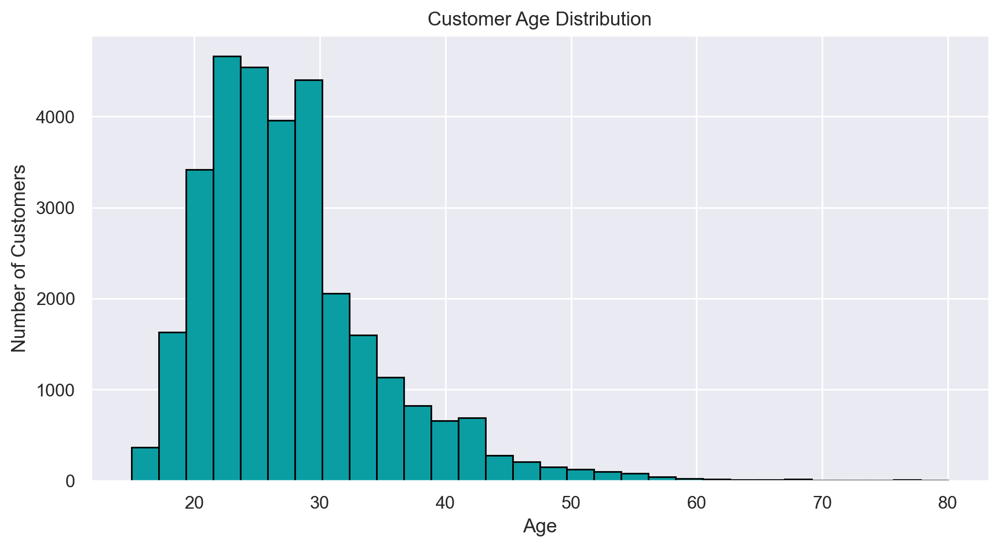

In [336]:
#Visualizing  the distribution of customer age in our dataset, using an histogram
plt.figure(figsize=(10, 5))
plt.hist(food_df['customer_age'], bins=30, color=colors["BL"], edgecolor='black')
plt.title('Customer Age Distribution')
plt.xlabel('Age')
plt.ylabel('Number of Customers')
plt.show()

We observed the following:
* We identified a right skewed distribution, which may give us indications on what to do, when treating missing values
* The range of the values go from 17 till 80

Let us plot this column in a boxplot to better see the outliers 

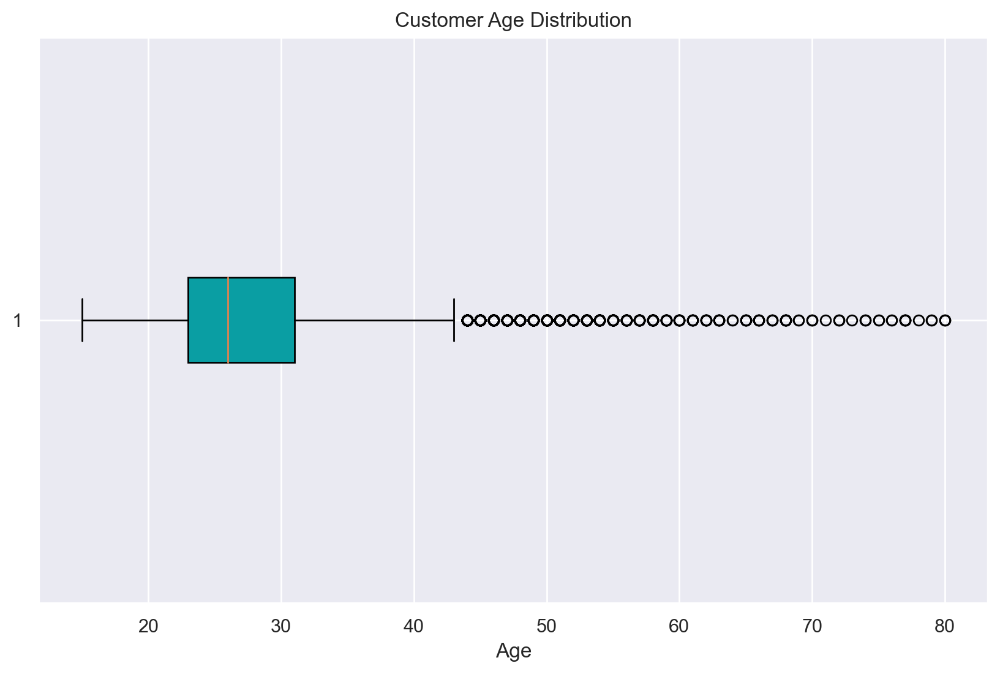

In [337]:
# Visualizing the distribution of customer age with a boxplot to better visualize the outliers
plt.figure(figsize=(10, 6))
plt.boxplot(food_df['customer_age'].dropna(), vert=False, patch_artist=True, boxprops=dict(facecolor=colors["BL"]))
plt.title('Customer Age Distribution')
plt.xlabel('Age')
plt.show()

We can confirm the presence of outliers in the column

`Total Orders`

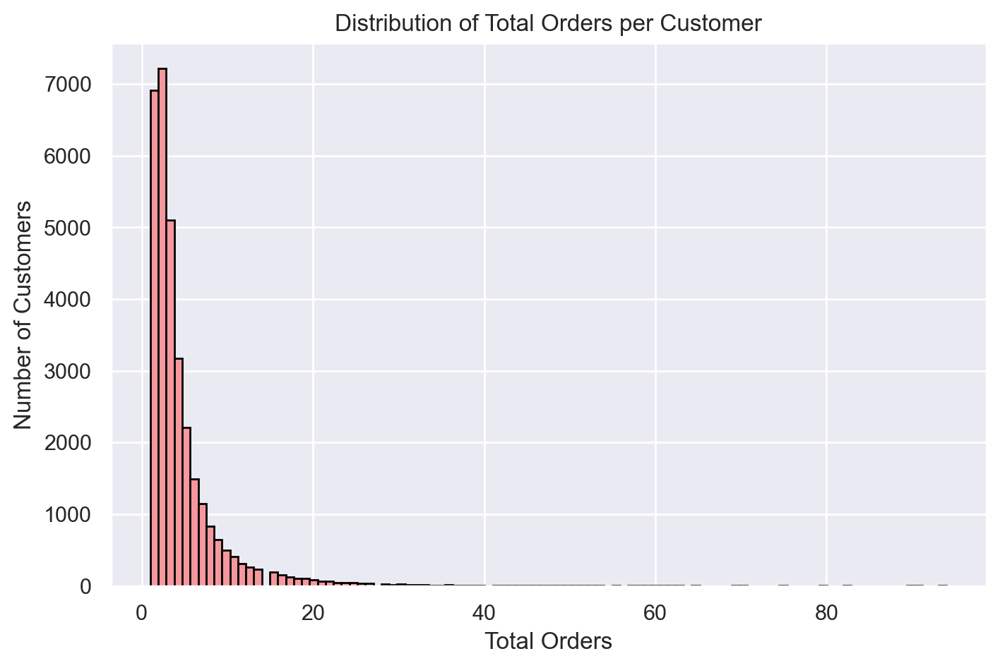

In [338]:
# Visualizing the Total orders per customer in an histogram
plt.figure(figsize=(8, 5))
plt.hist(food_df['Total orders'], bins=100, color=colors["R"], edgecolor='black')
plt.title('Distribution of Total Orders per Customer')
plt.xlabel('Total Orders')
plt.ylabel('Number of Customers')
plt.show()

We observed the following:
* The total orders per customer has a highly right skewed distribution
* The range of orders goes from 0 to around 80(knowing that the values of 0 could be faulty entries.)
* Some outliers can be observed

`Vendor Count`

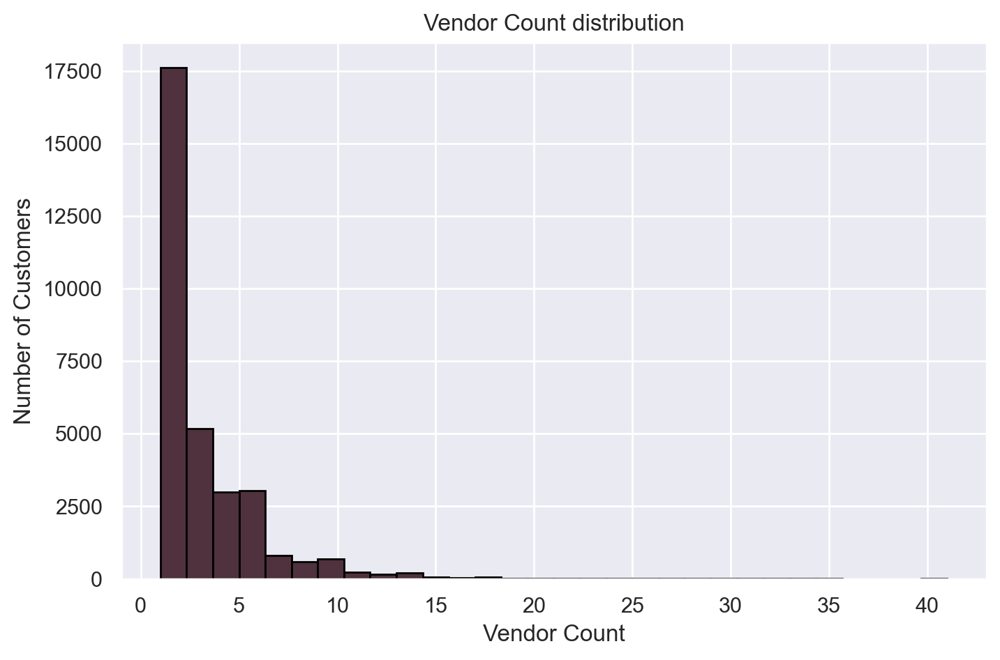

In [339]:
#Visualizing  the distribution of Vendor count in our dataset, using an histogram
plt.figure(figsize=(8, 5))
plt.hist(food_df['vendor_count'], bins=30, color=colors["BR"], edgecolor='black')
plt.title('Vendor Count distribution')
plt.xlabel('Vendor Count')
plt.ylabel('Number of Customers')
plt.show()


We observed the following:
* We identified a right skewed distribution
* The range of the values go from 0 to around 40
* We can observe some outliers in the histogram

Let us visualize the data in a boxplot to better visualize the outliers

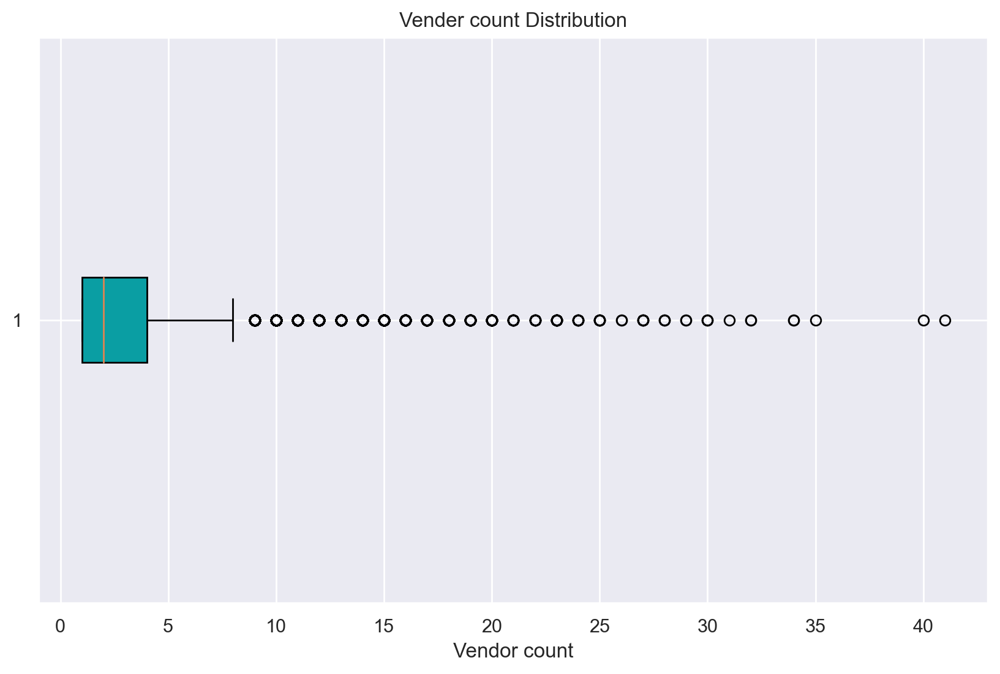

In [340]:
# Visualizing the distribution of Vendor Count with a boxplot to better visualize the outliers
plt.figure(figsize=(10, 6))
plt.boxplot(food_df['vendor_count'].dropna(), vert=False, patch_artist=True, boxprops=dict(facecolor=colors["BL"]))
plt.title('Vender count Distribution')
plt.xlabel('Vendor count')
plt.show()

We can confirm the presence of outliers in the column

`Is_Chain`

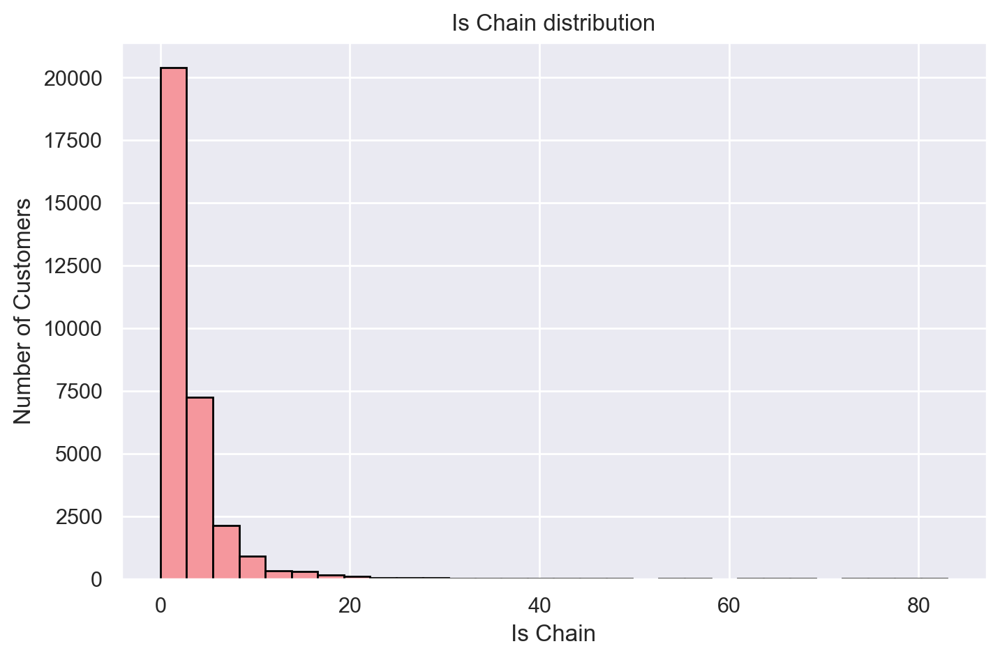

In [341]:
#Visualizing  the distribution of is_chain in our dataset, using an histogram
plt.figure(figsize=(8, 5))
plt.hist(food_df['is_chain'], bins=30, color=colors["R"], edgecolor='black')
plt.title('Is Chain distribution')
plt.xlabel('Is Chain')
plt.ylabel('Number of Customers')
plt.show()

We observed the following:
* We identified a right skewed distribution, which may give us indications on what to do, when treating missing values
* The range of the values go from 0 to around 45, and indicating some outliers


Let´s make a boxplot to visualize better the oultiers

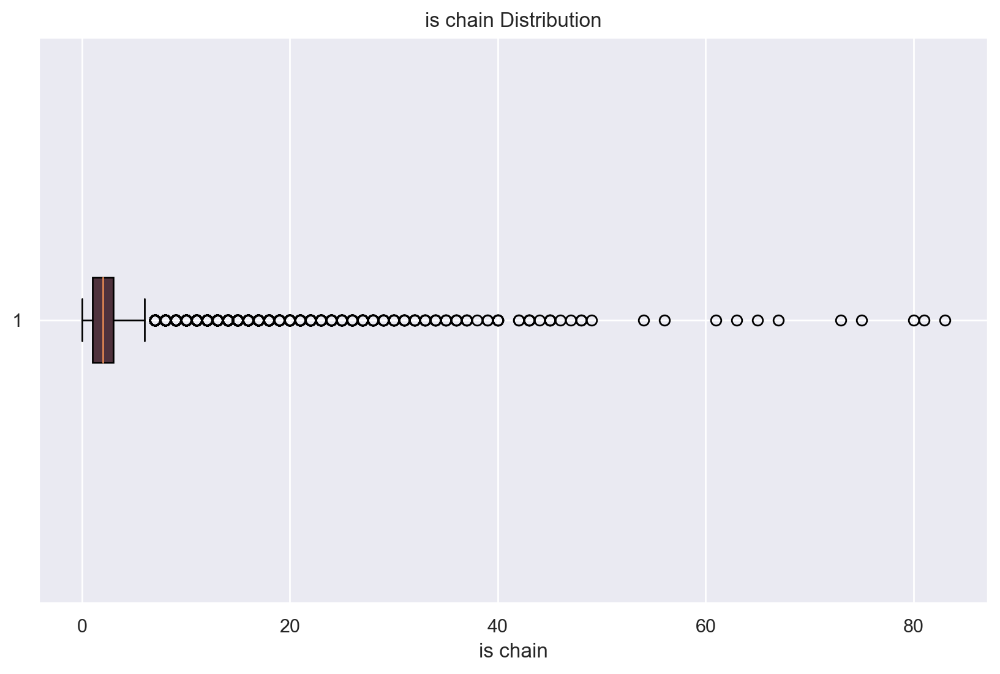

In [342]:
# Visualizing the distribution of Vendor Count with a boxplot to better visualize the outliers
plt.figure(figsize=(10, 6))
plt.boxplot(food_df['is_chain'].dropna(), vert=False, patch_artist=True, boxprops=dict(facecolor=colors["BR"]))
plt.title('is chain Distribution')
plt.xlabel('is chain')
plt.show()

We can confirm the presence of significant outliers in the column

    Day of the Week

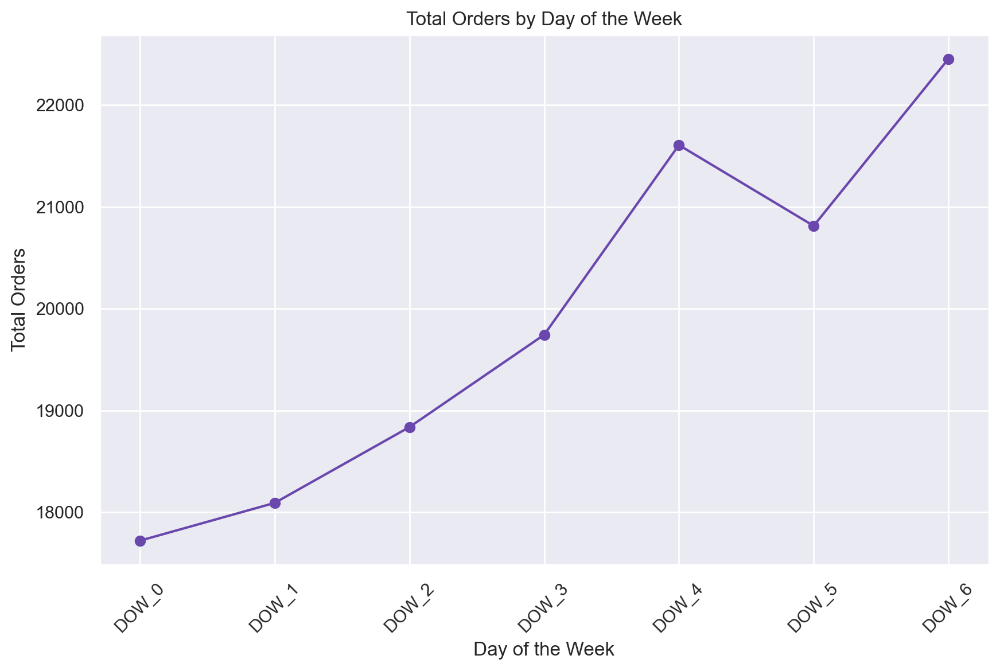

In [343]:
days_of_the_week = [f'DOW_{i}' for i in range(7)]
plt.figure(figsize=(10, 6))
plt.plot(days_of_the_week, food_df[days_of_the_week].sum(), marker='o', color=colors["P"])
plt.title('Total Orders by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Total Orders')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

As we can observe, the days with the most orders are Friday(DOW_4) and Sunday(DOW_6). We used this graph to make the division of the Days of the week. We divided the new features based on the 2 peaks of the graph.

<div class="alert alert-block alert-info">
<b>Reminder: </b>Days of the Week Aggregations:
</div>

<br>

---

<br>

```python
#Agregating, monday, tuesday, wednesday and thursday into a weekday column
food_df['Weekend']= food_df['DOW_4']+food_df['DOW_5']+ food_df['DOW_6']

#Agregating, friday, saturday, and sunday into a weekend column
food_df['Weekday']= food_df[[f'DOW_{i}' for i in range(0,4)]].sum(axis=1).astype(int)
```
<br>

---

<br>

`Key Takeaways`- Univariate Analysis:
* Some of our Features have a very right skewed distribution
* The presence of outliers in our data in evident, even after the observation in the data statistics section

## Bivariate Analysis

`Total orders by hour of the day`

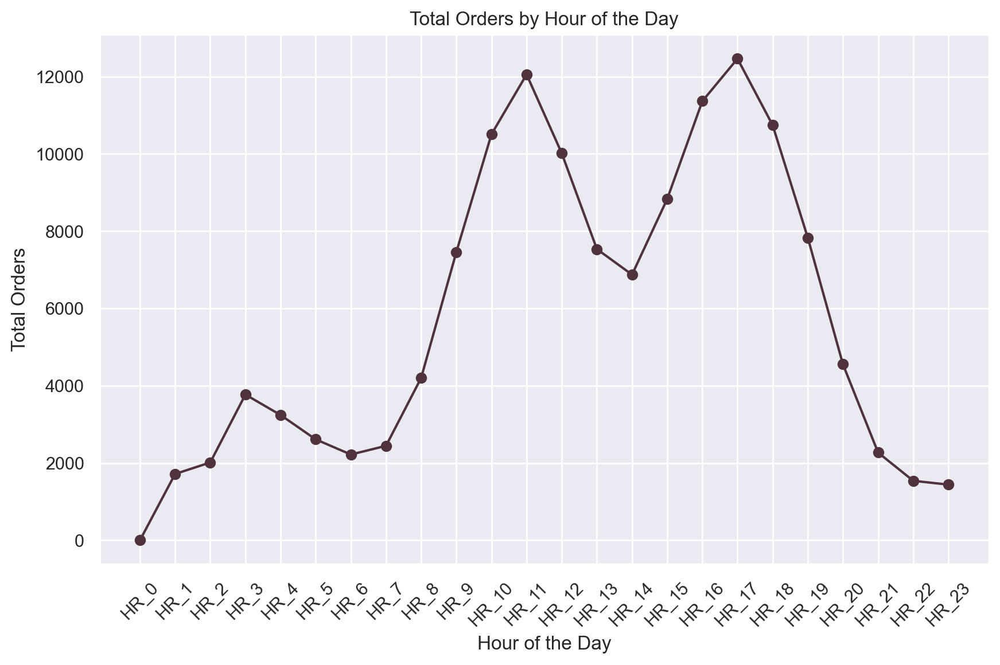

In [344]:
hours_of_the_day = [f'HR_{i}' for i in range(24)]
plt.figure(figsize=(10, 6))
plt.plot(hours_of_the_day, food_df[hours_of_the_day].sum(), marker='o', color=colors["BR"])
plt.title('Total Orders by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Total Orders')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

We can observe the following:
* The orders per hour of the day have 3 peaks, these 3 peaks were used to explain the division of the HR_colums into midday/late/evening columns (This was done in the Coherence check section)
* Most of the orders happen in 2 peaks, around 10am to 1pm, and around 4pm to around 7pm
* There is low activity during late night, midnight to early morning hours

Let us Visualize that in a bar chart using the new features created int coherence check section

`Time of the day`

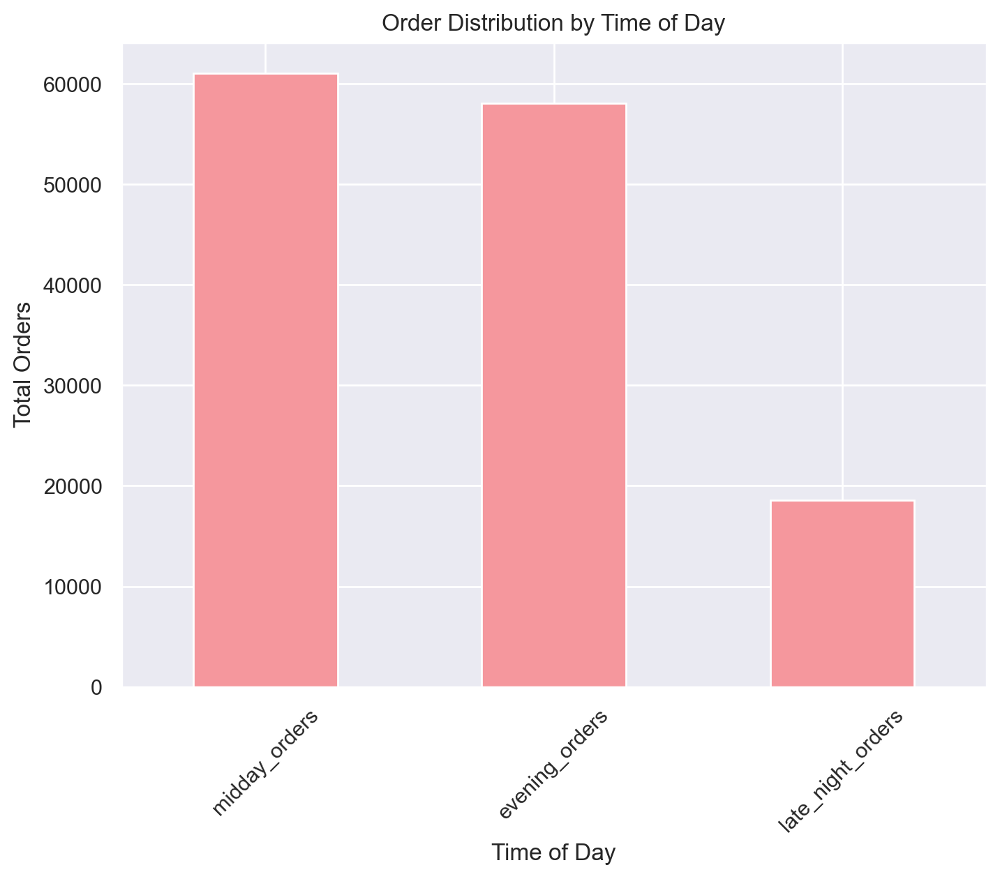

In [345]:
# Creating a bar chart of the orders per time of the day
time_of_day_columns = ['midday_orders', 'evening_orders', 'late_night_orders']

plt.figure(figsize=(8, 6))
food_df[time_of_day_columns].sum().plot(kind='bar', color=colors["R"])
plt.title('Order Distribution by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Total Orders')
plt.xticks(rotation=45)
plt.show()

<div class="alert alert-block alert-info">
<b>Reminder: </b> Cuisines Agregations:
</div>

<br>

---

<br>

```python
food_df['midday_orders'] = food_df[['HR_7', 'HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13', 'HR_14']]

food_df['evening_orders'] = food_df[['HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21']]

food_df['late_night_orders'] = food_df[['HR_22', 'HR_23', 'HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6']]
```
<br>

---

<br>

As observed, the number of orders done during late nights are very low.

`Cuisines`

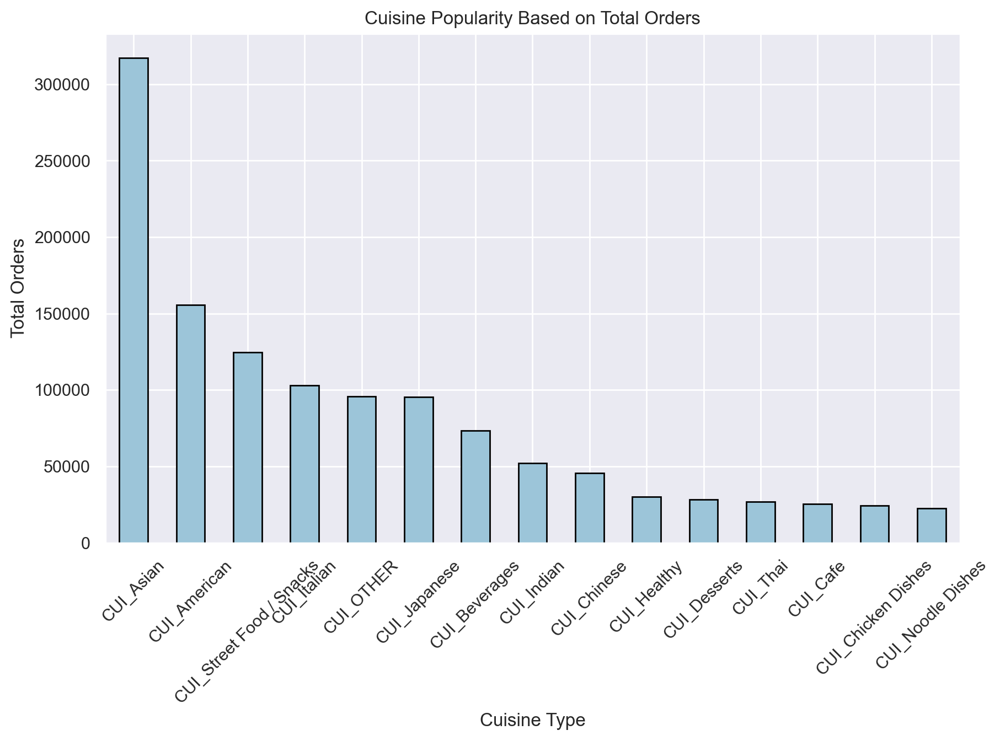

In [346]:
cuisine_columns = [col for col in food_df.columns if col.startswith('CUI_')]
cuisine_totals = food_df[cuisine_columns].sum().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
cuisine_totals.plot(kind='bar', color=colors["B"], edgecolor='black')
plt.title('Cuisine Popularity Based on Total Orders')
plt.xlabel('Cuisine Type')
plt.ylabel('Total Orders')
plt.xticks(rotation=45)
plt.show()

In the bar chart above, we observe that CUI_Asian is the dominant cuisine per number of orders, and CUI_Noodle_Dishes has the least amount of orders. This can help us undertand the spending habits of the customers. 

Let us analyse the cuisines aggregations that were done in the Coherence Check Section.

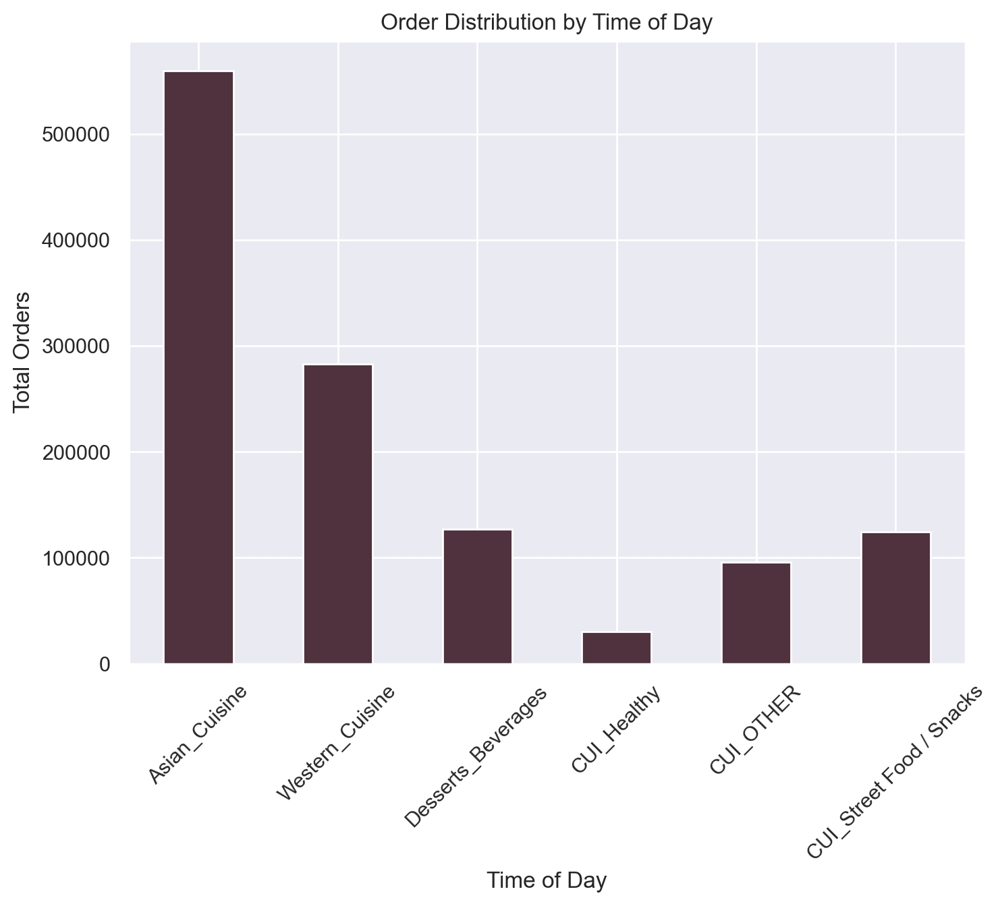

In [347]:
# Creating a bar chart of the orders per cuisine aggregation
time_of_day_columns = ['Asian_Cuisine', 'Western_Cuisine', 'Desserts_Beverages', 'CUI_Healthy', 'CUI_OTHER', 'CUI_Street Food / Snacks']

plt.figure(figsize=(8, 6))
food_df[time_of_day_columns].sum().plot(kind='bar', color=[colors["BR"]])
plt.title('Order Distribution by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Total Orders')
plt.xticks(rotation=45)
plt.show()

<div class="alert alert-block alert-info">
<b>Reminder: </b> Cuisines Agregations:
</div>

<br>

---

<br>

```python
food_df['Western_Cuisine'] = food_df[['CUI_American', 'CUI_Italian', 'CUI_Chicken Dishes']]

food_df['Asian_Cuisine'] = food_df[['CUI_Asian', 'CUI_Chinese', 'CUI_Indian', 'CUI_Japanese', 'CUI_Thai', 'CUI_Noodle Dishes']]

food_df['Desserts_Beverages'] = food_df[['CUI_Desserts', 'CUI_Beverages', 'CUI_Cafe']]
```
<br>

---

<br>



From the aggregation, we can observe that Asian_Cuisines are the ones with the most orders, and CUI_Healthy has the least orders.

`Vendor count and Product count`

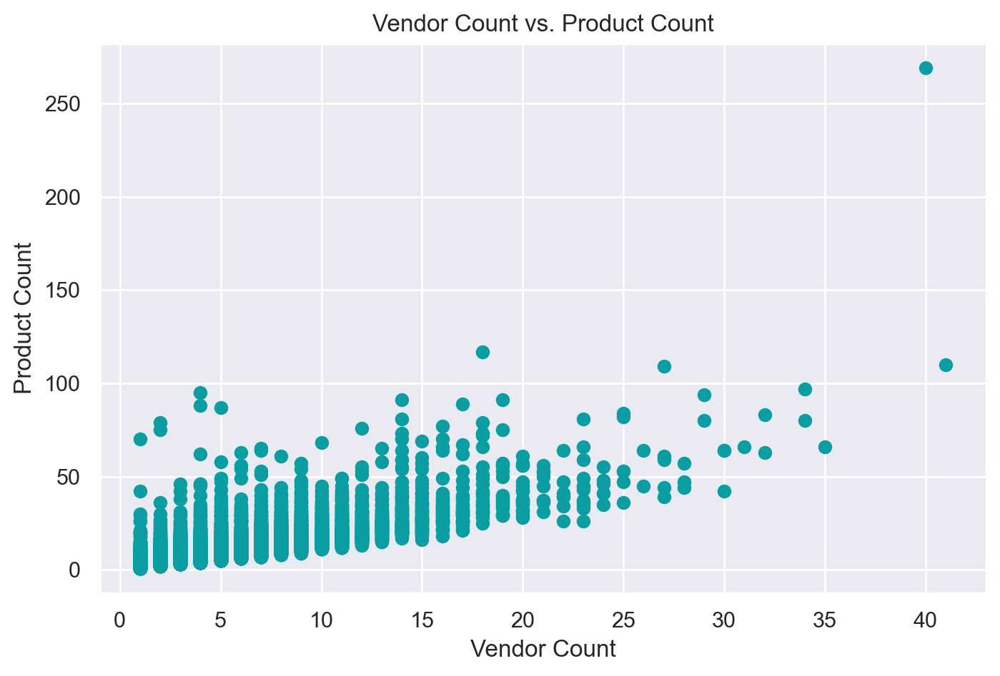

In [348]:
#Using a scatterplot to analyse if there is anny correlation between product count and vendor count
plt.figure(figsize=(8, 5))
plt.scatter(food_df['vendor_count'], food_df['product_count'], color=colors["BL"])
plt.title('Vendor Count vs. Product Count')
plt.xlabel('Vendor Count')
plt.ylabel('Product Count')
plt.grid(True)
plt.show()

We can observe an apparent positive correlation between Vendor count and product count. This will be better explored when we create a correlation matrix.

`First order and Last order`

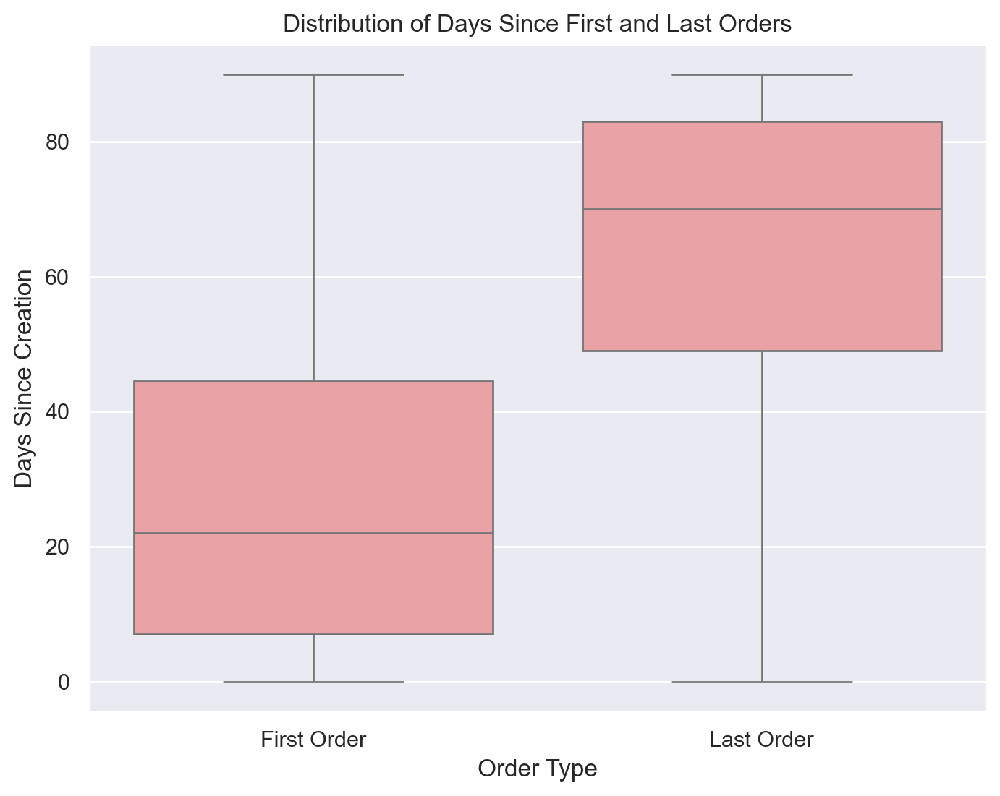

In [349]:
plt.figure(figsize=(8, 6))

# Creating a DataFrame for boxplot
order_data = pd.DataFrame({
    'First Order': food_df['first_order'],
    'Last Order': food_df['last_order']
})

# Melt the DataFrame for seaborn
order_data_melted = order_data.melt(var_name='Order Type', value_name='Days Since Creation')

# Plot the boxplot
sns.boxplot(x='Order Type', y='Days Since Creation', data=order_data_melted, color=colors["R"])
plt.title('Distribution of Days Since First and Last Orders')
plt.xlabel('Order Type')
plt.ylabel('Days Since Creation')
plt.show()



There’s a broader distribution for the last orders. This could reflect a retention trend where customers make their last order after a substantial amount of time since their first order.

`Correlation Matrix between orders, vendor_count, product_count, is_chain, first and last order`

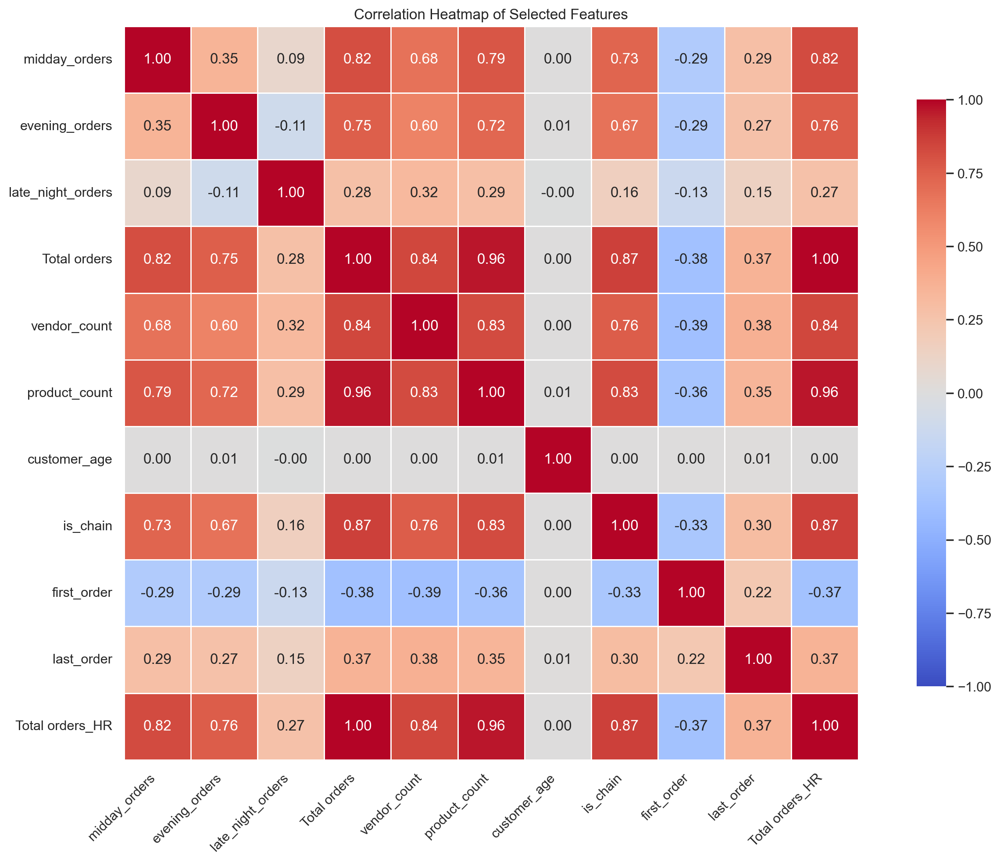

In [350]:
selected_features = [
    'midday_orders', 'evening_orders', 'late_night_orders',
    'Total orders', 'vendor_count', 'product_count', 
    'customer_age', 'is_chain','first_order', 'last_order', 'Total orders_HR'
]

# Calculating the correlation matrix for the selected features
correlation_matrix = food_df[selected_features].corr()

# Creating the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, 
            annot=True,  # Show correlation coefficients
            fmt='.2f',   # Format for the annotation
            cmap='coolwarm',  # Color map
            square=True,  # Make cells square
            cbar_kws={"shrink": .8},  # Color bar size
            linewidths=0.5,  # Lines between cells
            vmin=-1,  # Minimum limit for color bar
            vmax=1)  # Maximum limit for color bar

# Set titles and labels
plt.title('Correlation Heatmap of Selected Features')
plt.xticks(rotation=45, ha='right')  # Rotate x labels for readability
plt.yticks(rotation=0)  # Keep y labels horizontal
plt.tight_layout()  # Adjust layout to fit labels
plt.show()

We observed the following:
*  There is a high correlation between the total number of order and the order coming from a chain place, which indicates customer preference.
*  Product count and total orders have a very high correlation of 0.97, meaning that they may be giving us the same information
*  The fact that customer age has no correlation with the other variables, might tell us that demographic segmentation may not be the best fit for this dataset.
*  First order displays a negative correlation this is often seen in datasets where the "recency" of customer engagement is associated with higher activity levels.

In [351]:
# Filtrar linhas onde total_orders é diferente de Product_count
food_df[food_df['Total orders'] != food_df['product_count']]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,Total orders,Total orders_HR
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,28.88,0.0,0.00,0.0,0.00,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,2,0.0,1,1,0.00,28.88,0.00,2,2
180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,0.00,13.70,0.00,0.0,0.0,0.0,0.0,0.00,17.86,0.0,0.00,0.0,0.00,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,2,0,0.0,1,1,0.00,31.56,0.00,2,2
4eb37a6705,4660,20.0,2,5,0,0.0,2,NOPROMO,DIGI,14.57,40.87,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0.0,1,1,14.57,40.87,0.00,2,2
f2f53bcc67,8670,27.0,2,3,2,0.0,2,DISCOUNT,DIGI,11.71,0.00,24.40,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1.0,1,1,11.71,0.00,24.40,2,2
5b650c89cc,2360,20.0,3,4,2,0.0,3,DISCOUNT,DIGI,2.75,0.00,0.00,0.0,0.0,0.0,0.0,4.39,0.00,0.0,0.00,0.0,7.30,0.0,0.0,0,0,1,0,0,0,2,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,2,1.0,2,1,2.75,0.00,0.00,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
d98363a77b,2360,23.0,1,2,1,NaN,0,NOPROMO,CARD,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.0,11.69,0.0,0.00,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0.0,1,0,0.00,11.69,0.00,1,1
e094ea350c,8670,21.0,1,2,1,NaN,0,DELIVERY,CASH,0.00,0.00,37.11,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0.0,1,0,0.00,0.00,37.11,1,1
e0f32d3294,4660,24.0,1,2,1,NaN,0,NOPROMO,CARD,13.30,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0.0,1,0,13.30,0.00,0.00,1,1


`Key Takeaways`-Bivariate Analysis:

**Customer behaviour:**
* The order per day have 3 peaks, with most of the orders happening in the 2 peaks around  10am to 01pm and 04pm to 07pm.
* CUI_Asian has the highest number of orders while CUI_Noodle_Dishes has the least number of orders. After the aggregation, the Asian_cuisine is the one with highest orders, followed by Western Cuisine.
* Our customers make their last order after some time since the first order

**Obersevations:**
* The strong correlation between product count and vendor count might indicate that the two variables give us the same value.
* Columns like total orders, product_count and vendor_count have a high correlation.
* The lack of correlation between customer age and the other varibales, saying that, we should take a closer look in order to understand its value to the project.
* Since we obsevred some of the customers habits, we might take into consideration `behavioral segmentation`, as well as `geographic segmentation`.

## 2.3.2 Categorical Variables

## Univariate analysis

`Customer Region`

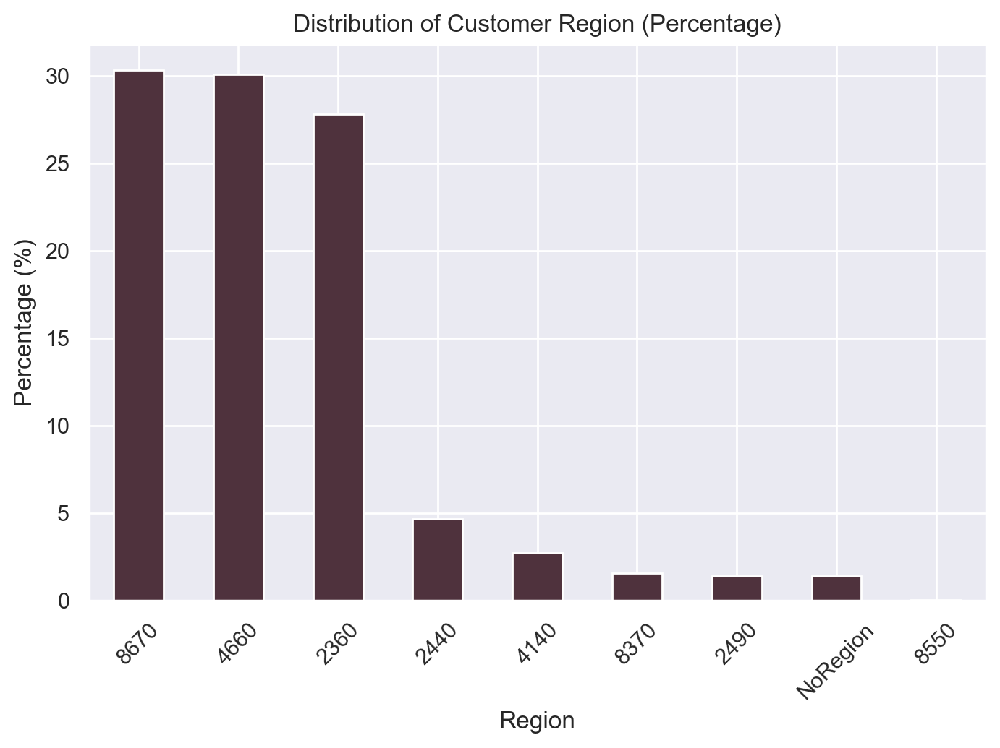

In [352]:
plt.figure(figsize=(8, 5))

# Calculate percentage for each payment method
payment_method_percentage = cat_food_df['customer_region'].value_counts(normalize=True) * 100

# Plot the percentages
payment_method_percentage.plot(kind='bar', color=colors["BR"])

# Add title and labels
plt.title('Distribution of Customer Region (Percentage)')
plt.xlabel('Region')
plt.ylabel('Percentage (%)')

# Rotate x-axis labels for readability
plt.xticks(rotation=45)

# Display the plot
plt.show()

As observed in the data statistics section, the customer regions with the most orders are the "8670", "4660" and "2360". This can be helpfull for geograpic segmentation.

`Payment Methods`

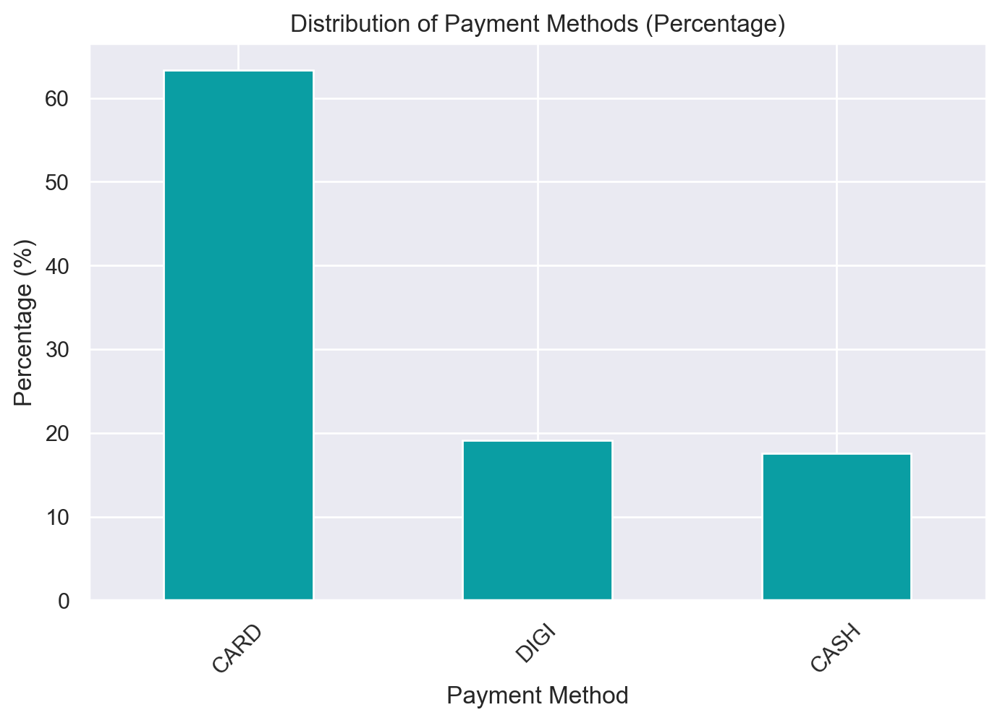

In [353]:
plt.figure(figsize=(8, 5))

# Calculate percentage for each payment method
payment_method_percentage = food_df['payment_method'].value_counts(normalize=True) * 100

# Plot the percentages
payment_method_percentage.plot(kind='bar', color=colors["BL"])

# Titles
plt.title('Distribution of Payment Methods (Percentage)')
plt.xlabel('Payment Method')
plt.ylabel('Percentage (%)')

# Rotate x-axis labels for readability
plt.xticks(rotation=45)

plt.show()


More than 60% of the orders are done with payment by CARD. Which is a good insight into the customer's behaviour.

`Last Promotion`

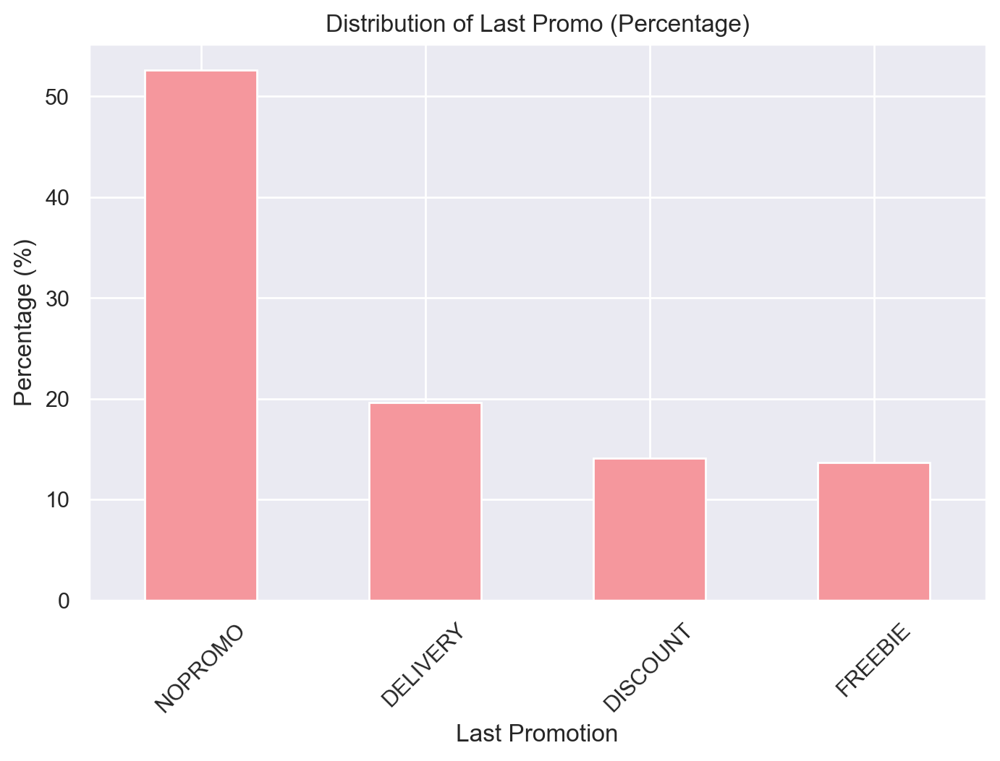

In [354]:
plt.figure(figsize=(8, 5))

# Calculate percentage for each payment method
payment_method_percentage = cat_food_df['last_promo'].value_counts(normalize=True) * 100

# Plot the percentages
payment_method_percentage.plot(kind='bar', color=colors["R"])

#Tittles
plt.title('Distribution of Last Promo (Percentage)')
plt.xlabel('Last Promotion')
plt.ylabel('Percentage (%)')

# Rotate x-axis labels for readability
plt.xticks(rotation=45)

plt.show()

As observed, more than 50% of the orders are done when there is no promotion. The category "NOPROMO" is originally the rows with "-", which we considered important for the statistical and visual analysis, hence calling it "NOPROMO".

`Key Takeaways`-Univariate Analysis:
* There are 3 customer regions with the most orders: 8670, 4660, and 2360.
* Card is the most popular paying method
* most of the orders are done under no promotion.

## Bivariate analysis

`Last Promo vs Payment Method`

We created a stacked bar to visualize, from the payment methods, which are the most common promotion categories.

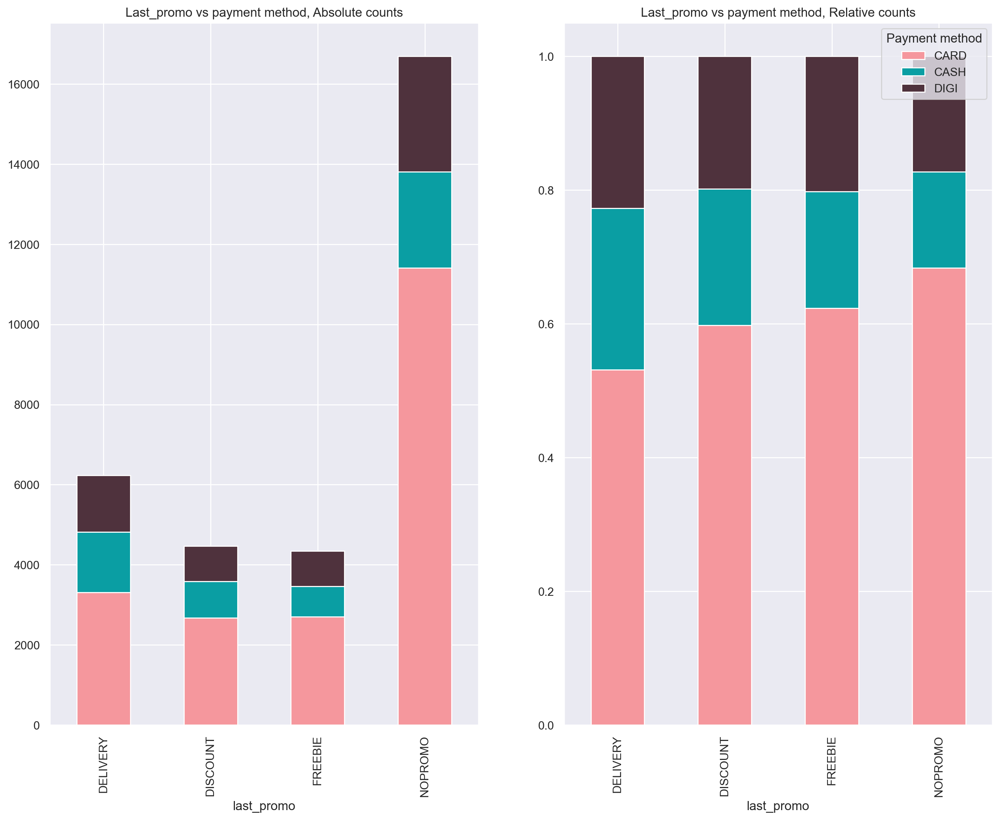

In [355]:
cat1 = 'last_promo'
cat2 = 'payment_method'

fig, axes = plt.subplots(1,2, figsize=(16,12))

# Extracting the colors from our color palette 
region_colors = [colors[key] for key in colors.keys()]


catpc_df = food_df.groupby([cat1, cat2])[cat2].size().unstack()
catpc_df.plot.bar(stacked=True, ax=axes[0], color=region_colors)
axes[0].legend([], frameon=False)
axes[0].set_title('Last_promo vs payment method, Absolute counts')

catpc_df2 = food_df.groupby([cat1, cat2])[cat2].size() / food_df.groupby([cat1])[cat2].size() 

catpc_df2.unstack().plot.bar(stacked=True, ax=axes[1], color=region_colors)
axes[1].set_title('Last_promo vs payment method, Relative counts')
axes[1].legend(loc=(1.01,0))
axes[1].legend(title='Payment method')


plt.show()


plt.show()

We observe that for the 3 type of payment method, the most common promotion category is "NOPROMO", followed by "DELIVERY", meaning that the most popular promotion is "DELIVERY".

`Last Promo vs Region`

From the promotion types, which are the most common customer regions

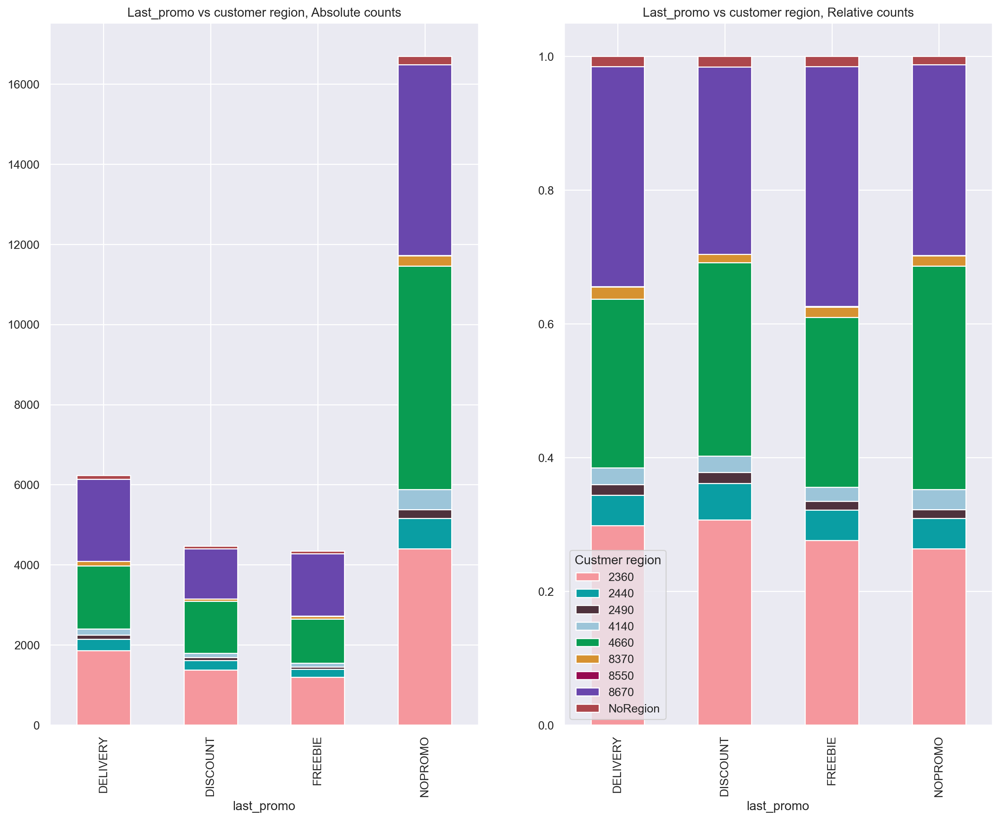

In [356]:
cat1 = 'last_promo'
cat2 = 'customer_region'

fig, axes = plt.subplots(1,2, figsize=(16,12))

# Extracting the colors from our color palette 
region_colors = [colors[key] for key in colors.keys()]


catpc_df = food_df.groupby([cat1, cat2])[cat2].size().unstack()
catpc_df.plot.bar(stacked=True, ax=axes[0], color=region_colors)
axes[0].legend([], frameon=False)
axes[0].set_title('Last_promo vs customer region, Absolute counts')

catpc_df2 = food_df.groupby([cat1, cat2])[cat2].size() / food_df.groupby([cat1])[cat2].size() 

catpc_df2.unstack().plot.bar(stacked=True, ax=axes[1], color=region_colors)
axes[1].set_title('Last_promo vs customer region, Relative counts')
axes[1].legend(loc=(1.01,0))
axes[1].legend(title='Custmer region')


plt.show()


plt.show()




The most common regions for each type of promotion are 8670, 4660, and 2360.

`Payment Method vs Customer region`

Visualizing the most dominant customer region per each type of payment method.

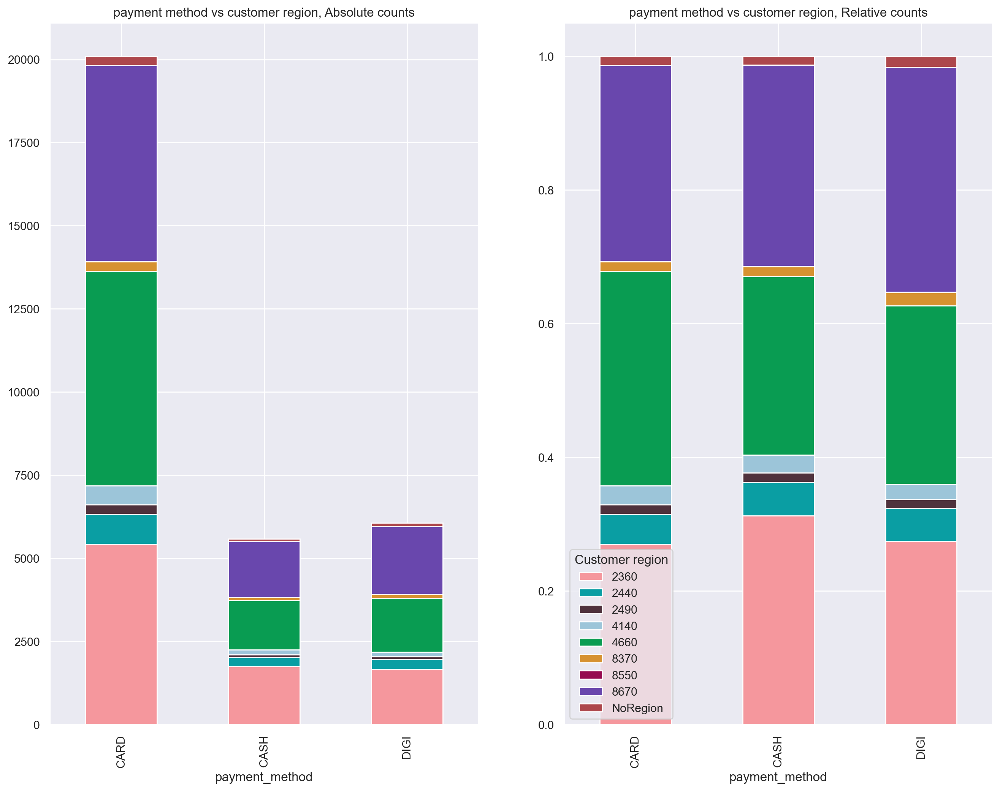

In [357]:
cat1 = 'payment_method'
cat2 = 'customer_region'

fig, axes = plt.subplots(1,2, figsize=(16,12))

# Extracting the colors from our color palette 
region_colors = [colors[key] for key in colors.keys()]


catpc_df = food_df.groupby([cat1, cat2])[cat2].size().unstack()
catpc_df.plot.bar(stacked=True, ax=axes[0], color=region_colors)
axes[0].legend([], frameon=False)
axes[0].set_title('payment method vs customer region, Absolute counts')

catpc_df2 = food_df.groupby([cat1, cat2])[cat2].size() / food_df.groupby([cat1])[cat2].size() 

catpc_df2.unstack().plot.bar(stacked=True, ax=axes[1], color=region_colors)
axes[1].set_title('payment method vs customer region, Relative counts')
axes[1].legend(loc=(1.01,0))
axes[1].legend(title='Customer region')


plt.show()

plt.show()

As we can observe, the most common customer region per payment method stay as 8670, 4660, and 2360.

    HR by Customer Region

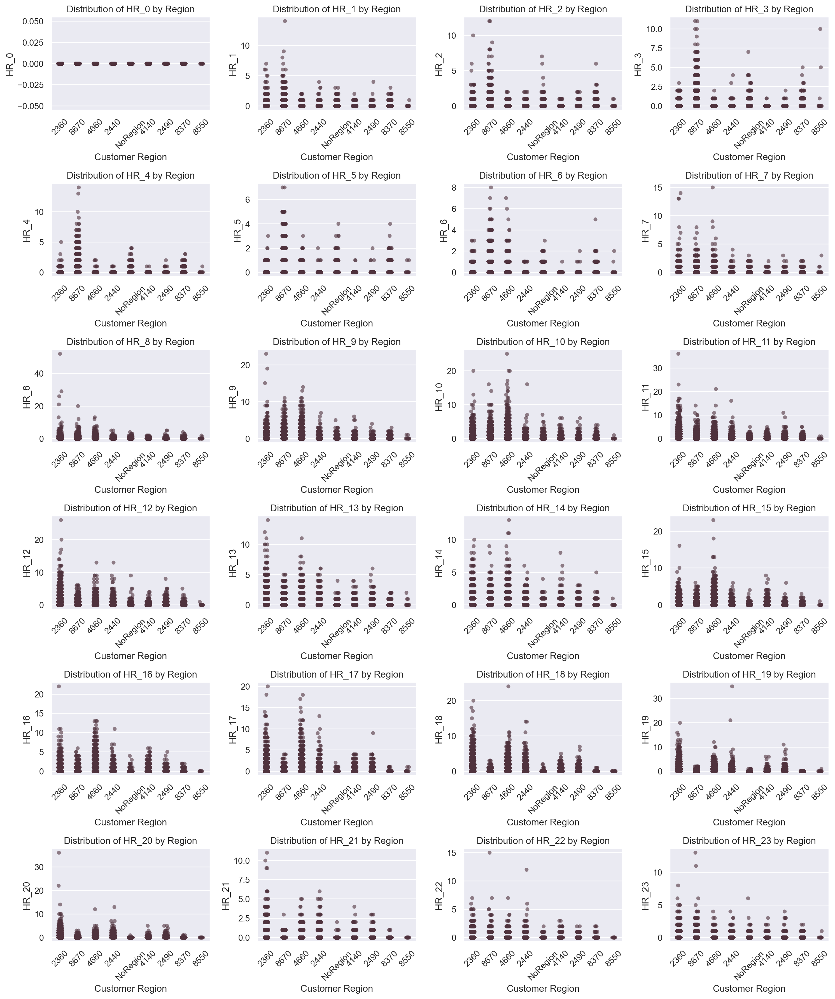

In [358]:

fig, axes = plt.subplots(6, 4, figsize=(15, 18))

axes = axes.flatten()

for i in range(24):
    hr_column = f'HR_{i}' 
    sns.stripplot(x='customer_region', y=hr_column, data=food_df, jitter=True, color=colors["BR"], alpha=0.6, ax=axes[i]) #Using a strip plot graph
    
    axes[i].set_title(f'Distribution of {hr_column} by Region')
    axes[i].set_xlabel('Customer Region')
    axes[i].set_ylabel(hr_column)
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()

plt.show()


Inisghts:

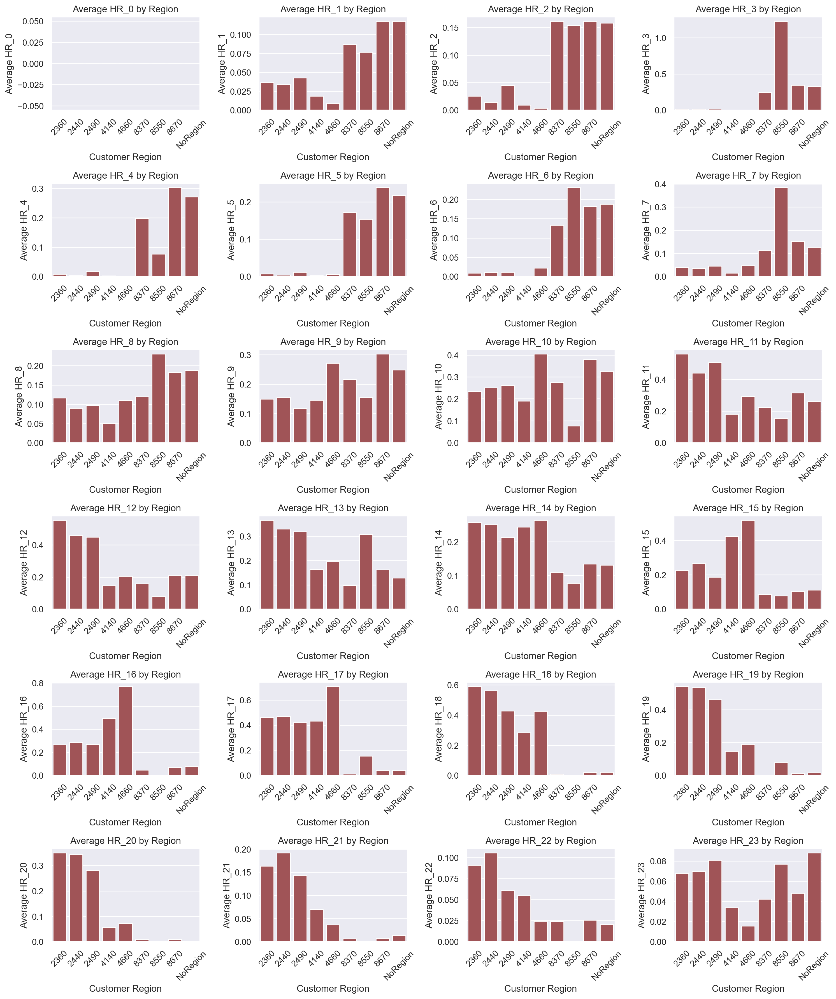

In [359]:

fig, axes = plt.subplots(6, 4, figsize=(15, 18))

axes = axes.flatten()

#Function to get the mean of each HR column by customer region
for i in range(24):
    hr_column = f'HR_{i}'  #making it run through all the HR columns
    #Getting the avergae of HR by customer region
    avg_data = food_df.groupby('customer_region')[hr_column].mean().reset_index()
    
    sns.barplot(x='customer_region', y=hr_column, data=avg_data, ax=axes[i], color=colors["PR"])
    
    axes[i].set_title(f'Average {hr_column} by Region')
    axes[i].set_xlabel('Customer Region')
    axes[i].set_ylabel(f'Average {hr_column}')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()

plt.show()


**Each region's HIGHEST average are:**
- For Region `NoRegion`: HR_23, HR_1, HR_2, HR_5(second highest)
- For Region `8670`: HR_9, HR_5, HR_1, HR_2, HR_4, HR_10 (Second highest)
- For Region `8550`: HR_2, HR_3, HR_6, HR_7, HR_8, it is third in HR_23
- For Region `8370`: HR_2; in most of the HR, it has low average, it is third highest in HR_1, HR_4, HR_5
- For Region `4660`: HR_10, HR_14, HR_15, HR_16, HR_17
- For Region `4140`: Significantly high from HR_14 to HR_18
- For Region `2490`: HR_23, from HR_11 to HR_14 and HR_18-20
- For Region `2440`: HR_18-20, HR_11-14
- For Region `2360`: HR_18-20, HR_11-14 

**Each region's LOWEST average are:**
- For Region `NoRegion`: HR_16 to HR_22
- For Region `8670`: HR_16 to HR_22
- For Region `8550`: HR_16 to HR_22
- For Region `8370`: HR_16 to HR_21
- For Region `4660`: HR_1 to HR_7
- For Region `4140`: HR_2 to HR_7
- For Region `2490`: HR_2 to Hr_7
- For Region `2440`: HR_2 to Hr_7
- For Region `2360`: HR_2 to Hr_7

`Summary`: Some Regions seems to have similar habits:
- The 2360, 2440 and 2490 regions have pretty similar behavious
- The 4660 and 4140 also have similar behaviours
- The NoRegion, 8670, 8370 regions also have similar behaviours

    DOW by customer Region

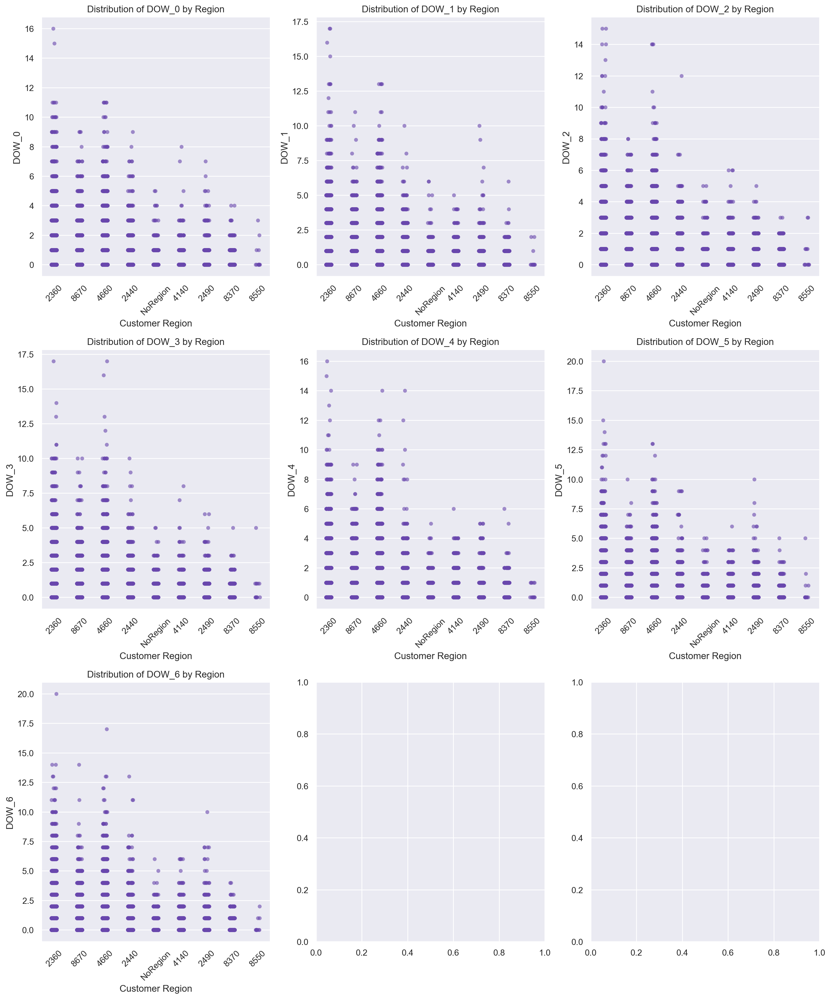

In [360]:

fig, axes = plt.subplots(3, 3, figsize=(15, 18))

axes = axes.flatten()

for i in range(7):
    dow_column = f'DOW_{i}'  #making it run through all the dow columns
    sns.stripplot(x='customer_region', y=dow_column, data=food_df, jitter=True, color=colors["P"], alpha=0.6, ax=axes[i]) #Using a strip plot graph
    
    axes[i].set_title(f'Distribution of {dow_column} by Region')
    axes[i].set_xlabel('Customer Region')
    axes[i].set_ylabel(dow_column)
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()

plt.show()

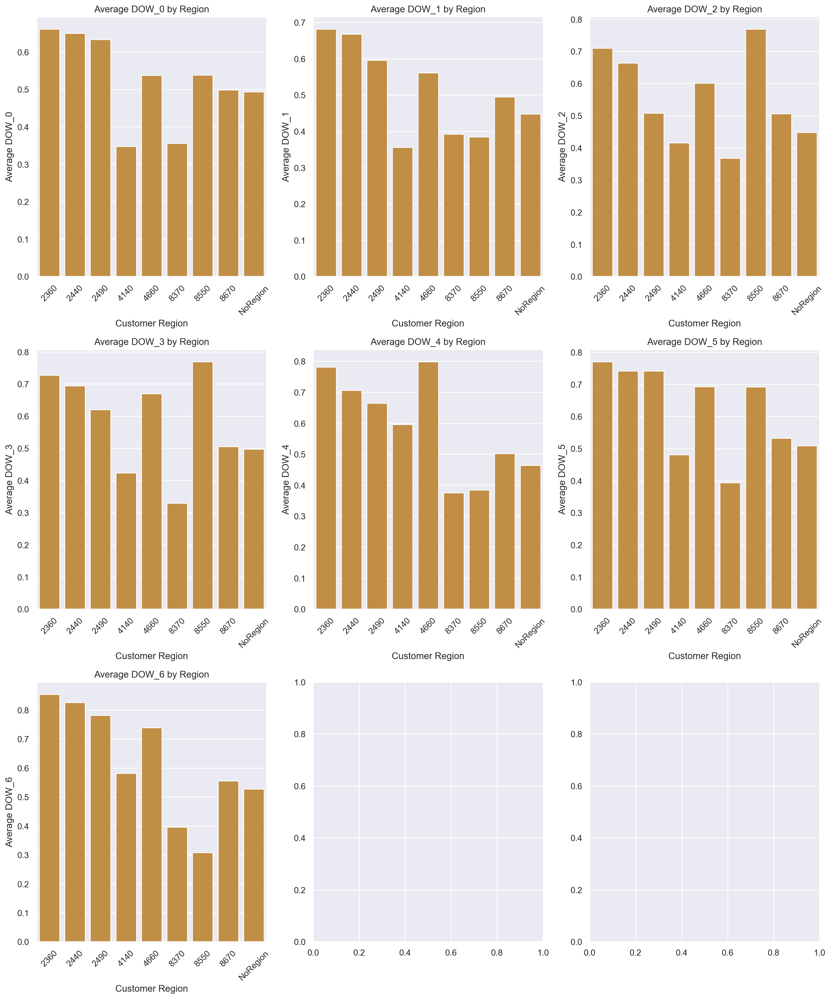

In [361]:
fig, axes = plt.subplots(3, 3, figsize=(15, 18))

axes = axes.flatten()

#Function to get the mean of each dow column by customer region
for i in range(7):
    dow_column = f'DOW_{i}'  #making it run through all the dow columns
    avg_data = food_df.groupby('customer_region')[dow_column].mean().reset_index()
    
    sns.barplot(x='customer_region', y=dow_column, data=avg_data, ax=axes[i], color=colors["Y"])
    
    axes[i].set_title(f'Average {dow_column} by Region')
    axes[i].set_xlabel('Customer Region')
    axes[i].set_ylabel(f'Average {dow_column}')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()

plt.show()

`Summary`:
- There is no Region what significantly low average in any of the days of the week, and overall, the day of the week with the lowest averages is Monday (DOW_0)

    Cuisine by customer region

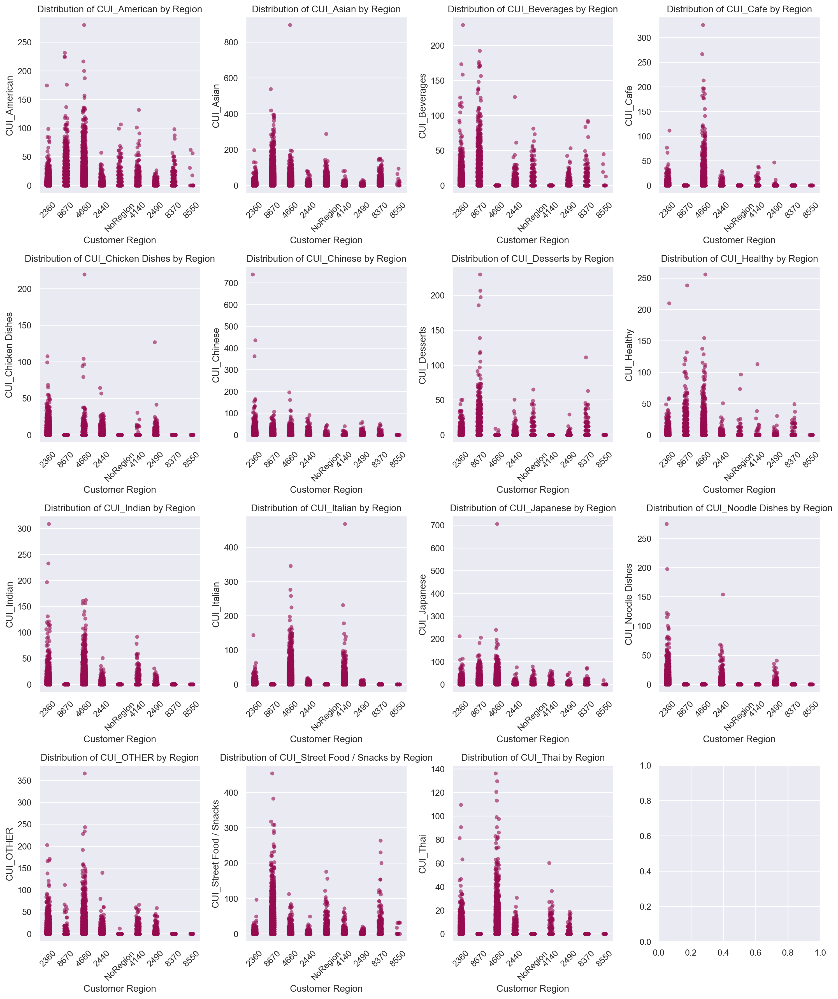

In [362]:

cuisine_columns = [col for col in food_df.columns if col.startswith('CUI_')]

fig, axes = plt.subplots(4, 4, figsize=(15, 18))  

axes = axes.flatten()

for i, cuisine_column in enumerate(cuisine_columns):
    sns.stripplot(x='customer_region', y=cuisine_column, data=food_df, ax=axes[i], jitter=True, color=colors["M"], alpha=0.6)
    
    axes[i].set_title(f'Distribution of {cuisine_column} by Region')
    axes[i].set_xlabel('Customer Region')
    axes[i].set_ylabel(f'{cuisine_column}')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()

plt.show()


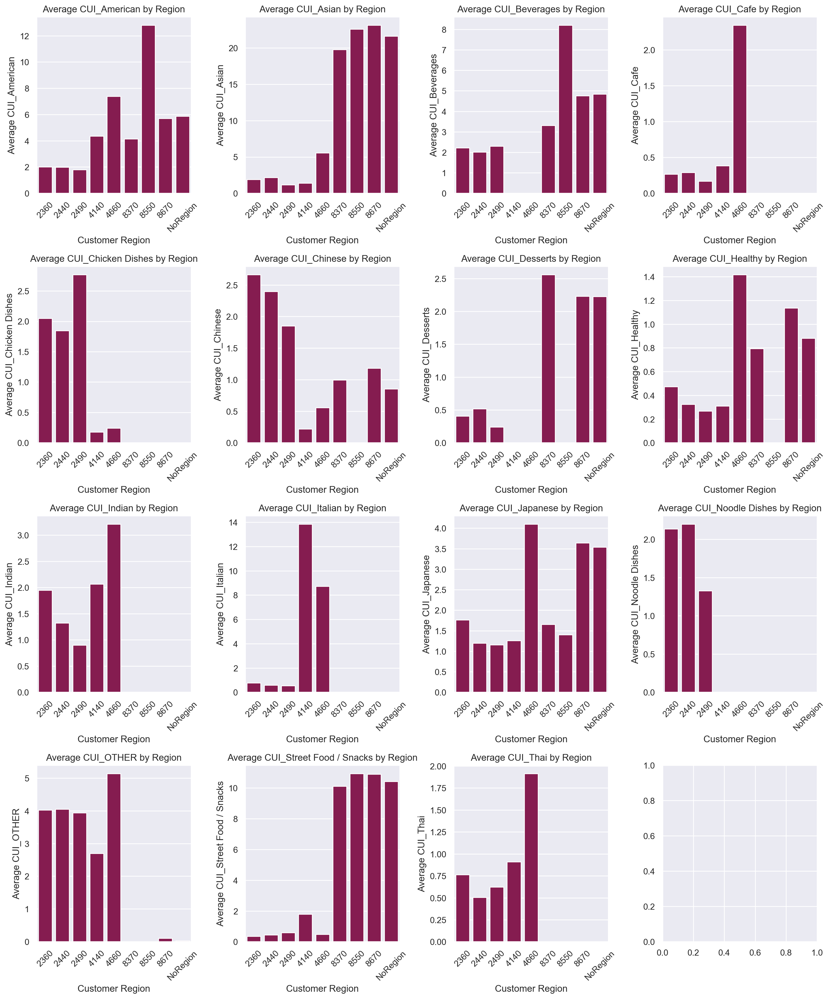

In [363]:

cuisine_columns = [col for col in food_df.columns if col.startswith('CUI_')]

fig, axes = plt.subplots(4, 4, figsize=(15, 18))  

axes = axes.flatten()

#Running through each cuisine column and create a bar plot for the average value by customer_region
for i, cuisine_column in enumerate(cuisine_columns):
    avg_data = food_df.groupby('customer_region')[cuisine_column].mean().reset_index()
    
    sns.barplot(x='customer_region', y=cuisine_column, data=avg_data, ax=axes[i], color=colors["M"])
    
    axes[i].set_title(f'Average {cuisine_column} by Region')
    axes[i].set_xlabel('Customer Region')
    axes[i].set_ylabel(f'Average {cuisine_column}')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()

plt.show()


`Summary`:
- The regions 2360, 2440 and 2490, present similar behaviours to each other, having low averages in the following cuisines: CUI_Street_Food, CUI_Italian, CUI_American, CUI_Asian and CUI_Beverages

    HR by Promotion

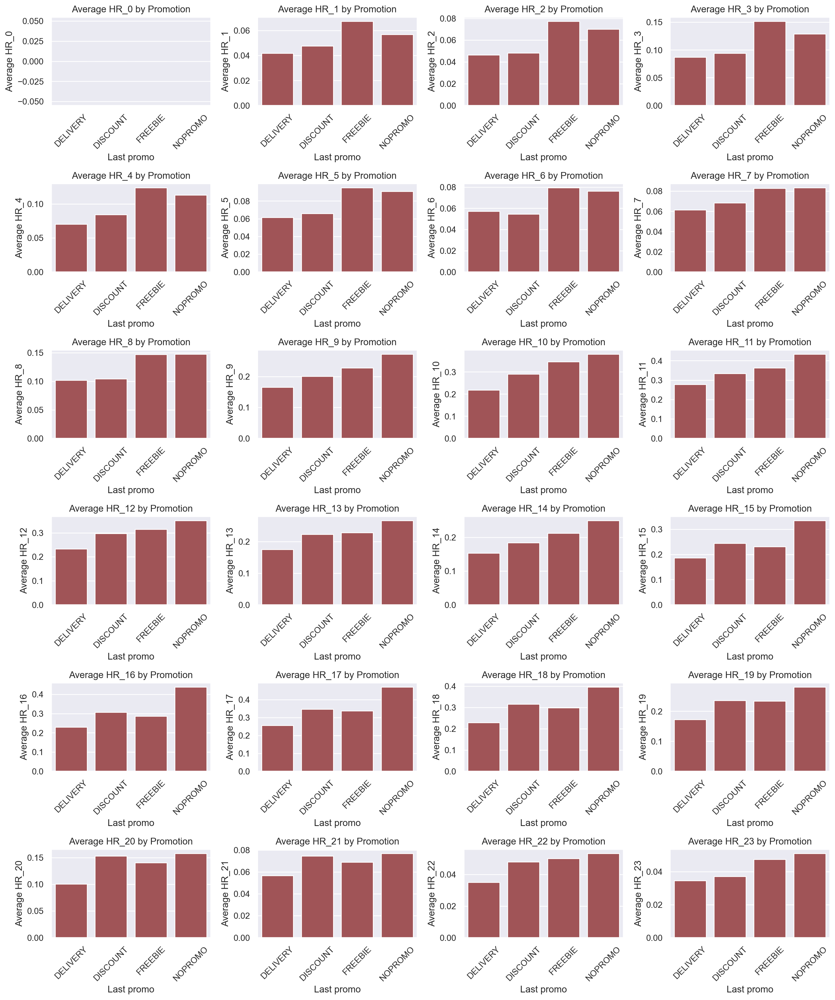

In [364]:

fig, axes = plt.subplots(6, 4, figsize=(15, 18))

axes = axes.flatten()

for i in range(24):
    hr_column = f'HR_{i}'  #making it run through all the HR columns
    avg_data = food_df.groupby('last_promo')[hr_column].mean().reset_index()
    
    sns.barplot(x='last_promo', y=hr_column, data=avg_data, ax=axes[i], color=colors["PR"])
    
    axes[i].set_title(f'Average {hr_column} by Promotion')
    axes[i].set_xlabel('Last promo')
    axes[i].set_ylabel(f'Average {hr_column}')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()

plt.show()

`Summary`: 
- As we have observed previously, the "NOPROMO" category has the highest entries, but for the Hours, starting from 1am till 6am, the highest PROMO is FREEBIE

    DOW by Promotion

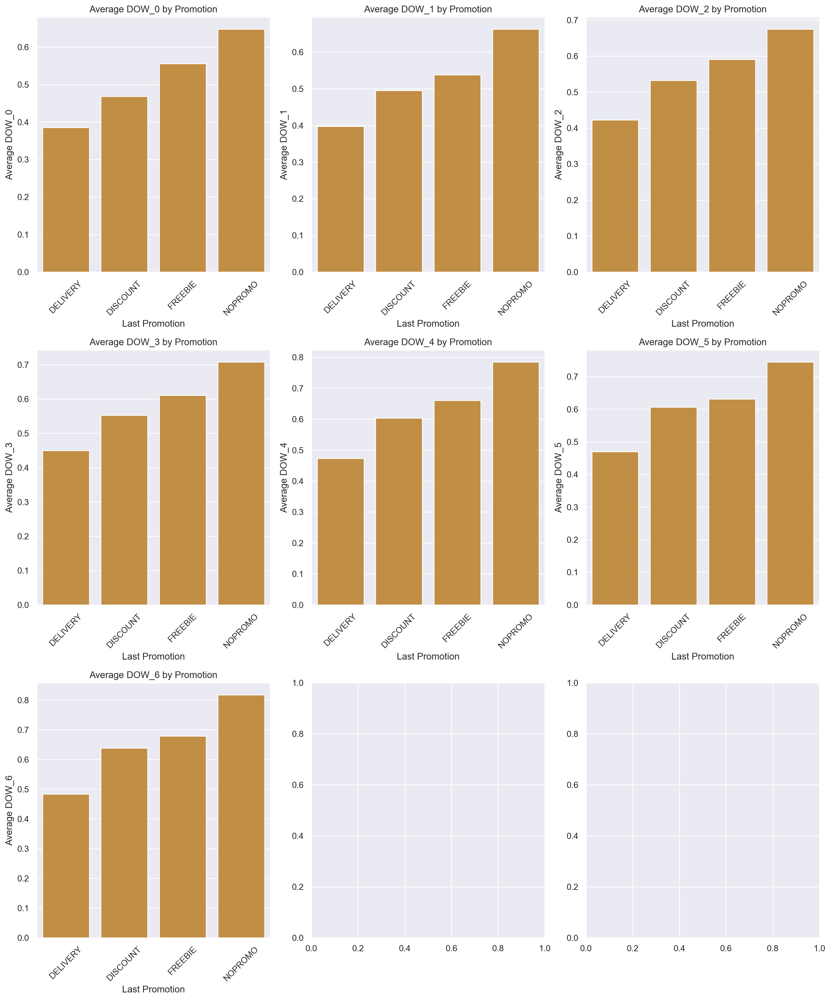

In [365]:
fig, axes = plt.subplots(3, 3, figsize=(15, 18))

axes = axes.flatten()

for i in range(7):
    dow_column = f'DOW_{i}'  #making it run through all the dow columns
    avg_data = food_df.groupby('last_promo')[dow_column].mean().reset_index()
    
    sns.barplot(x='last_promo', y=dow_column, data=avg_data, ax=axes[i], color=colors["Y"])
    
    axes[i].set_title(f'Average {dow_column} by Promotion')
    axes[i].set_xlabel('Last Promotion')
    axes[i].set_ylabel(f'Average {dow_column}')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()

plt.show()

`Summary`: For the Dys of the Week, there are no apparent change in the promotion categories, having "NOPROMO" wiht the highest average for each day and "DELIVERY" with the lowest.

    Cuisine by Promotion

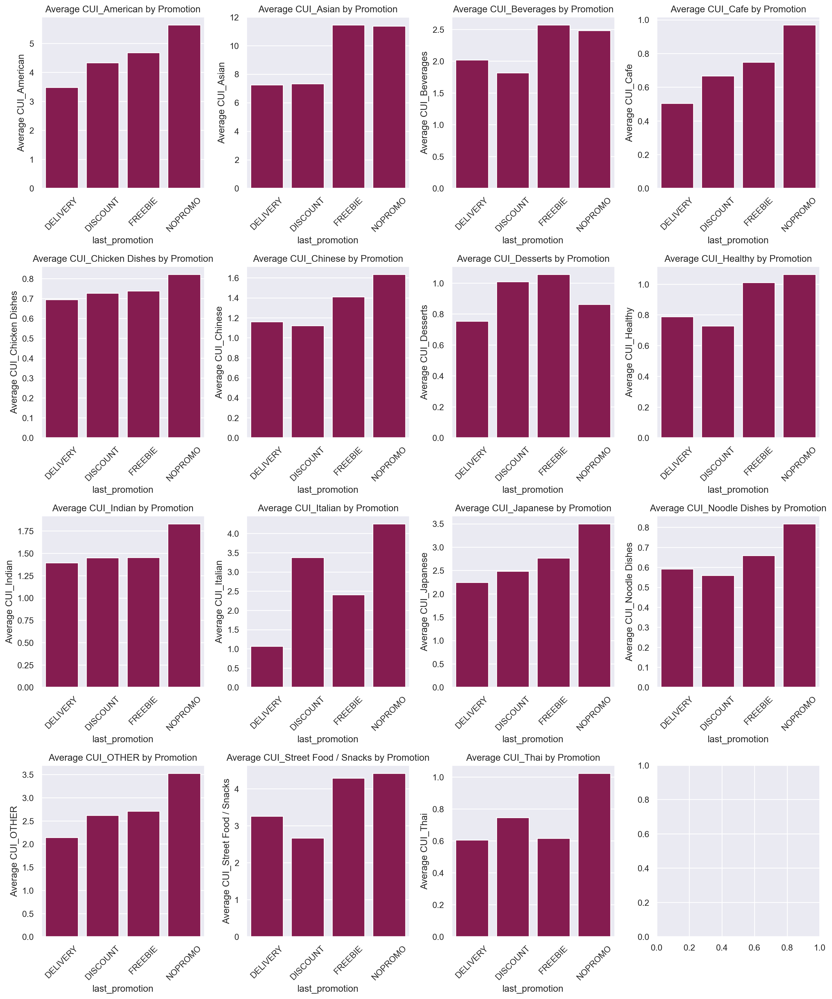

In [366]:

cuisine_columns = [col for col in food_df.columns if col.startswith('CUI_')]

fig, axes = plt.subplots(4, 4, figsize=(15, 18))  

axes = axes.flatten()

for i, cuisine_column in enumerate(cuisine_columns):
    avg_data = food_df.groupby('last_promo')[cuisine_column].mean().reset_index()
    
    sns.barplot(x='last_promo', y=cuisine_column, data=avg_data, ax=axes[i], color=colors["M"])
    
    axes[i].set_title(f'Average {cuisine_column} by Promotion')
    axes[i].set_xlabel('last_promotion')
    axes[i].set_ylabel(f'Average {cuisine_column}')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()

plt.show()

`Summary`: 
- The promotion category "FREEBIE" is relatively higher then the other categories, in the following cuisines: CUI_Asian, CUI_Beverages AND CUI_Desserts; but it is the second lowest in the CUI_Italian cuisine

    HR by Payment method

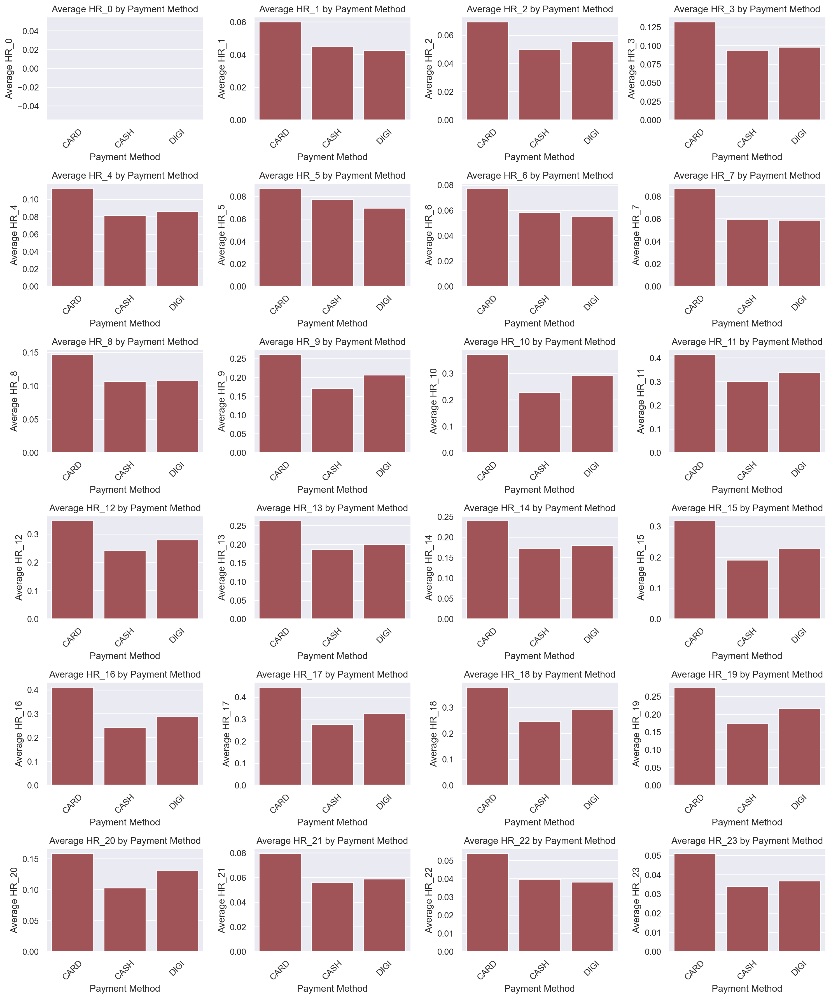

In [367]:
fig, axes = plt.subplots(6, 4, figsize=(15, 18))

axes = axes.flatten()

for i in range(24):
    hr_column = f'HR_{i}'  #making it run through all the HR columns
    avg_data = food_df.groupby('payment_method')[hr_column].mean().reset_index()
    
    sns.barplot(x='payment_method', y=hr_column, data=avg_data, ax=axes[i], color=colors["PR"])
    
    axes[i].set_title(f'Average {hr_column} by Payment Method')
    axes[i].set_xlabel('Payment Method')
    axes[i].set_ylabel(f'Average {hr_column}')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()

plt.show()

`Summary`: The Payment method does not differ significantly for the HR columns, maintaining pretty close habits

    DOW by Payment Method

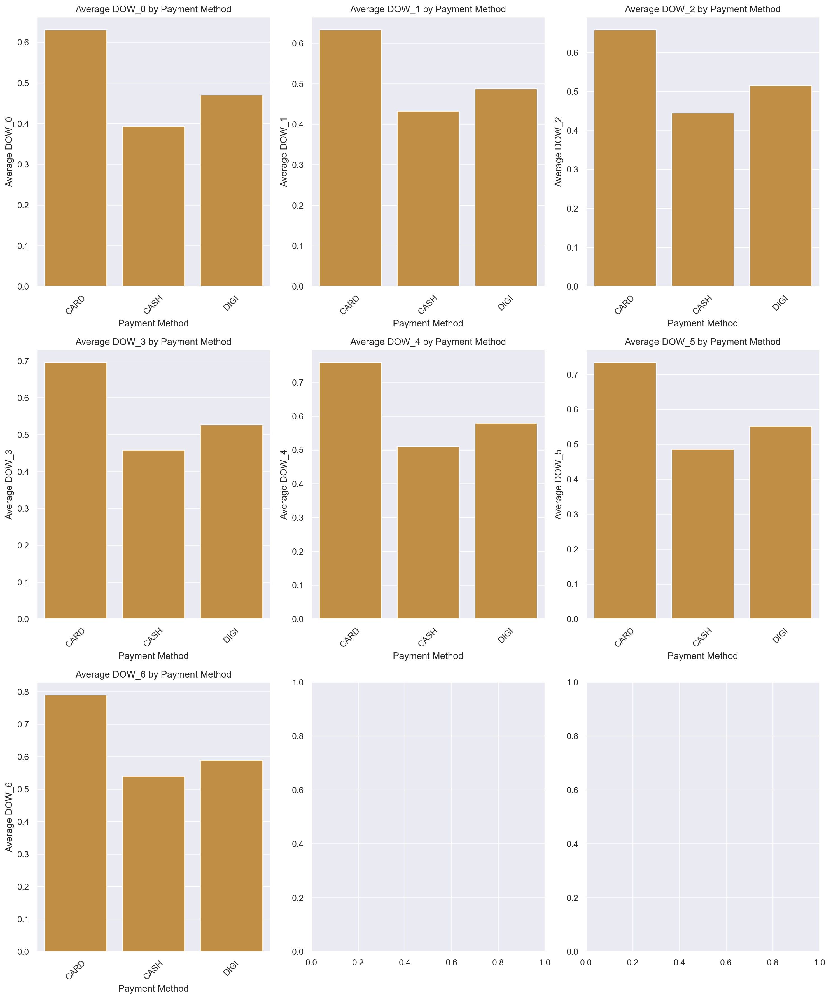

In [368]:
fig, axes = plt.subplots(3, 3, figsize=(15, 18))

axes = axes.flatten()

for i in range(7):
    dow_column = f'DOW_{i}'  #making it run through all the dow columns
    avg_data = food_df.groupby('payment_method')[dow_column].mean().reset_index()
    
    sns.barplot(x='payment_method', y=dow_column, data=avg_data, ax=axes[i], color=colors["Y"])
    
    axes[i].set_title(f'Average {dow_column} by Payment Method')
    axes[i].set_xlabel('Payment Method')
    axes[i].set_ylabel(f'Average {dow_column}')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()

plt.show()

`Summary`: There is also no significant difference in behaviour of payment method for each day of the week.

    Cuisines by Payment Method

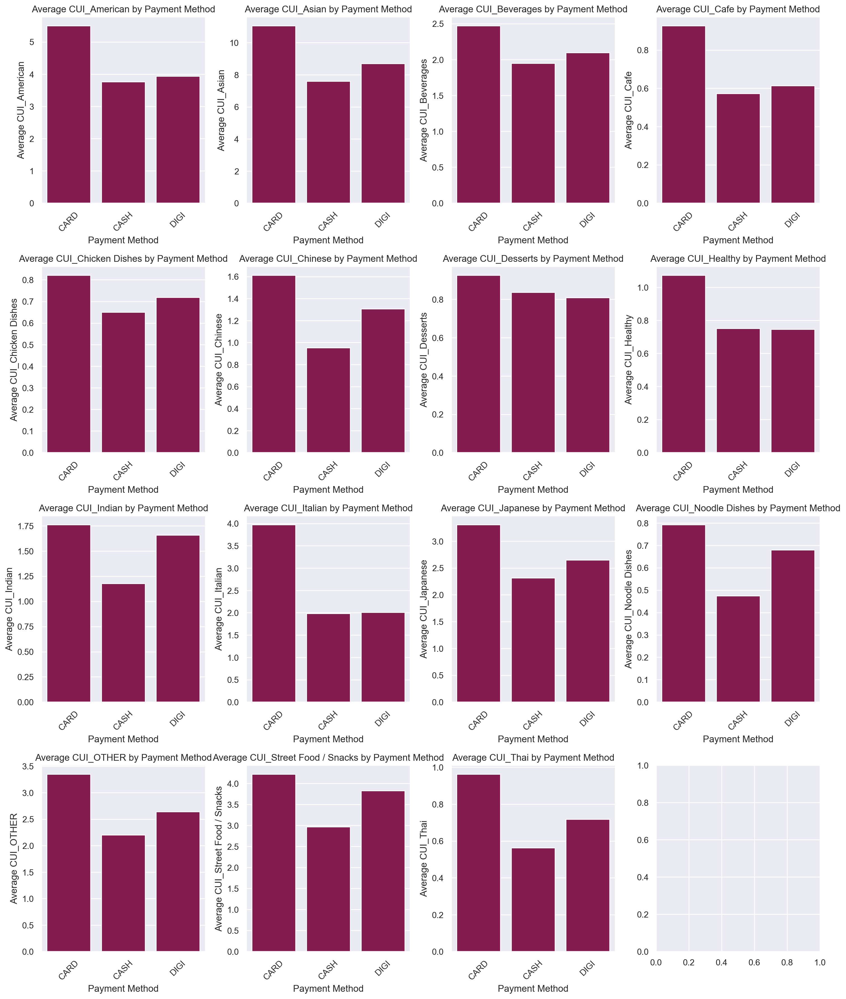

In [369]:

cuisine_columns = [col for col in food_df.columns if col.startswith('CUI_')]

fig, axes = plt.subplots(4, 4, figsize=(15, 18))  

axes = axes.flatten()

for i, cuisine_column in enumerate(cuisine_columns):
    avg_data = food_df.groupby('payment_method')[cuisine_column].mean().reset_index()
    
    sns.barplot(x='payment_method', y=cuisine_column, data=avg_data, ax=axes[i], color=colors["M"])
    
    axes[i].set_title(f'Average {cuisine_column} by Payment Method')
    axes[i].set_xlabel('Payment Method')
    axes[i].set_ylabel(f'Average {cuisine_column}')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()

plt.show()

`Summary`: Although, the Payment method card  maintains as the highest one, for the Italian and Cafe Cuisines, it is significantly higher then the others.

**Cramer's V association matrix** ---`Todo:` Sinto que isto é um bocado irrelevante....

Now we wwant to analyse any association between our categorical varibales, and for that, we are using the Cramer's V association matrix, whcih will tell us the frequency of occurance for each cases of association.

In [370]:
contingency_table_cr_lp = pd.crosstab(food_df['customer_region'], food_df['last_promo'])

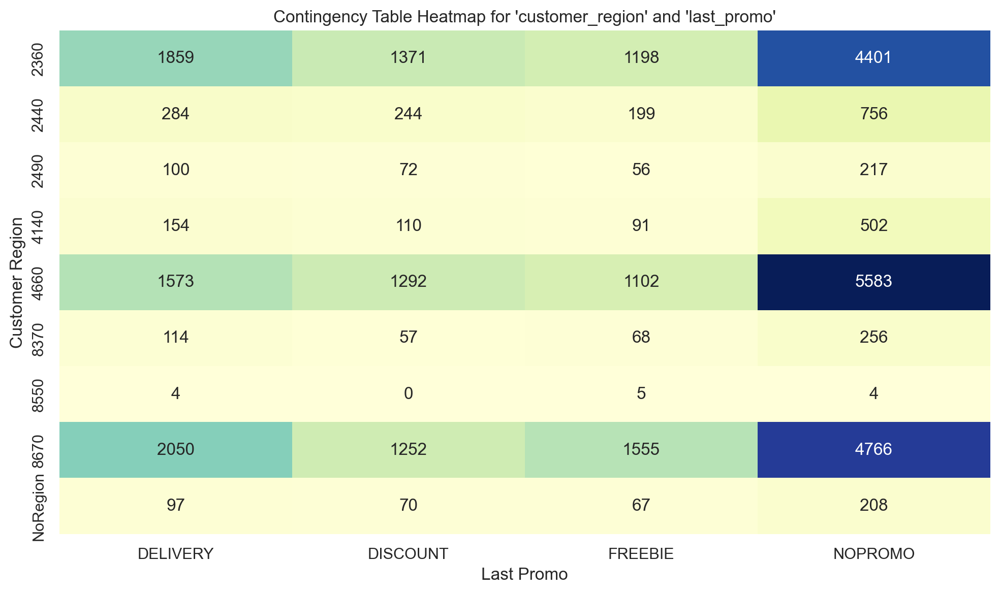

In [371]:
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table_cr_lp, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
plt.title("Contingency Table Heatmap for 'customer_region' and 'last_promo'")
plt.xlabel('Last Promo')
plt.ylabel('Customer Region')
plt.tight_layout()

plt.show()

For customer region and payment method

In [372]:
contingency_table_cr_pm = pd.crosstab(food_df['customer_region'], food_df['payment_method'])

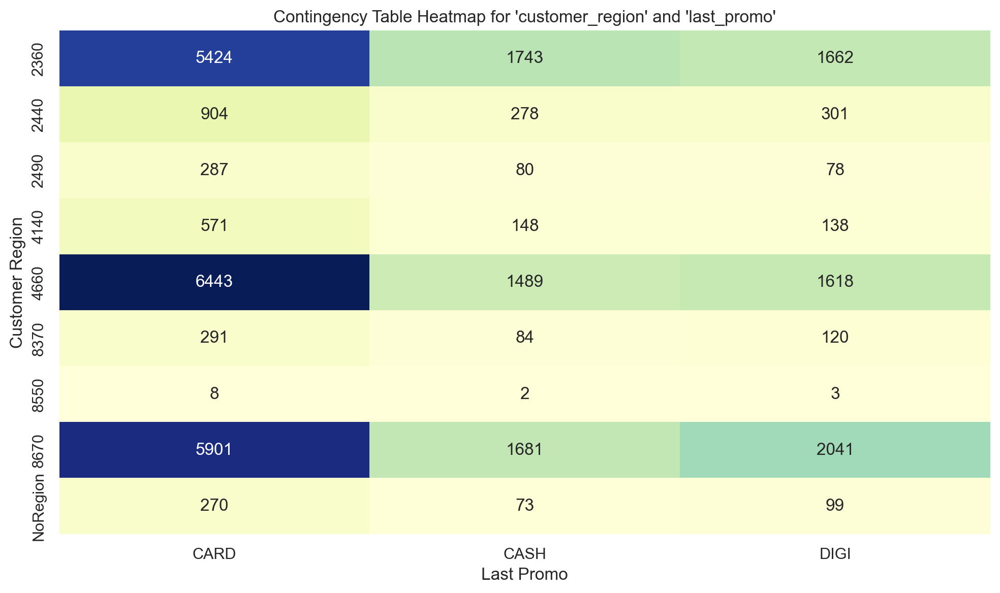

In [373]:
plt.figure(figsize=(10, 6))
sns.heatmap(contingency_table_cr_pm, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
plt.title("Contingency Table Heatmap for 'customer_region' and 'last_promo'")
plt.xlabel('Last Promo')
plt.ylabel('Customer Region')
plt.tight_layout()

plt.show()

`Key Takeaways`-Bivariate Analysis:
* Most of the orders are done when there is no promotion, but if there is a promotion the most popular is "DELIVERY".
* The regions: 8670, 4660, and 2360 are the most pouplar for each type of promotion and for each type of payment method.

## **EDA Conclusions**

<hr>

### Insights on the Features

| Section| Insights observed | 
| --- | --- | 
| Initial Analysis | We identified strange values in the first_order column; We observed that HR_0 only has 0 or nan values. |
| Duplicated values | We identified 13 duplicated rows, in which those rows are all from the region with the least entries |
| Missing Values | Identified 3 numerical varibales wiht missing vlaues, and 2 categorical variables with weird entries, for which we replaced "-" by "Nopromo" or "noregion"|
| Changing Datatypes  | We weren't able to change the datatypes beacsue of the missing values, this step will be repeated after the missing values are treated. |
| Feature Engineering |  We created agregations using the CUI_ columns, the HR_ columna nd the DOW_ columns |
| HR_0 |  We identified the values of the HR_0 column by getting the idfference between the total orders(by Day of the week) and the total orders_HR(by hour of the week) |
| is_chain | We identified anomalies in the data entries, where the is_chain is bigger than the total orders and the product_count. |
| Outliers | We identified outliers in each of the column of our dataset by using the INter-Quartile Range formula. These outliers will be later delt with. |
| Customer_Behaviour | When analysing the categorical variables we observed some customer preferences wehn making orders, such as, the highest payment method being CARD, and the gighest promotion category, which is "delivery". |
| Univariate Visualization | The distribution of some of the numerical feautres are very right skewed;  |
| Bivariate Visualization | There are evident correlation between some of our variables: the best type of segmentation that we could follow so far, has been the behavior segmentation and the geographic segmentation  |

<hr>

# 3. DATA PRE-PROCESSING

In this section of the notebook, the main objective will be to evaluate and treat data incoherences and anomalies, such as missing values, outliers, and also to perfome some feature engineering.

## 3.1 Missing Values

    HR_0

We treated the HR_0 column differently to get to a result that makes sense. We got to this conclusion in the `Data Statistics` Section. 

The values of the HR_0 column correspond to the difference between the columns `Total orders` and `Total orders_HR`, as we callled it as "discrepancy"

In [374]:
food_df['HR_0'] = food_df['HR_0'].fillna(discrepancy)

In [375]:
#Changing the data type of the column, from float to int
food_df['HR_0'] = food_df['HR_0'].astype(int)

We identified this as the next steps to treat the missing values of the colmuns reffered below, as they are crucial to our analysis.

In [376]:
# Checking and printing columns with missing values afetr the replacement
for column in food_df.columns:
    missing_values = food_df[column].isna().sum()
    if missing_values > 0:
        print(f"\033[1;35m{column} \033[0m has \033[1;35m{missing_values}\033[0m missing values")

customer_age  has 727 missing values
first_order  has 106 missing values


    First_Order

We idenitified that the cases where we had missing vlaues in the `First Order` column, were cases where the `Last Order` column had a "0" and the `total orders` column had "1"

In [377]:
food_df[(food_df['last_order'] == 0) & (food_df['first_order'].isna()) ]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,Total orders,Total orders_HR
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0366fbb035,8670,24.0,1,1,0,NaN,0,NOPROMO,DIGI,0.00,11.87,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0.0,1,0,0.00,11.87,0.00,1,1
039d7c8a20,4660,23.0,1,1,0,NaN,0,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,14.49,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0.0,1,0,0.00,14.49,0.00,1,1
04c9d25c93,8670,27.0,1,1,1,NaN,0,DISCOUNT,CASH,18.16,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0.0,1,0,18.16,0.00,0.00,1,1
09118ae9e7,8670,36.0,1,1,0,NaN,0,NOPROMO,CARD,0.00,6.02,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0.0,1,0,0.00,6.02,0.00,1,1
0d1f298bbd,4660,22.0,1,1,1,NaN,0,DISCOUNT,CASH,5.22,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0.0,1,0,5.22,0.00,0.00,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
f4e366c281,8670,30.0,1,1,1,NaN,0,FREEBIE,DIGI,0.00,0.00,18.04,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0.0,1,0,0.00,0.00,18.04,1,1
f6b6709018,8670,NaN,1,1,0,NaN,0,DELIVERY,DIGI,18.04,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0.0,1,0,18.04,0.00,0.00,1,1
f74ad8ce3f,8670,24.0,1,1,1,NaN,0,NOPROMO,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,17.79,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,1,0,0.00,0.00,17.79,1,1


In [378]:
rows_na=food_df[(food_df['last_order'] == 0) & (food_df['first_order'].isna())].shape[0]
print(f"We identified the \033[1;35m{rows_na}\033[1;0m missing values form the First_Order column")

We identified the 106 missing values form the First_Order column


In [379]:
#Checking if we are wrong and there are missing values in other cases
food_df[(food_df['last_order'] != 0) & (food_df['first_order'].isna())]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,Total orders,Total orders_HR
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


Now that we confirmed that the missing values form the First Order column, are equal to zero, we filled those missing values with the actual data

In [380]:
food_df['first_order'] = food_df['first_order'].fillna(0)

In [381]:
food_df['first_order'].isna().sum()

0

In [382]:
#Changing the data type of the column, from float to int
food_df['first_order'] = food_df['first_order'].astype(int)

    Customer_Age

In [383]:
food_df.describe()

,customer_age,vendor_count,product_count,is_chain,first_order,last_order,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,Total orders,Total orders_HR
count,31010.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.00000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000,31737.000000
mean,27.509513,3.116205,5.693638,2.829253,28.304440,63.755049,4.898412,9.998594,2.308218,0.804975,0.771751,1.438027,0.888566,0.954724,1.638914,3.248795,3.009058,0.715062,3.014186,3.927394,0.845701,0.558339,0.570029,0.593503,0.622081,0.680814,0.655796,0.707471,0.048902,0.054069,0.063428,0.118820,0.102152,0.08227,0.069918,0.077008,0.132432,0.234962,0.331096,0.379904,0.315625,0.237452,0.216624,0.278319,0.358131,0.392759,0.338564,0.246747,0.143492,0.071494,0.048492,0.045373,1.925103,1.829505,0.584523,2.044081,2.343952,8.918957,17.645356,4.001759,4.388033,4.339131
std,7.162798,2.770195,6.962552,3.983643,24.088492,23.181964,11.667887,23.603496,8.492919,6.442166,3.665578,8.210623,5.272012,5.844075,7.460068,11.272500,10.202599,4.546970,9.789314,15.579992,4.443200,1.015171,1.045785,1.047444,1.071099,1.089727,1.071256,1.169202,0.313652,0.317700,0.352228,0.498135,0.438448,0.35944,0.329990,0.378134,0.636923,0.726425,0.892982,0.961879,0.844199,0.638706,0.600230,0.739659,0.876181,0.945570,0.895771,0.796995,0.587839,0.349330,0.298955,0.282608,2.993728,2.925060,1.390843,2.517442,3.187701,17.266283,29.942961,12.042046,5.087637,5.052831
min,15.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,23.000000,1.000000,2.000000,1.000000,7.000000,49.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,2.000000,2.000000
50%,26.000000,2.000000,3.000000,2.000000,22.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000

In [384]:
food_df['customer_age'].fillna(food_df['customer_age'].median(), inplace=True)  #TODO fazer knn or maybe we could do it with the average age of each region? por exemplo

In [385]:
#Changing the data type of the column, from float to int
food_df['customer_age'] = food_df['customer_age'].astype(int)

In [386]:
food_df['customer_age'].isna().sum()

0

### EDA for treated missing values

Getting the statistics of our dataset, after the missing values are treated

    HR_0

In [387]:
#Creating a new column of the sum of HR columns, to check if the values are the same
food_df["HR_Total"] = food_df[[f'HR_{i}' for i in range(24)]].sum(axis=1).astype(int)


In [388]:
#Checking if the values were well imputated
food_df[food_df["HR_Total"] != food_df["Total orders"]]


,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,Total orders,Total orders_HR,HR_Total
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [389]:
#Statistics for the HR_0 column
food_df.groupby('HR_0').describe().round(2)

customer_age                                               vendor_count  \
            count   mean    std   min    25%   50%    75%   max        count   
HR_0                                                                           
0         30573.0  27.47   7.09  15.0  23.00  26.0  31.00  80.0      30573.0   
1           934.0  27.55   6.85  15.0  23.00  26.0  31.00  69.0        934.0   
2           159.0  26.81   6.82  17.0  22.00  25.0  29.00  57.0        159.0   
3            39.0  27.62   6.14  19.0  23.00  26.0  31.00  50.0         39.0   
4            15.0  25.13   7.09  18.0  21.50  23.0  26.00  47.0         15.0   
5             8.0  34.00  15.68  25.0  26.00  29.0  31.25  72.0          8.0   
6             2.0  42.50   3.54  40.0  41.25  42.5  43.75  45.0          2.0   
7             1.0  26.00    NaN  26.0  26.00  26.0  26.00  26.0          1.0   
8             1.0  36.00    NaN  36.0  36.00  36.0  36.00  36.0          1.0   
9             2.0  27.00   4.24  24.0  25.50  27.0  28.50  30.0          2.0   
11            1.0  32.00    NaN  32.0  32.00  32.0  32.00  32.0          1.0   
12            1.0  23.00    NaN  23.0  23.00  23.0  23.00  23.0          1.0   
15            1.0  29.00    NaN  29.0  29.00  29.0  29.00  29.0          1.0   

                                                  product_count                \
       mean   std   min    25%   50%    75%   max         count   mean    std   
HR_0                                                                            
0      3.04  2.68   1.0   1.00   2.0   4.00  41.0       30573.0   5.54   6.77   
1      4.65  3.60   1.0   2.00   4.0   6.00  32.0         934.0   8.51   8.33   
2      6.01  4.78   1.0   3.00   4.0   8.00  24.0         159.0  12.38  10.70   
3      8.03  5.94   1.0   4.00   6.0  10.50  27.0          39.0  20.77  19.24   
4      8.93  6.33   1.0   4.00   8.0  13.00  23.0          15.0  18.13   9.78   
5      9.75  9.30   3.0   4.50   6.5   9.50  30.0           8.0  23.38  17.82   
6      8.50  7.78   3.0   5.75   8.5  11.25  14.0           2.0  25.00  11.31   
7     16.00   NaN  16.0  16.00  16.0  16.00  16.0           1.0  30.00    NaN   
8      4.00   NaN   4.0   4.00   4.0   4.00   4.0           1.0  12.00    NaN   
9     12.50  3.54  10.0  11.25  12.5  13.75  15.0           2.0  28.50  10.61   
11     5.00   NaN   5.0   5.00   5.0   5.00   5.0           1.0  21.00    NaN   
12    22.00   NaN  22.0  22.00  22.0  22.00  22.0           1.0  64.00    NaN   
15     4.00   NaN   4.0   4.00   4.0   4.00   4.0           1.0  18.00    NaN   

                                      is_chain                             \
       min    25%   50%    75%    max    count   mean    std   min    25%   
HR_0                                                                        
0      1.0   2.00   3.0   6.00  269.0  30573.0   2.76   3.88   0.0   1.00   
1      1.0   3.00   6.0  11.00   83.0    934.0   3.96   4.69   0.0   1.00   
2      2.0   5.00   9.0  16.50   56.0    159.0   5.33   5.68   0.0   2.00   
3      3.0   9.00  14.0  25.00   88.0     39.0  11.90  15.85   0.0   3.50   
4      5.0  11.50  16.0  25.00   37.0     15.0   7.67   6.67   1.0   3.00   
5     10.0  13.50  15.5  27.00   64.0      8.0  10.88   6.15   2.0   6.75   
6     17.0  21.00  25.0  29.00   33.0      2.0   7.00   4.24   4.0   5.50   
7     30.0  30.00  30.0  30.00   30.0      1.0   4.00    NaN   4.0   4.00   
8     12.0  12.00  12.0  12.00   12.0      1.0   3.00    NaN   3.0   3.00   
9     21.0  24.75  28.5  32.25   36.0      2.0   3.50   0.71   3.0   3.25   
11    21.0  21.00  21.0  21.00   21.0      1.0  14.00    NaN  14.0  14.00   
12    64.0  64.00  64.0  64.00   64.0      1.0   9.00    NaN   9.0   9.00   
15    18.0  18.00  18.0  18.00   18.0      1.0  18.00    NaN  18.0  18.00   

                        first_order                                          \
       50%    75%   max       count   mean    std   min    25%   50%    75%   
HR_0                                

Most of the data of HR_0 is concentrated at 0, meaning that there is pattern of people not making orders at HR_0 

    HR by region now with the corrected HR_0

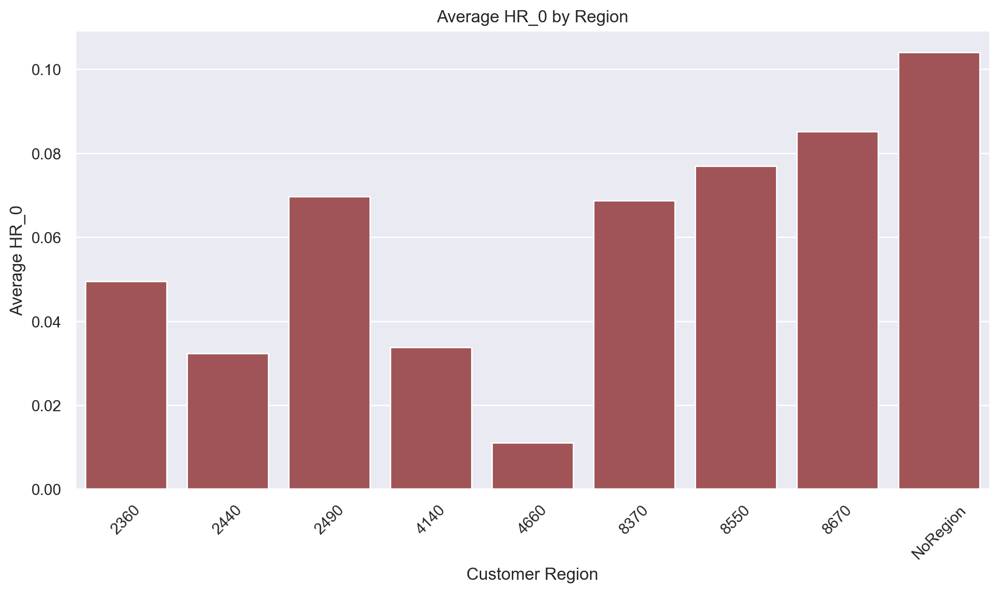

In [390]:


hr_column = 'HR_0'
avg_data = food_df.groupby('customer_region')[hr_column].mean().reset_index()

plt.figure(figsize=(10, 6))
sns.barplot(x='customer_region', y=hr_column, data=avg_data, color=colors["PR"])

plt.title(f'Average {hr_column} by Region')
plt.xlabel('Customer Region')
plt.ylabel(f'Average {hr_column}')
plt.xticks(rotation=45)

plt.tight_layout()

plt.show()


For the HR_0, te region with the most orders is "NoRegion", folowed by the "8670" region

    First Order

In [391]:
food_df["first_order"].describe().round(2)

count    31737.00
mean        28.30
std         24.09
min          0.00
25%          7.00
50%         22.00
75%         44.00
max         90.00
Name: first_order, dtype: float64

The average first day of order is the day 28, wiht the median being the day 22

    Customer Age

In [392]:
food_df['customer_age'].describe().round(2) #Getting the statistics of the customer age again

count    31737.00
mean        27.47
std          7.08
min         15.00
25%         23.00
50%         26.00
75%         31.00
max         80.00
Name: customer_age, dtype: float64

After the treatment of missing vlaues, The min cusotmer age is 15, and the maximum is 80. The average age is still 27.

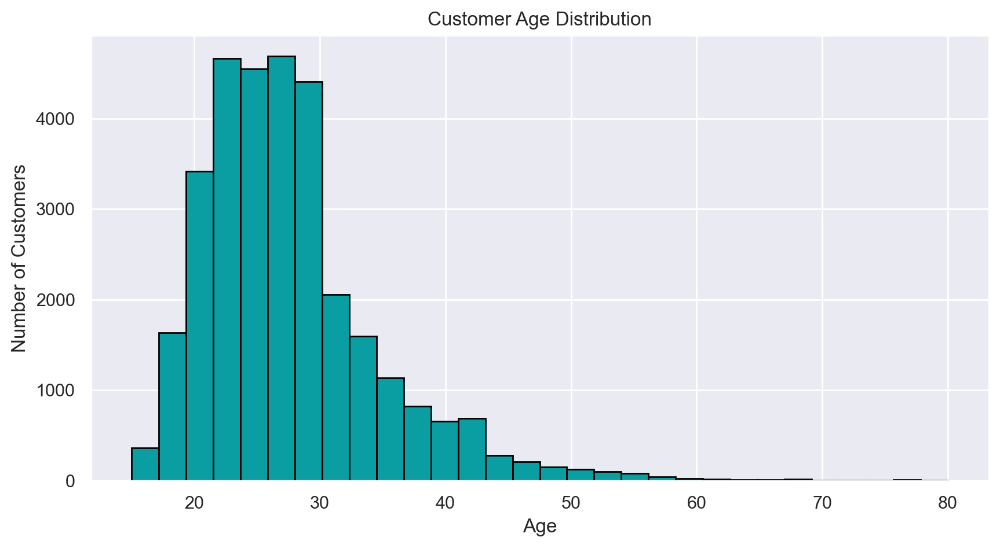

In [393]:
#Visualizing  the distribution of customer age in our dataset, using an histogram
plt.figure(figsize=(10, 5))
plt.hist(food_df['customer_age'], bins=30, color=colors["BL"], edgecolor='black')
plt.title('Customer Age Distribution')
plt.xlabel('Age')
plt.ylabel('Number of Customers')
plt.show()

We can see that the distribution for ages above around 45 are very low, which can again, be possibly identified as outliers.

**Getting the new correlation Matrix after the treatment of the missing values**

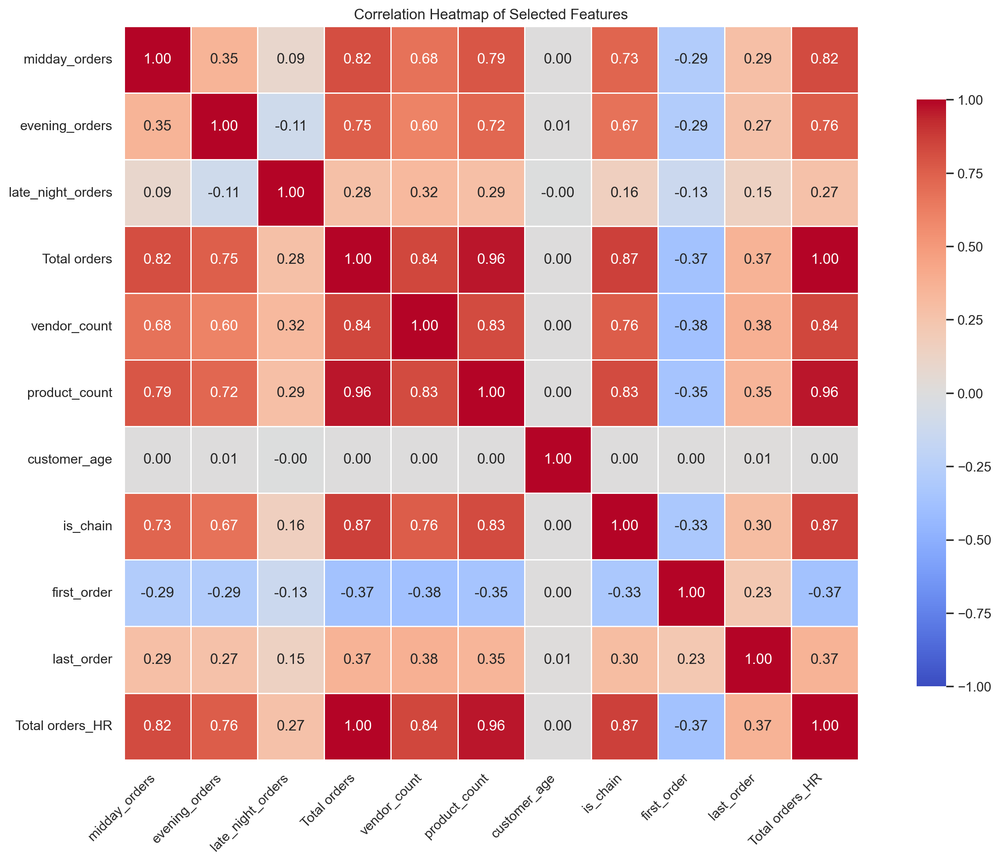

In [394]:
selected_features = [
    'midday_orders', 'evening_orders', 'late_night_orders',
    'Total orders', 'vendor_count', 'product_count', 
    'customer_age', 'is_chain','first_order', 'last_order', 'Total orders_HR'
]


#correlation matrix for the selected features
correlation_matrix = food_df[selected_features].corr()

#heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, 
            annot=True,  
            fmt='.2f',   
            cmap='coolwarm',  
            square=True, 
            cbar_kws={"shrink": .8},  
            linewidths=0.5,  
            vmin=-1,  
            vmax=1)  

plt.title('Correlation Heatmap of Selected Features')
plt.xticks(rotation=45, ha='right')  
plt.yticks(rotation=0)  
plt.tight_layout()  
plt.show()

The correlation didn't change much after the missing vlaues treatment, customer age, still presents no correlation to other features, and first_order presents negative relationships with the other features

## 3.2 Feature Engineering 

In this section, we will  create and explore new features that may be relevant for our segmentation

    Total spent

In [395]:
cuisine_columns = [
    'Western_Cuisine', 'Asian_Cuisine', 
    'Desserts_Beverages', 'CUI_Healthy', 'CUI_OTHER', 
    'CUI_Street Food / Snacks'
]
#Creating the total spent by adding the cuisine columns
food_df['total_spent'] = food_df[cuisine_columns].sum(axis=1)

In [396]:
food_df['total_spent'].describe().round(2) #Getting the statistics of the new feature

count    31737.00
mean        38.46
std         46.44
min          0.37
25%         13.02
50%         24.20
75%         45.18
max       1418.33
Name: total_spent, dtype: float64

The average total spent per customer is 38.46, but surprisingly, the maximum spent is very high.

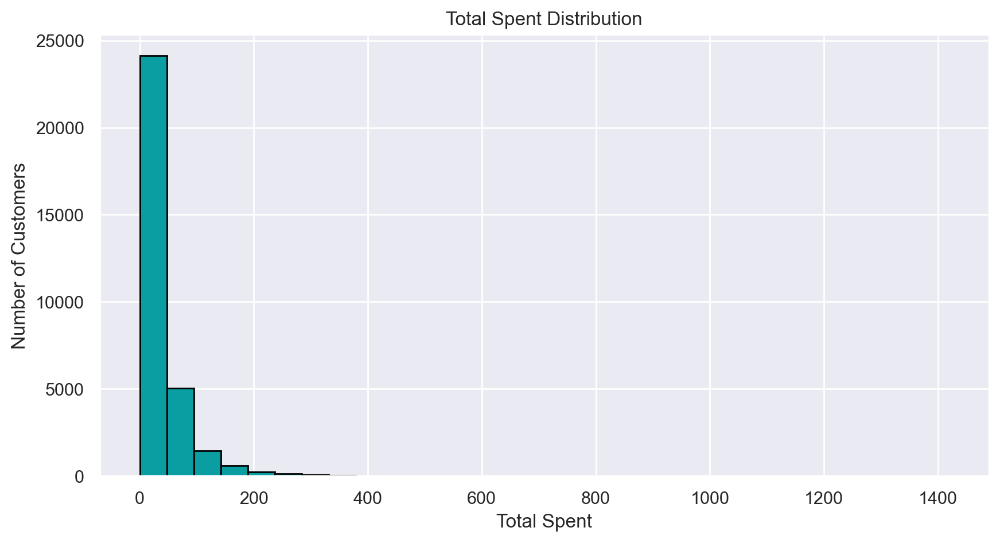

In [397]:
plt.figure(figsize=(10, 5))
plt.hist(food_df['total_spent'], bins=30, color=colors["BL"], edgecolor='black')
plt.title('Total Spent Distribution')
plt.xlabel('Total Spent')
plt.ylabel('Number of Customers')
plt.show()

There are purchases that are very close to zero, and with higher distribution from around 0.37 to aroung 150.

    Average Spent per Order

In [398]:
food_df['Average Spent per Order'] = (food_df['total_spent'] / food_df['Total orders']).round(2)  

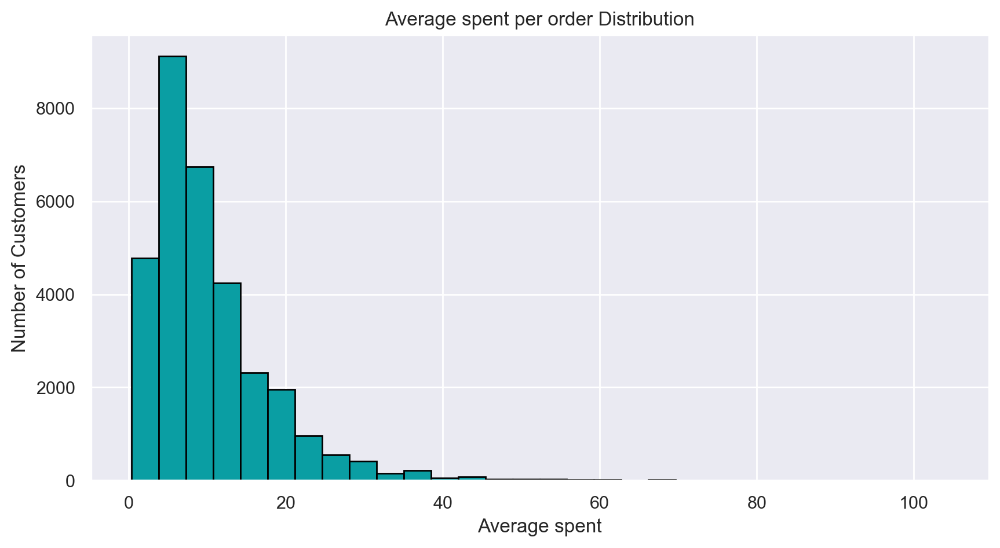

In [399]:
plt.figure(figsize=(10, 5))
plt.hist(food_df['Average Spent per Order'], bins=30, color=colors["BL"], edgecolor='black')
plt.title('Average spent per order Distribution')
plt.xlabel('Average spent')
plt.ylabel('Number of Customers')
plt.show()

The average spent per order distribution moslty goes from around 0.37 to arount 30.0, with some vlaues very distant from this distribution.

    Days Between Orders

In [400]:
food_df['Days Between Orders'] = food_df['last_order'] - food_df['first_order'] 

In [401]:
food_df['Days Between Orders'].describe().round(2)

count    31737.00
mean        35.45
std         29.41
min          0.00
25%          3.00
50%         34.00
75%         62.00
max         90.00
Name: Days Between Orders, dtype: float64

The average day between orders is 35 and the median is 34, although there are people with day between order equal to 0, meaning that they only made orders once.

    is_one_time_customer

In [402]:
# customers that just come once, our bad customer
food_df['is_one_time_customer'] = (food_df['Total orders'] == 1).astype(int) 

In [403]:

nr_one_time_customers= food_df[food_df['is_one_time_customer']==1].shape[0]
other_customers= food_df[food_df['is_one_time_customer']==0].shape[0]


print(f"There are \033[1;35m{nr_one_time_customers}\033[1;0m who only ordered once")
print(f"There are \033[1;35m{other_customers}\033[1;0m who ordered more than once")

There are 6908 who only ordered once
There are 24829 who ordered more than once


Evaluating per cuisine

In [404]:

food_df.groupby('is_one_time_customer')[cuisine_columns].describe().round(2).T


is_one_time_customer                   0        1
Western_Cuisine          count  24829.00  6908.00
                         mean      10.62     2.81
                         std       18.91     6.05
                         min        0.00     0.00
                         25%        0.00     0.00
                         50%        4.18     0.00
                         75%       13.32     1.99
                         max      468.33    55.37
Asian_Cuisine            count  24829.00  6908.00
                         mean      20.76     6.45
                         std       32.76    10.03
                         min        0.00     0.00
                         25%        0.00     0.00
                         50%       11.49     0.00
                         75%       26.18    11.45
                         max     1201.27    91.16
Desserts_Beverages       count  24829.00  6908.00
                         mean       4.71     1.45
                         std       13.22     5.44
                         min        0.00     0.00
                         25%        0.00     0.00
                         50%        0.00     0.00
                         75%        3.51     0.00
                         max      326.10    73.02
CUI_Healthy              count  24829.00  6908.00
                         mean       1.15     0.24
                         std        6.50     2.12
                         min        0.00     0.00
                         25%        0.00     0.00
                         50%        0.00     0.00
                         75%        0.00     0.00
                         max      255.81    43.33
CUI_OTHER                count  24829.00  6908.00
                         mean       3.60     0.90
                         std       10.82     3.66
                         min        0.00     0.00
                         25%        0.00     0.00
                         50%        0.00     0.00
                         75%        1.46     0.00
                         max      366.08    78.94
CUI_Street Food / Snacks count  24829.00  6908.00
                         mean       4.37     2.32
                         std       16.93     9.07
                         min        0.00     0.00
                         25%        0.00     0.00
                         50%        0.00     0.00
                         75%        0.00     0.00
                         max      454.45   104.32

Todo: On average, one time customers buy less than the other customers per cuisine. But it is important to notice that since we don't know the quantity of orders per cuisine, the metrics aren't accurate- They are done, by summing all the purchases in certain cuisines

**Evaluating per Region**: Analysing the percentage of one time customers for each region

In [405]:
percentage_region_customer=food_df.customer_region.value_counts()
percentage_region_customer.round(2)

customer_region
8670        9623
4660        9550
2360        8829
2440        1483
4140         857
8370         495
2490         445
NoRegion     442
8550          13
Name: count, dtype: int64

In [406]:
# Aggregating one-time customer count and percentage by customer_region
result = food_df.groupby("customer_region").agg(
    one_time_customers=("is_one_time_customer", "sum"),  # Total one-time customers
    total_customers=("is_one_time_customer", "count"),  # Total customers
)

# Calculate percentage of one-time customers
result["one_time_customer_percentage"] = ((result["one_time_customers"] / result["total_customers"]) * 100).round(2)

# Calculate the percentage of non-one-time customers
result["more_than_once_customer_percentage"] = 100 - result["one_time_customer_percentage"]

result



,one_time_customers,total_customers,one_time_customer_percentage,more_than_once_customer_percentage
customer_region,,,,
2360,1635,8829,18.52,81.48
2440,284,1483,19.15,80.85
2490,90,445,20.22,79.78
4140,254,857,29.64,70.36
4660,2029,9550,21.25,78.75
8370,180,495,36.36,63.64
8550,3,13,23.08,76.92
8670,2297,9623,23.87,76.13
NoRegion,136,442,30.77,69.23


    percent_chain_orders

In [407]:
#Since, is_chain cannot be bigger than total orders, checking if there are any abnormal like cases
food_df[food_df['Total orders'] < food_df['is_chain']]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,Total orders,Total orders_HR,HR_Total,total_spent,Average Spent per Order,Days Between Orders,is_one_time_customer
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [408]:
#Getting the percentage chain orders
food_df['percent_chain_orders'] = (food_df['is_chain'] / food_df['Total orders'].replace(0, np.nan)).round(3)

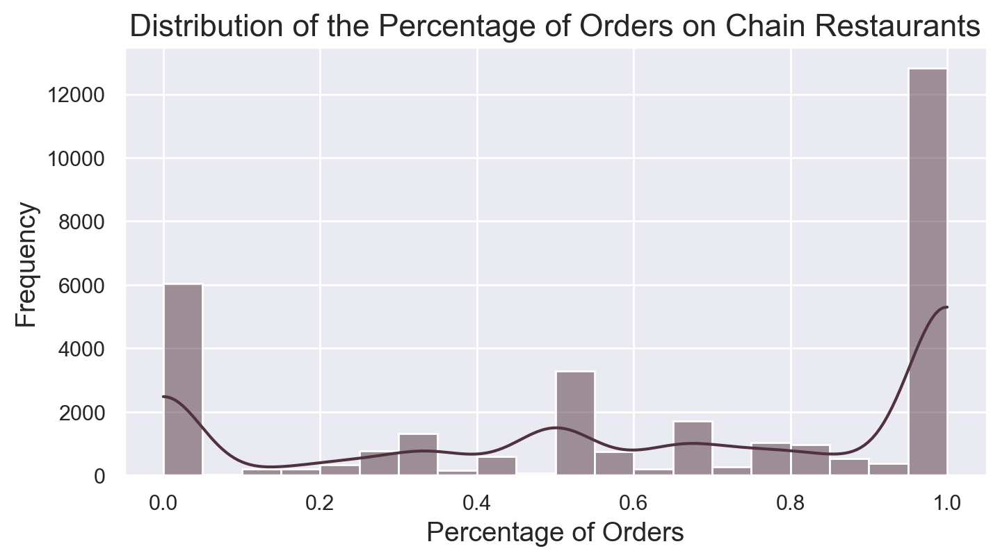

In [409]:
plt.figure(figsize=(8, 4))
sns.histplot(food_df['percent_chain_orders'].dropna(), bins=20, kde=True, color=colors["BR"])
plt.title('Distribution of the Percentage of Orders on Chain Restaurants', fontsize=16)
plt.xlabel('Percentage of Orders', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()


We can observe that most of the people that buy from chain restaurants, only buy chain restaurants.

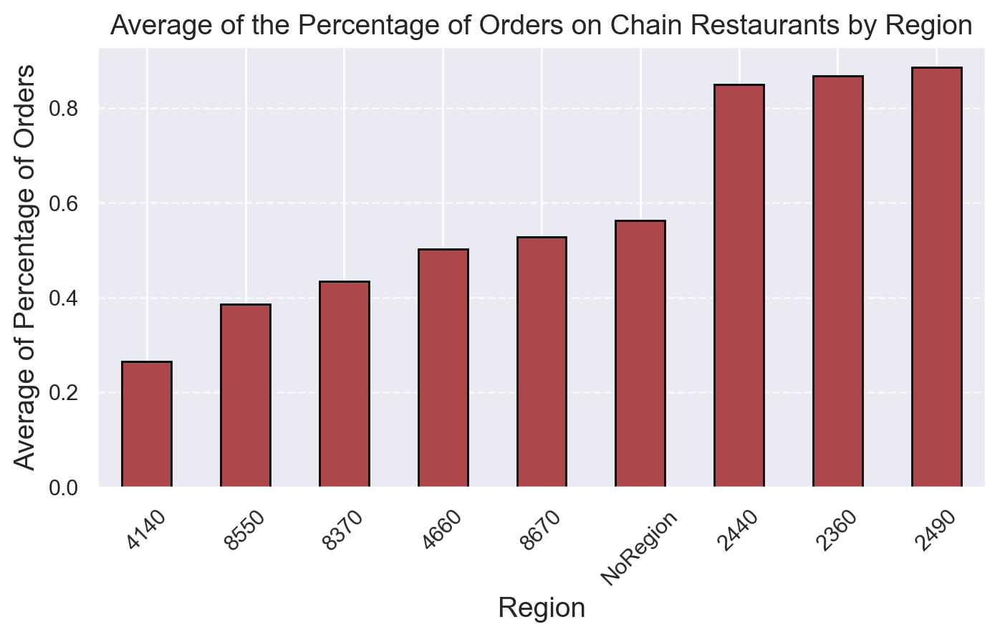

In [410]:
plt.figure(figsize=(8, 4))
avg_percent_by_region = food_df.groupby('customer_region')['percent_chain_orders'].mean().sort_values()
avg_percent_by_region.plot(kind='bar', color=colors["PR"], edgecolor='black')
plt.title('Average of the Percentage of Orders on Chain Restaurants by Region', fontsize=14)
plt.xlabel('Region', fontsize=14)
plt.ylabel('Average of Percentage of Orders', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

The regions with the highest averages are 2440, 2360 and 2490, and the one with the lowest average is 4140. 

    non_chain_orders

In [411]:
#Chain orders
food_df['chain_orders'] = food_df['Total orders'] * food_df['percent_chain_orders']

#Non-Chain orders
food_df['non_chain_orders'] = food_df['Total orders'] - food_df['chain_orders']


In [412]:
food_df.head()

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,Total orders,Total orders_HR,HR_Total,total_spent,Average Spent per Order,Days Between Orders,is_one_time_customer,percent_chain_orders,chain_orders,non_chain_orders
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,2360,18,2,5,1,0,1,DELIVERY,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,2,0.0,1,1,0.00,28.88,0.0,2,2,2,28.88,14.44,1,0,0.5,1.0,1.0
5d272b9dcb,8670,17,2,2,2,0,1,DISCOUNT,DIGI,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0.0,1,1,12.82,6.39,0.0,2,2,2,19.21,9.60,1,0,1.0,2.0,0.0
f6d1b2ba63,4660,38,1,2,2,0,1,DISCOUNT,CASH,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0.0,1,1,9.20,0.00,0.0,2,2,2,9.20,4.60,1,0,1.0,2.0,0.0
180c632ed8,4660,26,2,3,1,0,2,DELIVERY,DIGI,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,2,0,0.0,1,1,0.00,31.56,0.0,2,2,2,31.56,15.78,2,0,0.5,1.0,1.0
4eb37a6705,4660,20,2,5,0,0,2,NOPROMO,DIGI,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0.0,1,1,14.57,40.87,0.0,2,2,2,55.44,27.72,2,0,0.0,0.0,2.0


Analysing the frequency of clients on chain restaurants and not chain restaurants


In [413]:
#Average orders per chain
food_df['chain_orders_per_day'] = food_df['chain_orders'] / food_df['Days Between Orders'].replace(0, 1)

#Average on chain order per day
food_df['non_chain_orders_per_day'] = food_df['non_chain_orders'] / food_df['Days Between Orders'].replace(0, 1) #Replacing the values 0 by a number very close to zero, to avoid error in the division calculation

In [414]:
average_chain_orders_per_day = food_df['chain_orders_per_day'].mean().round(2)
average_non_chain_orders_per_day = food_df['non_chain_orders_per_day'].mean().round(2)

print(f"Average order per day on chain restaurants: \033[1;35m{average_chain_orders_per_day:}\033[1;0m ")
print(f"Average order per day on non chain restaurants: \033[1;35m{average_non_chain_orders_per_day:}\033[1;0m ")

Average order per day on chain restaurants: 0.23 
Average order per day on non chain restaurants: 0.14 


    Age Categories

In [415]:
age_bins = [0, 18, 25, 35, 50, 65, 100]  
age_cats = ['<18', '18-24', '25-34', '35-49', '50-64', '65+']

food_df['age_category'] = pd.cut(food_df['customer_age'], bins=age_bins, labels=age_cats, right=False)


In [416]:
food_df[['customer_age', 'age_category']].head()


,customer_age,age_category
customer_id,,
1b8f824d5e,18,18-24
5d272b9dcb,17,<18
f6d1b2ba63,38,35-49
180c632ed8,26,25-34
4eb37a6705,20,18-24


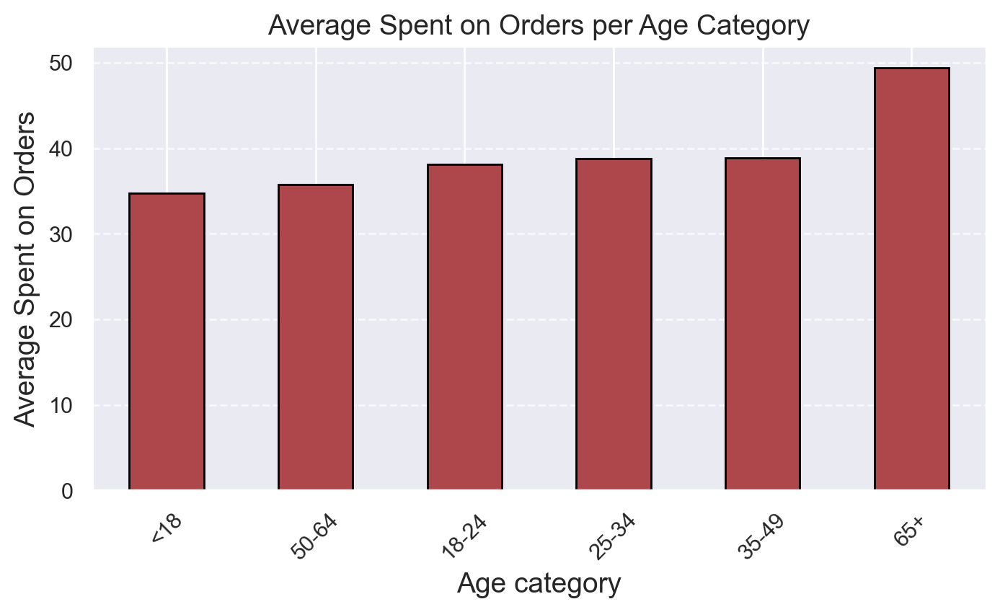

In [417]:
plt.figure(figsize=(8, 4))
avg_percent_by_region = food_df.groupby('age_category')['total_spent'].mean().sort_values()
avg_percent_by_region.plot(kind='bar', color=colors["PR"], edgecolor='black')
plt.title('Average Spent on Orders per Age Category', fontsize=14)
plt.xlabel('Age category', fontsize=14)
plt.ylabel('Average Spent on Orders', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

    Final Inisghts

In [418]:
food_df.columns

Index(['customer_region', 'customer_age', 'vendor_count', 'product_count',
       'is_chain', 'first_order', 'last_order', 'last_promo', 'payment_method',
       'CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1',
       'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2',
       'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10',
       'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18',
       'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23', 'midday_orders',
       'evening_orders', 'late_night_orders', 'Weekend', 'Weekday',
       'Western_Cuisine', 'Asian_Cuisine', 'Desserts_Beverages',
       'Total orders', 'Total orders_HR', 'HR_Total', 'total_spent',
       'Average Spent per Order', 'Days Between Orders',

In [ ]:
# List of columns to drop
columns_to_drop = ['DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 
                   'HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 
                   'HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13', 'HR_14', 
                   'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21', 
                   'HR_22', 'HR_23', 'Total orders_HR', 'HR_Total',
                   'CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe', 
                   'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 
                   'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes', 
                   'CUI_Thai']

# Drop the columns from the DataFrame
food_df = food_df.drop(columns=columns_to_drop) 

In [ ]:
# Define the new order of columns
new_column_order = ['customer_region', 
                    'vendor_count', 'customer_age', 'product_count', 'is_chain', 
                    'first_order', 'last_order', 'last_promo', 
                    'midday_orders', 'evening_orders', 'late_night_orders', 
                    'payment_method', 
                    'Western_Cuisine', 'Asian_Cuisine', 'Desserts_Beverages', 
                    'CUI_Healthy', 'CUI_OTHER', 'CUI_Street Food / Snacks','Days Between Orders',
                    'Total orders', 'total_spent','Average Spent per Order', 'Weekday', 'Weekend']

# Reorder the column
food_df = food_df[new_column_order]

## 3.3 Treating Outliers

In [224]:
outlier_percentages = {}

# We know that low outliers are below Q 1 − 1.5 ⋅ IQR ‍ and high outliers are above Q 3 + 1.5 ⋅ IQR 
for column in food_df.columns:
    if pd.api.types.is_numeric_dtype(food_df[column]):
        #Defining Q1 and Q3 to then find IQR 
        Q1 = food_df[column].quantile(0.25)
        Q3 = food_df[column].quantile(0.75)
        IQR = Q3 - Q1
        #Getting the outliers below the first quantile and above the second quantile
        outliers = food_df[(food_df[column] < (Q1 - 1.5 * IQR)) | (food_df[column] > (Q3 + 1.5 * IQR))]
        #Getting the percentage of the outliers
        percentage_outliers = (len(outliers) / len(food_df)) * 100
        outlier_percentages[column] = percentage_outliers

#Printing the results and counting the number of columns per the percentage higher or lower than 5.
nr_col_lower_5=0
nr_col_higher_5=0
print("Percentage of outliers per column using IQR:")
for column, percentage in outlier_percentages.items():
    print(f"{column}: \033[1;35m{percentage:.2f}%\033[0m")
    if percentage <5:
        nr_col_lower_5+=1
    if percentage >5:
        nr_col_higher_5+=1

#Printing the number of columns who have a percentage lower than 5% and then higher than 5%. 
# We chose 5% because it was the percentage advised during classes
print(f"From the columns, \033[1;33m{nr_col_lower_5}\033[0m have a percentage lower than 5%")
print(f"From the columns, \033[1;33m{nr_col_higher_5}\033[0m have a percentage higher than 5%")

Percentage of outliers per column using IQR:
vendor_count: 4.80%
customer_age: 3.40%
product_count: 7.47%
is_chain: 9.94%
first_order: 0.00%
last_order: 0.00%
midday_orders: 7.51%
evening_orders: 7.70%
late_night_orders: 6.77%
Western_Cuisine: 7.85%
Asian_Cuisine: 6.55%
Desserts_Beverages: 22.90%
CUI_Healthy: 6.83%
CUI_OTHER: 22.19%
CUI_Street Food / Snacks: 13.37%
Days Between Orders: 0.00%
Total orders: 9.54%
total_spent: 8.21%
Average Spent per Order: 5.05%
Weekday: 7.26%
Weekend: 4.88%
From the columns, 6 have a percentage lower than 5%
From the columns, 15 have a percentage higher than 5%


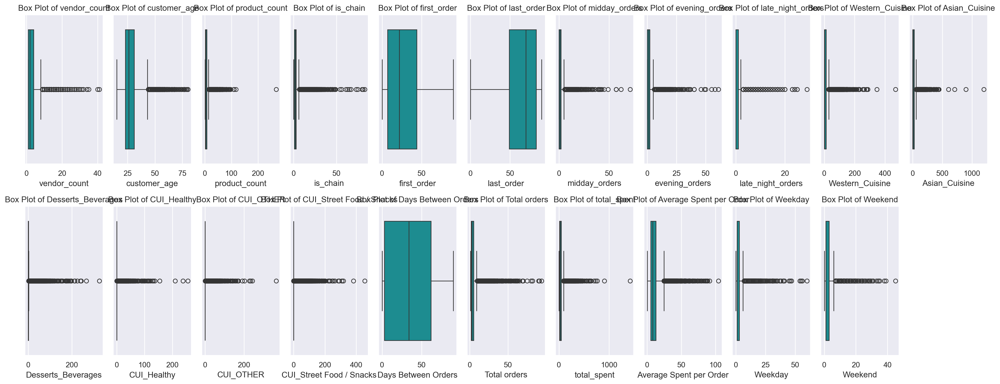

In [225]:
# Filter numerical columns from the DataFrame
numerical_columns = food_df.select_dtypes(include=['int32','int64', 'float64']).columns

# Set the number of rows and columns for the grid
n_cols = 11
n_rows = -(-len(numerical_columns) // n_cols)  # Calculate rows needed

# Set the figure size for readability
plt.figure(figsize=(20, 4 * n_rows))

# Plot each numerical column in a separate horizontal box plot
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.boxplot(data=food_df, x=column, color = colors['BL'])
    plt.title(f'Box Plot of {column}')
    plt.xlabel(column)

plt.tight_layout()
plt.show()

outlier_removal_helper is a function that removes outliers based on IQR.

In [226]:
def outlier_removal_helper(feature):
    Q1 = food_df[feature].quantile(0.25)
    Q3 = food_df[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR

    # Mask to filter values within the IQR range
    mask = food_df[feature].between(lower_limit, upper_limit)
    
    return food_df[mask]


In [227]:
def boxplt_info(feature):
    Q1 = food_df[feature].quantile(0.25)
    Q3 = food_df[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR
    print(lower_limit,upper_limit)


### Dealing With Outliers Lower Than 5% of Our Data

    vendor_count

In [228]:
boxplt_info('vendor_count')

-3.5 8.5


Saving outliers into variables for possible future use.

In [229]:
out_vendor_count = food_df[food_df['vendor_count'] > 8.5][['vendor_count','Western_Cuisine', 'Asian_Cuisine', 'Desserts_Beverages', 'CUI_Healthy','CUI_OTHER', 'CUI_Street Food / Snacks','last_promo' ,'total_spent','Average Spent per Order']]

In [230]:
out_vendor_count # We identified that outliers are not any kind of errors, they could be just 'old ladies'.

,vendor_count,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,CUI_Healthy,CUI_OTHER,CUI_Street Food / Snacks,last_promo,total_spent,Average Spent per Order
customer_id,,,,,,,,,,
508e4b40d5,11,11.19,24.93,3.00,0.0,5.47,0.00,NOPROMO,44.59,3.72
b4813600ca,9,28.76,0.00,0.00,0.0,2.90,0.00,DISCOUNT,31.66,2.88
79b6c34da0,9,18.01,27.07,0.00,0.0,11.28,0.00,NOPROMO,56.36,5.64
504501dfda,9,7.02,16.41,18.32,0.0,0.00,0.00,NOPROMO,41.75,4.18
928baa4e96,12,92.80,72.88,0.00,0.0,0.00,0.00,NOPROMO,165.68,11.83
...,...,...,...,...,...,...,...,...,...,...
cdd2f2ad59,10,35.69,49.36,6.20,0.0,0.00,24.63,DISCOUNT,115.88,8.91
f6308403d1,16,0.00,156.32,24.42,0.0,0.00,30.19,NOPROMO,210.93,12.41
6abcefede6,12,20.23,34.33,5.27,0.0,20.38,0.00,FREEBIE,80.21,5.35


In [231]:
food_df = outlier_removal_helper('vendor_count')

    customer age

In [232]:
boxplt_info('customer_age')

11.0 43.0


In [233]:
food_df[(food_df['customer_age'] > 43)][['customer_age', 'midday_orders','evening_orders','late_night_orders','payment_method','last_promo','Average Spent per Order', 'first_order', 'last_order','Days Between Orders']]

,customer_age,midday_orders,evening_orders,late_night_orders,payment_method,last_promo,Average Spent per Order,first_order,last_order,Days Between Orders
customer_id,,,,,,,,,,
f49ed5489a,51.0,2,0,0.0,CARD,FREEBIE,9.46,0,4,4
eb13ad08ad,47.0,2,1,1.0,CARD,DELIVERY,18.13,0,5,5
b92ab1eeec,47.0,5,0,0.0,DIGI,NOPROMO,4.20,0,6,6
a9f54fe565,48.0,1,0,2.0,CARD,DISCOUNT,14.39,0,12,12
085c69caf5,46.0,4,2,0.0,CARD,DELIVERY,7.58,0,28,28
...,...,...,...,...,...,...,...,...,...,...
eb13c834e7,74.0,0,1,0.0,CARD,DELIVERY,1.75,89,89,0
12faabe829,46.0,1,0,0.0,CARD,NOPROMO,30.60,0,0,0
20c90aaf32,55.0,1,0,0.0,CASH,DISCOUNT,19.43,0,0,0


In [234]:
out_customer_age = food_df[food_df['customer_age'] > 43][['customer_age', 'midday_orders','evening_orders','late_night_orders','payment_method','last_promo','Average Spent per Order']]

In [235]:
out_customer_age

,customer_age,midday_orders,evening_orders,late_night_orders,payment_method,last_promo,Average Spent per Order
customer_id,,,,,,,
f49ed5489a,51.0,2,0,0.0,CARD,FREEBIE,9.46
eb13ad08ad,47.0,2,1,1.0,CARD,DELIVERY,18.13
b92ab1eeec,47.0,5,0,0.0,DIGI,NOPROMO,4.20
a9f54fe565,48.0,1,0,2.0,CARD,DISCOUNT,14.39
085c69caf5,46.0,4,2,0.0,CARD,DELIVERY,7.58
...,...,...,...,...,...,...,...
eb13c834e7,74.0,0,1,0.0,CARD,DELIVERY,1.75
12faabe829,46.0,1,0,0.0,CARD,NOPROMO,30.60
20c90aaf32,55.0,1,0,0.0,CASH,DISCOUNT,19.43


In [236]:
food_df = outlier_removal_helper('customer_age')

In [237]:
boxplt_info('Weekend')

-0.5 3.5


In [238]:
food_df[food_df['Weekend'] > 3.5]

,customer_region,vendor_count,customer_age,product_count,is_chain,first_order,last_order,last_promo,midday_orders,evening_orders,late_night_orders,payment_method,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,CUI_Healthy,CUI_OTHER,CUI_Street Food / Snacks,Days Between Orders,Total orders,total_spent,Average Spent per Order,Weekday,Weekend
customer_id,,,,,,,,,,,,,,,,,,,,,,,,
1f1fe12bed,8670,5,26.0,6,1,0,6,DISCOUNT,4,0,1.0,CASH,5.96,5.78,0.00,19.06,0.00,30.37,6,5,61.17,12.23,1,4
ef90f2896f,2360,5,22.0,10,4,0,12,DELIVERY,1,4,2.0,CARD,3.28,28.20,0.00,0.00,0.00,0.00,12,7,31.48,4.50,2,5
a21a839c77,4140,1,19.0,4,4,0,21,NOPROMO,0,1,2.0,CARD,0.00,0.00,0.00,0.00,0.00,22.09,21,4,22.09,5.52,0,4
37c312f839,2360,4,27.0,8,7,0,24,NOPROMO,1,6,0.0,CARD,0.00,1.98,8.51,0.00,7.07,0.00,24,7,17.56,2.51,3,4
543b4d9746,2360,5,26.0,17,12,0,24,DISCOUNT,10,2,0.0,CARD,6.16,5.70,74.80,0.00,0.00,3.46,24,12,90.12,7.51,8,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9e820e4608,4660,6,20.0,9,4,73,88,NOPROMO,3,4,0.0,CASH,8.32,14.70,16.52,0.00,20.07,0.00,15,7,59.61,8.52,3,4
ccf30bd6aa,4140,2,22.0,6,4,75,82,FREEBIE,4,0,0.0,CARD,0.00,7.22,37.68,0.00,0.00,0.00,7,4,44.90,11.22,0,4
df37e86fe6,8670,5,22.0,6,4,77,89,NOPROMO,0,0,5.0,CARD,12.23,41.61,0.00,0.00,0.00,0.00,12,5,53.84,10.77,0,5


In [239]:
food_df = outlier_removal_helper('Weekend')

    Average Spent per Order

In [240]:
boxplt_info('Average Spent per Order')

-7.34 26.42


In [241]:
food_df[food_df['Average Spent per Order'] > 26.42]

,customer_region,vendor_count,customer_age,product_count,is_chain,first_order,last_order,last_promo,midday_orders,evening_orders,late_night_orders,payment_method,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,CUI_Healthy,CUI_OTHER,CUI_Street Food / Snacks,Days Between Orders,Total orders,total_spent,Average Spent per Order,Weekday,Weekend
customer_id,,,,,,,,,,,,,,,,,,,,,,,,
4eb37a6705,4660,2,20.0,5,0,0,2,NOPROMO,2,0,0.0,DIGI,14.57,40.87,0.00,0.0,0.0,0.00,2,2,55.44,27.72,1,1
1a1761e910,4660,2,28.0,4,1,0,12,DELIVERY,0,2,0.0,CASH,48.45,7.97,0.00,0.0,0.0,0.00,12,2,56.42,28.21,0,2
5ff91ba1e7,8670,2,24.0,4,0,0,14,DELIVERY,1,0,1.0,CASH,0.00,19.04,0.00,0.0,0.0,43.92,14,2,62.96,31.48,0,2
ef12a56abc,8670,2,29.0,5,1,0,35,FREEBIE,1,1,0.0,CARD,0.00,0.00,0.00,0.0,0.0,80.61,35,2,80.61,40.30,0,2
90ba52f308,8670,1,27.0,6,0,0,39,FREEBIE,0,0,1.0,CARD,0.00,87.59,0.00,0.0,0.0,0.00,39,3,87.59,29.20,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4f35de1878,NoRegion,1,21.0,2,0,0,0,DELIVERY,1,0,0.0,DIGI,0.00,0.00,0.00,0.0,0.0,30.02,0,1,30.02,30.02,0,1
78c778a850,8670,1,43.0,2,0,0,0,DELIVERY,1,0,0.0,CARD,0.00,37.27,0.00,0.0,0.0,0.00,0,1,37.27,37.27,0,1
a946d70415,8670,1,23.0,2,1,0,0,DISCOUNT,0,0,1.0,CARD,0.00,0.00,0.00,0.0,0.0,36.76,0,1,36.76,36.76,0,1


In [242]:
food_df = outlier_removal_helper('Average Spent per Order')

### Dealing With Outliers Lower Than 10% of Our Data

Check if the outliers where removed

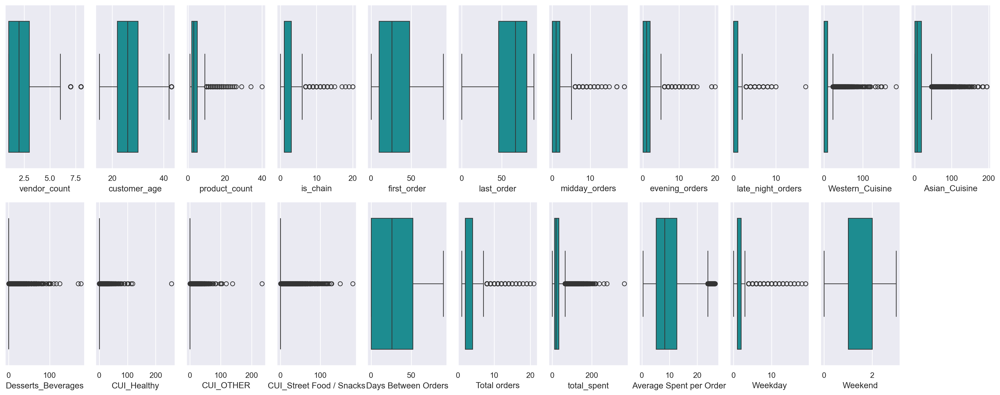

In [243]:
# Filter numerical columns from the DataFrame
numerical_columns = food_df.select_dtypes(include=['int32','int64', 'float64']).columns

# Set the number of rows and columns for the grid
n_cols = 11
n_rows = -(-len(numerical_columns) // n_cols)  # Calculate rows needed

# Set the figure size for readability
plt.figure(figsize=(20, 4 * n_rows))

# Plot each numerical column in a separate horizontal box plot
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.boxplot(data=food_df, x=column, color = colors['BL'])
    plt.xlabel(column)

plt.tight_layout()
plt.show()

In [159]:
# Display the top 5 rows with the largest values in is_chain
food_df.nlargest(5, 'is_chain')

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,Total orders,Total orders_HR,total_spent,Average Spent per Order,Days Between Orders,is_bad_customer,is_one_time_customer
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
d798652ec0,2360,28.0,27,109,83,1,89,NOPROMO,CARD,2.57,28.41,229.22,2.86,0.00,2.84,10.34,58.29,10.43,2.27,0.00,0.00,79.47,7.44,0.00,16,17,10,17,15,8,8,0.0,0,0,0,0,0,0,2,2,2,8,13,17,12,6,7,3,3,6,8,2,0,0,0,62,29,0.0,31,60,4.84,41.68,242.42,91,91,434.14,4.77,88,0,0
92ced2dcb9,2360,23.0,40,269,81,0,88,NOPROMO,CARD,19.08,70.01,37.92,18.30,0.00,739.73,0.00,0.00,0.00,20.11,84.05,197.84,109.31,12.34,109.64,15,17,14,10,9,9,20,0.0,0,0,0,0,0,0,0,0,1,3,9,12,3,4,3,8,14,7,15,9,2,2,2,32,58,4.0,38,56,39.19,1201.27,56.22,94,94,1418.33,15.09,88,0,0
4b5be62a93,2360,33.0,4,88,80,6,88,NOPROMO,DIGI,0.00,61.30,0.00,0.00,6.00,0.00,0.00,0.00,0.00,0.00,113.10,0.00,1.48,0.00,0.00,9,13,13,11,8,12,14,3.0,1,0,0,0,0,0,0,2,0,4,36,9,5,1,0,0,11,6,2,0,0,0,0,57,19,1.0,34,46,6.00,174.40,0.00,80,77,181.88,2.27,82,0,0
e1491fb8f7,2360,17.0,2,75,75,2,89,FREEBIE,CARD,0.00,0.00,173.16,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.18,11,11,14,9,10,10,10,0.0,0,0,0,0,0,1,13,52,4,2,0,0,0,0,0,0,2,1,0,0,0,0,0,71,3,1.0,30,45,0.00,4.18,173.16,75,75,177.34,2.36,87,0,0
89b7866691,2360,20.0,41,110,73,0,88,DELIVERY,DIGI,33.25,0.00,46.60,4.74,12.06,6.08,10.19,13.97,0.00,1.25,15.35,5.55,202.54,1.30,9.89,6,15,15,11,8,13,14,0.0,1,0,1,1,0,0,0,1,3,4,0,0,1,5,16,22,8,6,4,4,1,1,3,14,61,7.0,35,47,46.56,36.87,61.53,82,82,362.77,4.42,88,0,0
